# Preprocessing Text

In [5]:
# UTILS
from collections import Counter
from sklearn.metrics import silhouette_score
import umap
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from gensim.models.coherencemodel import CoherenceModel

#autoencoder
import keras
from keras.layers import Input, Dense
from keras.models import Model
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

# Read Data

In [673]:
df_instagram = pd.read_json('sentiment/sentiment_simple_proc_instagram_dataframe.json')
df_reddit = pd.read_json('sentiment/sentiment_simple_proc_reddit_dataframe.json')
df_reddit_joined = pd.read_json('sentiment/sentiment_simple_proc_reddit_dataframe_joined.json')
df_twitter = pd.read_json('sentiment/sentiment_simple_proc_twitter_dataframe.json')
df_twitter_joined = pd.read_json('sentiment/sentiment_simple_proc_twitter_dataframe_joined.json')
df_tiktok = pd.read_json('sentiment/sentiment_simple_proc_tiktok_dataframe.json')

In [674]:
def apply_binary_sentiment(df, field, neg_prob):
    df[field] = df[neg_prob].apply(lambda t: -1 if t > 0.5 else 1)
    return df

In [675]:
df_instagram = apply_binary_sentiment(df_instagram, 'sentiment', 'negative_prob')
df_reddit = apply_binary_sentiment(df_reddit, 'sentiment', 'negative_prob')
df_reddit_joined = apply_binary_sentiment(df_reddit_joined, 'sentiment', 'negative_prob')
df_twitter = apply_binary_sentiment(df_twitter, 'sentiment', 'negative_prob')
df_twitter_joined = apply_binary_sentiment(df_twitter_joined, 'sentiment', 'negative_prob')
df_tiktok = apply_binary_sentiment(df_tiktok, 'subtitles_sentiment', 'stickerText_negative_prob')
df_tiktok = apply_binary_sentiment(df_tiktok, 'desc_sentiment', 'desc_negative_prob')

In [139]:
len(df_twitter_joined)

265878

# Sentiment Analysis

[Text(0.5, 0, 'TikTok descriptions')]

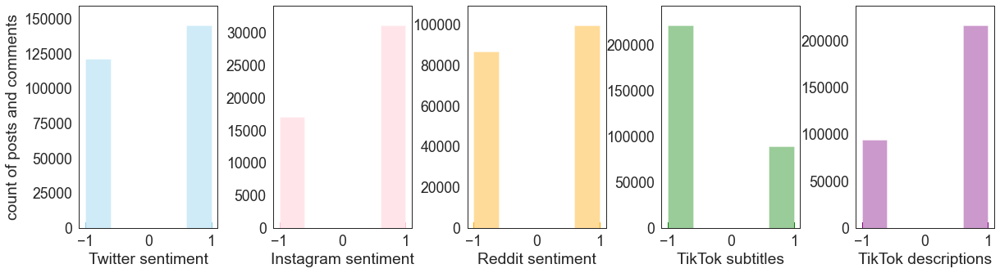

In [140]:
f, axes = plt.subplots(1, 5, figsize=(20, 5), sharex=True)
f.subplots_adjust(hspace=0.4, wspace=0.4)

ax = sns.distplot(df_twitter_joined['sentiment'], 
             kde=False, rug=True, bins=5, label="Twitter", color="skyblue", ax=axes[0])
ax.set(xlabel='Twitter sentiment', ylabel='count of posts and comments')

ax1= sns.distplot(df_instagram['sentiment'], 
             kde=False, rug=True, bins=5, label="Instagram", color="pink", ax=axes[1])
ax1.set(xlabel='Instagram sentiment')

ax2 = sns.distplot(df_reddit_joined['sentiment'], 
             kde=False, rug=True, bins=5, label="Reddit", color="orange", ax=axes[2])
ax2.set(xlabel='Reddit sentiment')

ax3 = sns.distplot(df_tiktok['subtitles_sentiment'], 
             kde=False, rug=True, bins=5, label="TikTok subtitles", color="green", ax=axes[3])
ax3.set(xlabel='TikTok subtitles')

ax4 = sns.distplot(df_tiktok['desc_sentiment'], 
             kde=False, rug=True, bins=5, label="TikTok descriptions", color="purple", ax=axes[4])
ax4.set(xlabel='TikTok descriptions')

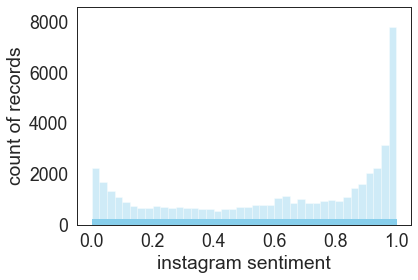

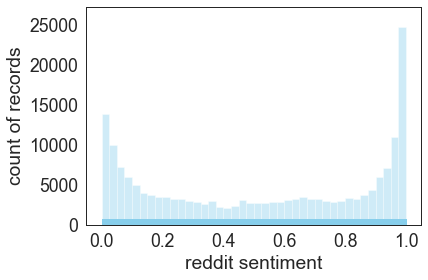

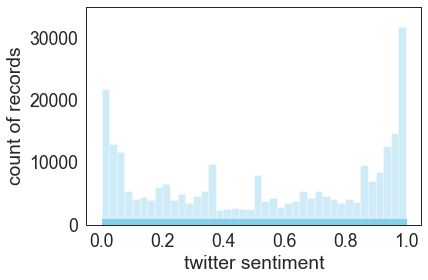

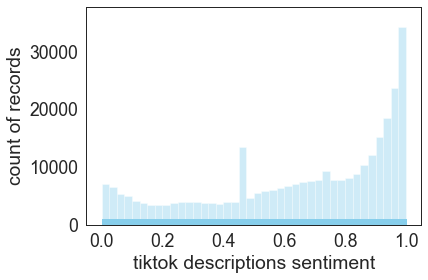

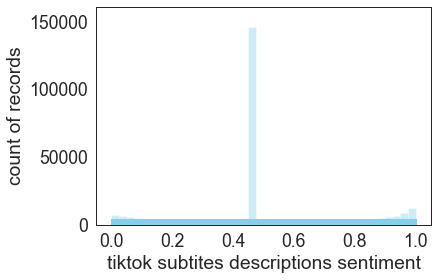

In [141]:
def show_distribution(df, field, type): 
    plt.figure()
    ax = sns.distplot(df[field],kde=False, rug=True, bins=40, label=type, color="skyblue")
    ax.set(xlabel=f'{type} sentiment', ylabel='count of records')
    plt.show()

show_distribution(df_instagram, 'positive_prob', 'instagram')
show_distribution(df_reddit_joined, 'positive_prob', 'reddit')
show_distribution(df_twitter_joined, 'positive_prob', 'twitter')
show_distribution(df_tiktok, 'desc_positive_prob', 'tiktok descriptions')
show_distribution(df_tiktok, 'stickerText_positive_prob', 'tiktok subtites descriptions')

In [142]:
def apply_neutral_sentiment(df, neutr_field, field):
    df[neutr_field] = df[field].apply(lambda t: 1 if t >= 0.675 else -1 if t <= 0.33 else 0)
    return df

df_instagram = apply_neutral_sentiment(df_instagram, 'sentiment_with_neutr', 'positive_prob')
df_reddit_joined = apply_neutral_sentiment(df_reddit_joined, 'sentiment_with_neutr', 'positive_prob')
df_twitter_joined = apply_neutral_sentiment(df_twitter_joined, 'sentiment_with_neutr', 'positive_prob')
df_tiktok = apply_neutral_sentiment(df_tiktok, 'desc_sentiment_with_neutr', 'desc_positive_prob')
df_tiktok = apply_neutral_sentiment(df_tiktok, 'subt_with_neutr', 'stickerText_positive_prob')

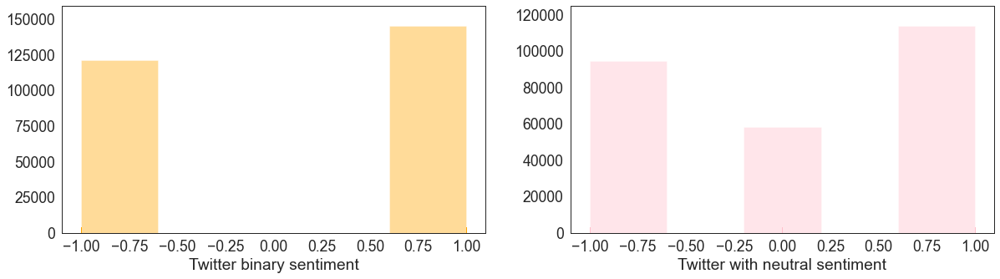

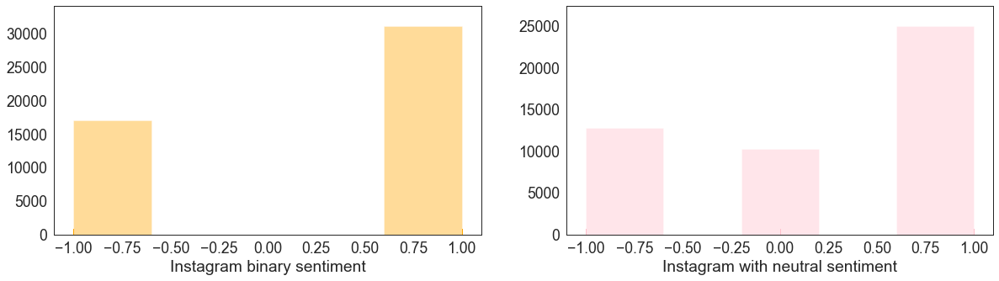

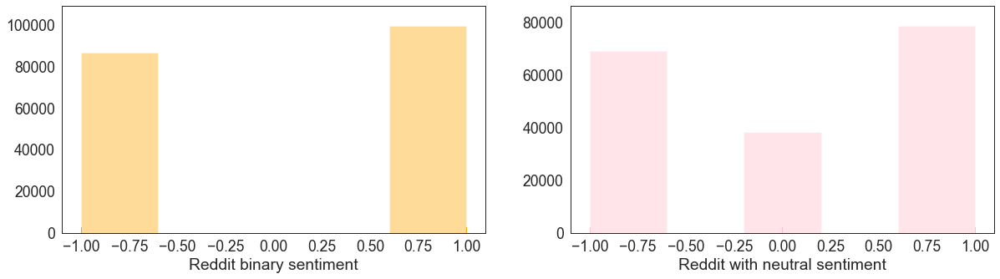

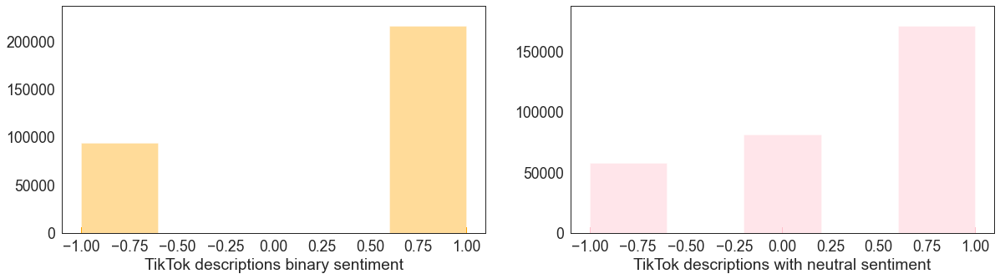

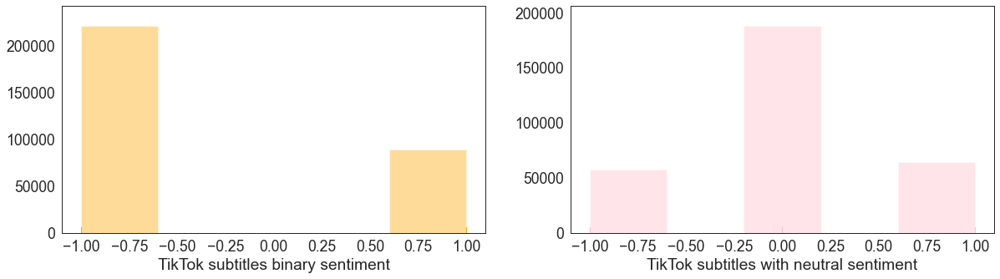

In [143]:
def show_hist(df, name, field, neutr_field):
    f, axes = plt.subplots(1, 2, figsize=(20, 5), sharex=True)

    ax2 = sns.distplot(df[field], 
                 kde=False, rug=True, bins=5, label="Twitter original", color="orange", ax=axes[0])
    ax2.set(xlabel=name+ ' binary sentiment', )

    ax1= sns.distplot(df[neutr_field], 
                 kde=False, rug=True, bins=5, label="Twitter prob", color="pink", ax=axes[1])
    ax1.set(xlabel=name + ' with neutral sentiment')

    plt.show()


show_hist(df_twitter_joined, 'Twitter', 'sentiment', 'sentiment_with_neutr')
show_hist(df_instagram, 'Instagram', 'sentiment', 'sentiment_with_neutr')
show_hist(df_reddit_joined, 'Reddit', 'sentiment', 'sentiment_with_neutr')
show_hist(df_tiktok, 'TikTok descriptions', 'desc_sentiment', 'desc_sentiment_with_neutr')
show_hist(df_tiktok, 'TikTok subtitles', 'subtitles_sentiment', 'subt_with_neutr')

In [443]:
print(f'Negative Twitter: {len(df_twitter_joined[df_twitter_joined["sentiment"] == -1]) / len(df_twitter_joined) * 100}')
print(f'Negative Instagram: {len(df_instagram[df_instagram["sentiment"] == -1]) / len(df_instagram) * 100}')
print(f'Negative Reddit: {len(df_reddit_joined[df_reddit_joined["sentiment"] == -1]) / len(df_reddit_joined) * 100}')
print(f'Negative TikTok descriptions: {len(df_tiktok[df_tiktok["desc_sentiment"] == -1]) / len(df_tiktok) * 100}')
print(f'Negative TikTok subtitles: {len(df_tiktok[df_tiktok["subtitles_sentiment"] == -1]) / len(df_tiktok) * 100}')


Negative Twitter: 45.52651968195939
Negative Instagram: 35.391117866289115
Negative Reddit: 50.62462797051237
Negative TikTok descriptions: 30.380441803384578
Negative TikTok subtitles: 71.30764759075055


## Check Neutral

In [444]:
plt.figure(figsize=(10, 10))
ax = sns.distplot(df_test_twitter_with_neut[df_test_twitter_with_neut['target'] == 2]['sent_proba'], 
             kde=True, bins=50, label="Instagram", color="skyblue")
sns.distplot(df_test_twitter_with_neut[df_test_twitter_with_neut['target'] == 0]['sent_proba'], 
             kde=True, bins=50, label="Instagram", color="red")
sns.distplot(df_test_twitter_with_neut[df_test_twitter_with_neut['target'] == 4]['sent_proba'], 
             kde=True, bins=50, label="Instagram", color="green")
ax.set(xlabel='Twitter test dataset sentiment', ylabel='count of posts and comments')
plt.axvline(0.33, 0, 4, color="yellow")
plt.axvline(0.675, 0, 4, color="pink")
ax.legend(['Min Neutral threshold', 'Max Neutral threshold', 'Negative', 'Neutral', 'Positive'],loc='best')
plt.show()

NameError: name 'df_test_twitter_with_neut' is not defined

<Figure size 720x720 with 0 Axes>

## Twitter

In [525]:
def show_twitter_pop_retweets(df):
    df_twitter_posts = df[df['is_quote_status'] == False]
    df_twitter_with_likes = df_twitter_posts[df_twitter_posts['retweet_count'] > 0]
    df_twitter_pop = df_twitter_with_likes[df_twitter_with_likes.retweet_count >= \
                                                 df_twitter_with_likes.retweet_count.quantile(0.9)]
    df_twitter_unpop = df_twitter_with_likes[df_twitter_with_likes.retweet_count <= \
                                                 df_twitter_with_likes.retweet_count.quantile(0.1)]

    sns.set_context("paper", font_scale=2)
    sns.set_style("white")
    plt.rc('text', usetex=False)
    fig, ax = plt.subplots(figsize=(5,5))
    sns.despine(left=True)

    ax.hist([df_twitter_pop['sentiment'], df_twitter_unpop['sentiment']], 
                  bins=5, label=["Twitter Quatile 0.9" , "Twitter Quantile 0.1"])
    ax.set_xlabel('Sentiment for retweets')
    ax.set_ylabel('Number of texts')
    ax.legend()
    plt.show()

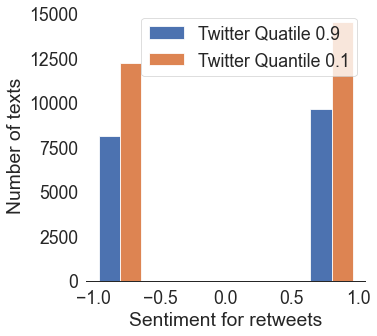

In [526]:
show_twitter_pop_retweets(df_twitter_joined)

In [531]:
def show_twitter_fav(df):
    df_twitter_with_fav = df[df['favorite_count'] > 0]
    df_twitter_pop = df_twitter_with_fav[df_twitter_with_fav.favorite_count >= \
                                                 df_twitter_with_fav.favorite_count.quantile(0.9)]
    df_twitter_unpop = df_twitter_with_likes[df_twitter_with_likes.favorite_count <= \
                                                 df_twitter_with_likes.favorite_count.quantile(0.1)]

    sns.set_context("paper", font_scale=2)
    sns.set_style("white")
    plt.rc('text', usetex=False)
    fig, ax = plt.subplots(figsize=(5,5))
    sns.despine(left=True)

    ax.hist([df_twitter_pop['sentiment'], df_twitter_unpop['sentiment']], 
                  bins=5, label=["Twitter Quatile 0.9" , "Twitter Quantile 0.1"])
    ax.set_xlabel('Sentiment for marked as favorite')
    ax.set_ylabel('Number of texts')
    ax.legend()
    plt.show()
    
    fig, ax = plt.subplots(figsize=(5,5))
    sns.despine(left=True)

    ax.hist([df_twitter_unpop['sentiment']], bins=5, label=[ "Twitter Quantile 0.1"])
    ax.set_xlabel('Sentiment for marked as favorite')
    ax.set_ylabel('Number of texts')
    ax.legend()
    plt.show()

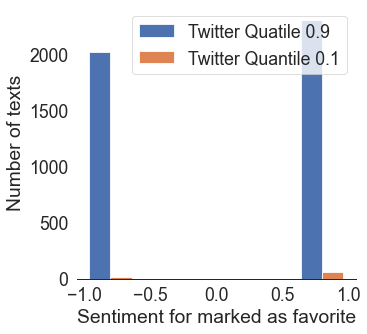

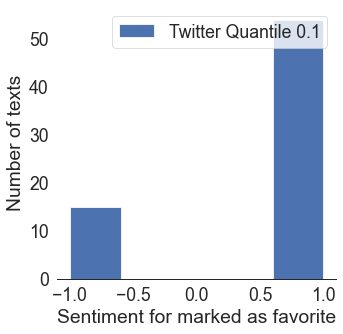

In [530]:
show_twitter_fav(df_twitter_joined)

In [147]:
df_twitter_joined['loc_country'].value_counts()[:20]

US    550
GB    153
IN     83
CA     43
NG     40
AU     28
IE     22
ZA     18
FR     14
RS     14
PK     13
MX     11
ES     10
IT      9
BR      9
KE      8
BE      6
DE      6
PH      5
MY      5
Name: loc_country, dtype: int64

In [148]:
df_twitter_joined['loc_country_name'].value_counts()[:20]

Los Angeles       25
Manhattan         24
Washington        23
Belgrade          14
New Delhi         13
City of London    11
Mumbai            10
Houston            9
Gleneagle          8
Chicago            8
San Francisco      8
Philadelphia       8
Lagos              8
Toronto            8
Atlanta            8
Brooklyn           7
Sydney             7
New Orleans        7
Melbourne          7
St Petersburg      6
Name: loc_country_name, dtype: int64

In [189]:
df_twitter_joined['date_info'] = df_twitter_joined['created_at'].dt.month.map(str) + "-" + df_twitter_joined['created_at'].dt.year.map(str)
df_twitter_joined['year'] = df_twitter_joined['created_at'].dt.year.map(str)

In [190]:
df_twitter_joined['year'].value_counts()

2020    178139
2021     87739
Name: year, dtype: int64

In [191]:
df_twitter_joined['date_info'].value_counts()

6-2020    146312
4-2021     68123
5-2020     31827
5-2021     19616
Name: date_info, dtype: int64

In [551]:
def show_twitter_df_info(_df):
    show_twitter_pop_retweets(_df)
    show_twitter_fav(_df)
    
    f, axes = plt.subplots(1, 2, figsize=(20, 5), sharex=True)
    f.subplots_adjust(hspace=0.4, wspace=0.4)

    ax = sns.distplot(_df['sentiment'], kde=False, rug=True, bins=5, label="Twitter", color="skyblue", ax=axes[0])
    ax.set(xlabel='Twitter sentiment', ylabel='count of posts and comments')

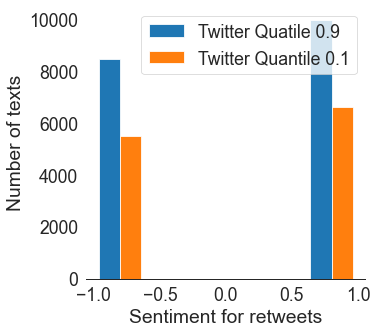

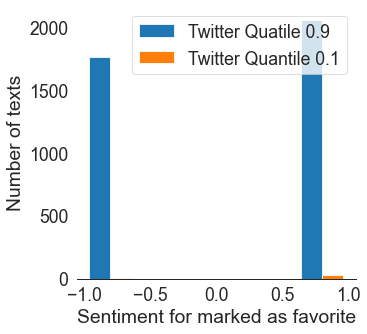

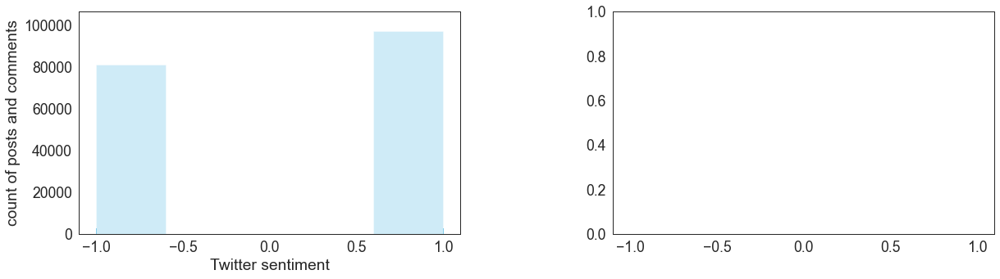

In [192]:
show_twitter_df_info(df_twitter_joined[df_twitter_joined['year'] == '2020'])

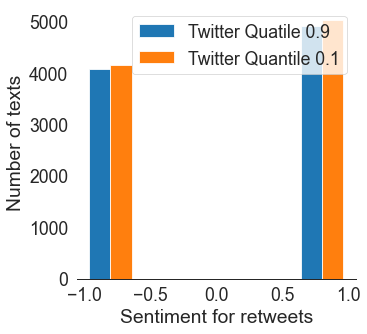

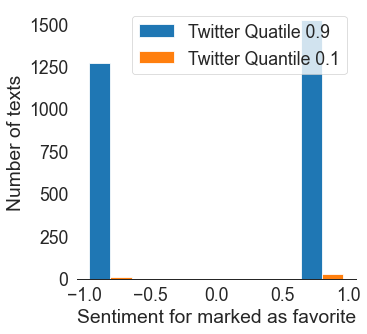

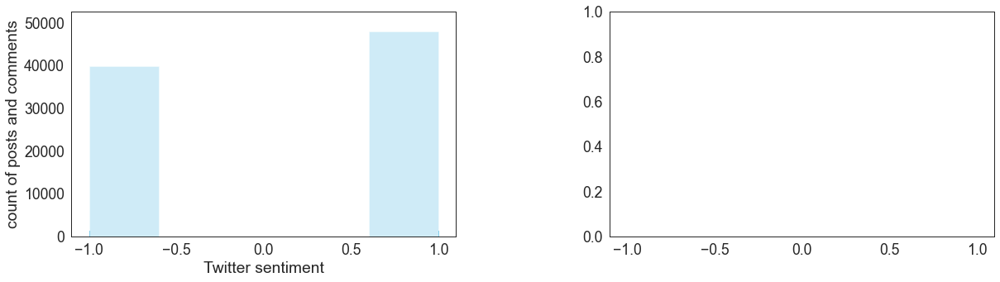

In [193]:
show_twitter_df_info(df_twitter_joined[df_twitter_joined['year'] == '2021'])

<AxesSubplot:title={'center':'Rate of positive to negative records'}, xlabel='year', ylabel='positive to negative rate'>

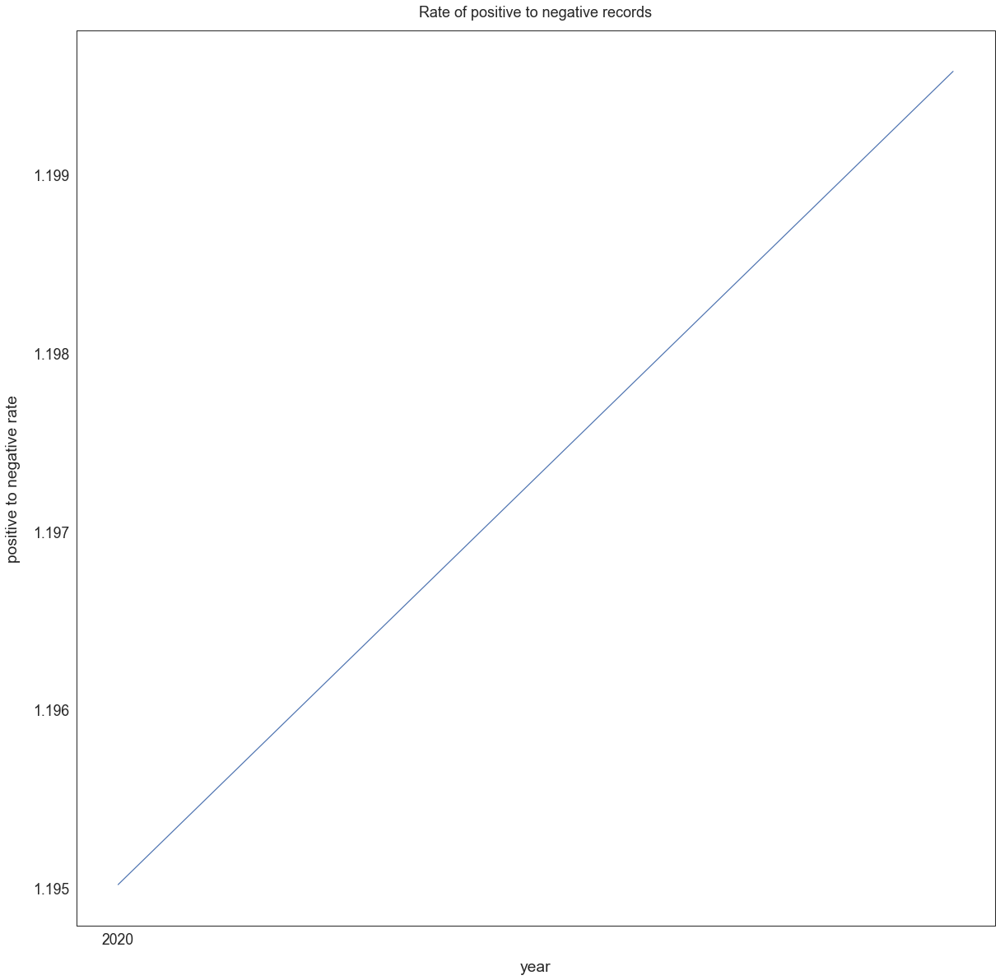

In [533]:
df_twitter_unique_grouped_pos = df_twitter_joined[df_twitter_joined['sentiment'] == 1].groupby(['year']).count()[['id']]
df_twitter_unique_grouped_neg = df_twitter_joined[df_twitter_joined['sentiment'] == -1].groupby(['year']).count()[['id']]

df_twit_joined = df_twitter_unique_grouped_pos.join(df_twitter_unique_grouped_neg, on='year',lsuffix='_pos', rsuffix='_neg')
rate = df_twit_joined['id_pos'] / df_twit_joined['id_neg']

plt.title("Rate of positive to negative records", fontsize=18, y=1.01)
plt.xlabel("year", labelpad=15)
plt.ylabel("positive to negative rate", labelpad=15)
rate.plot()

In [534]:
rate

year
2020    1.195019
2021    1.199579
dtype: float64

In [544]:
twitter_tags = []
for t in df_twitter_joined['tags']:
    twitter_tags.extend(t)

In [680]:
df_twitter_joined['tags_str'] = df_twitter_joined['tags'].apply(lambda t: ' '.join(t))

In [546]:
tags_counter = collections.Counter(twitter_tags)

In [547]:
tags_counter.most_common(10)

[('women', 3876),
 ('Equality', 3087),
 ('feminist', 2819),
 ('womenempowerment', 2631),
 ('equality', 2576),
 ('MeToo', 2560),
 ('HumanRights', 2549),
 ('COVID19', 2315),
 ('8CantWait', 2069),
 ('feminism', 1950)]

Tag: women


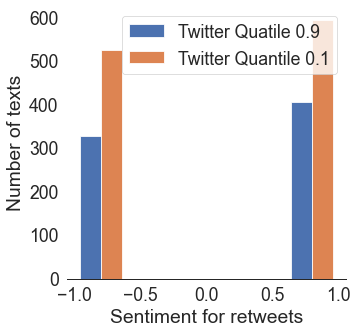

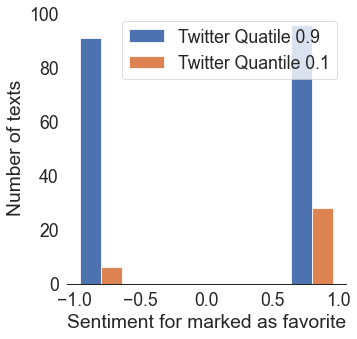

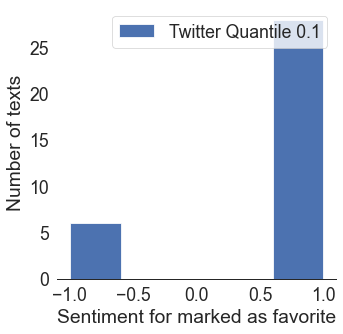

-------------------------------------------------------
Tag: Equality


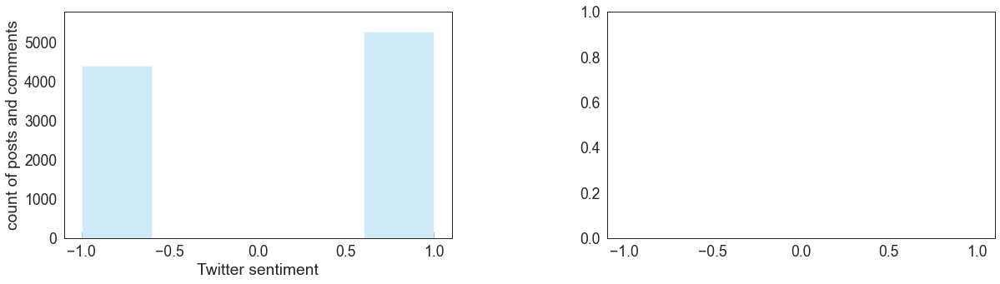

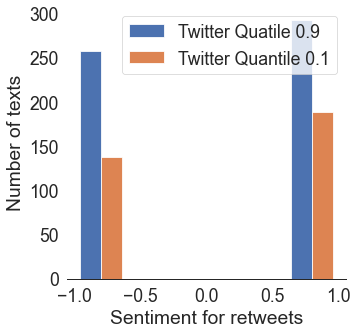

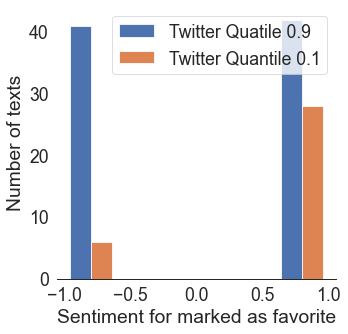

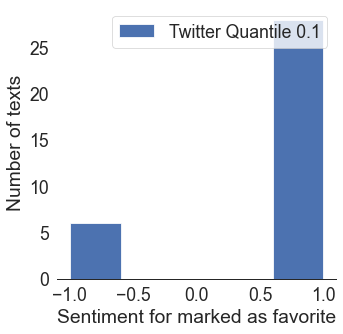

-------------------------------------------------------
Tag: feminist


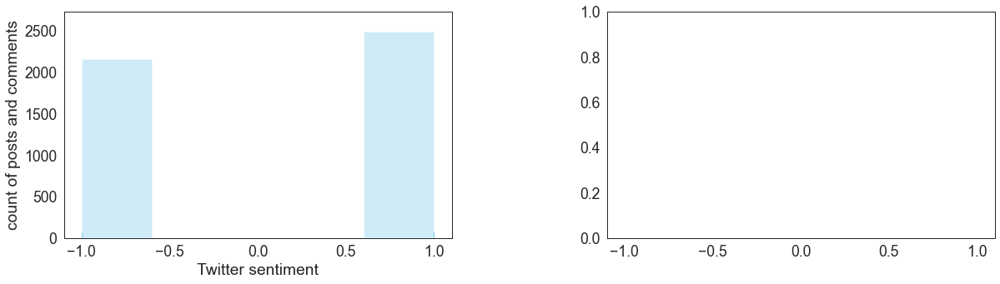

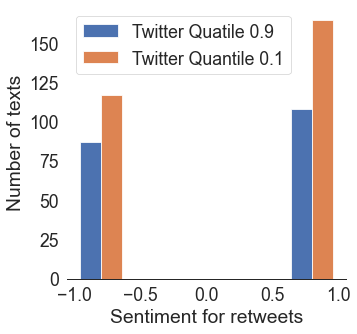

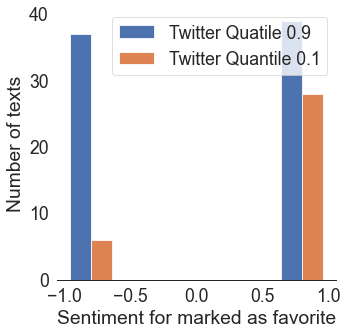

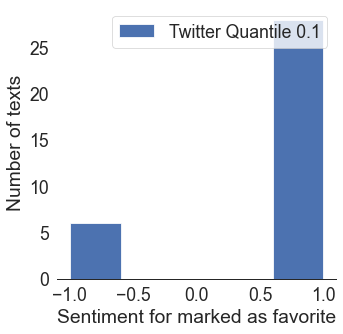

-------------------------------------------------------
Tag: womenempowerment


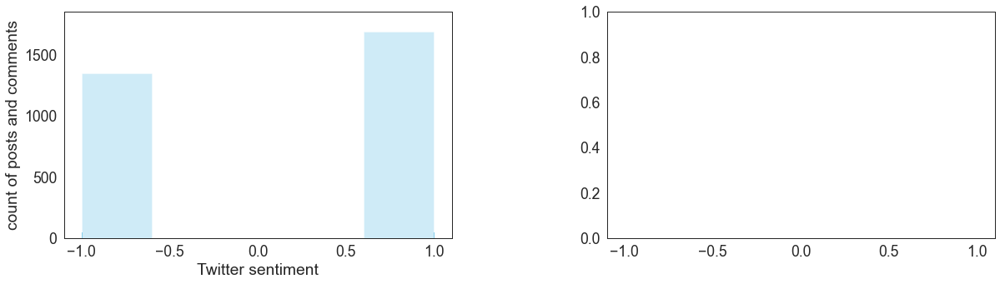

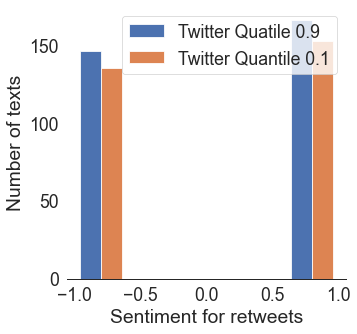

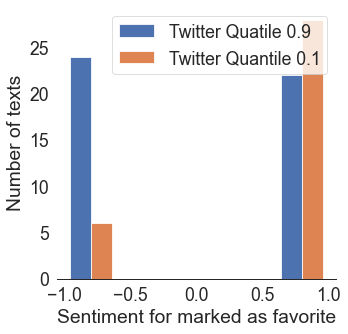

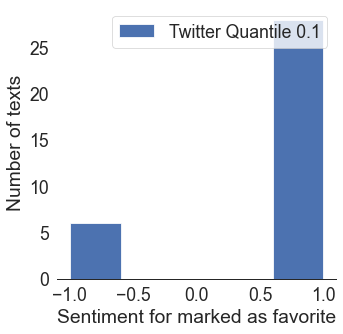

-------------------------------------------------------
Tag: equality


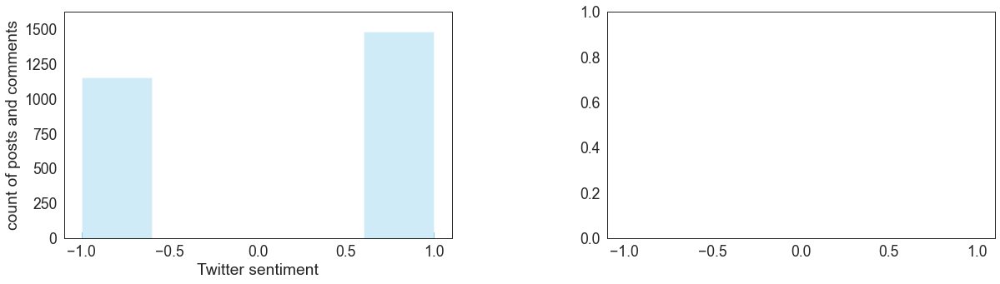

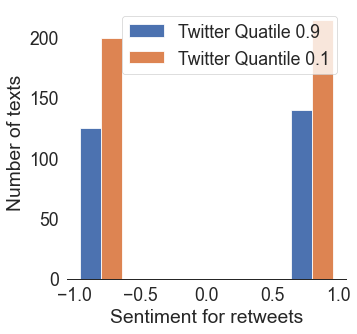

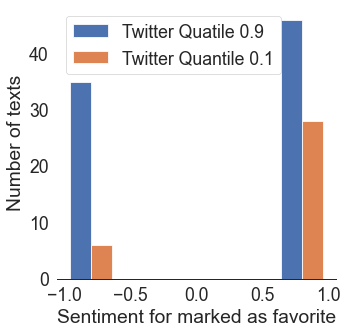

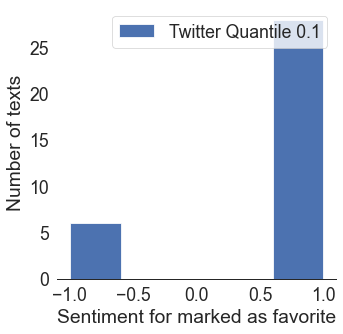

-------------------------------------------------------
Tag: MeToo


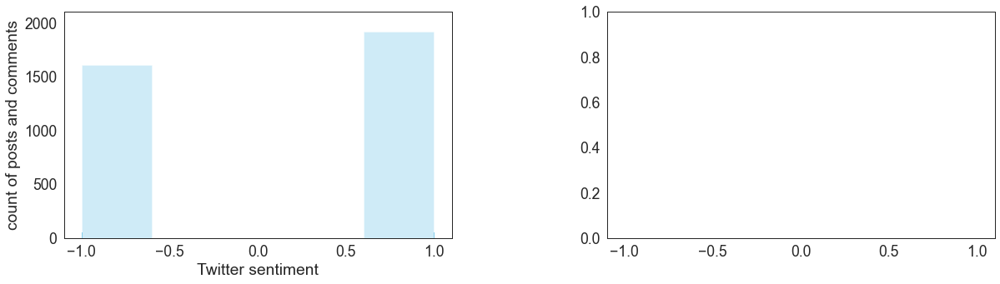

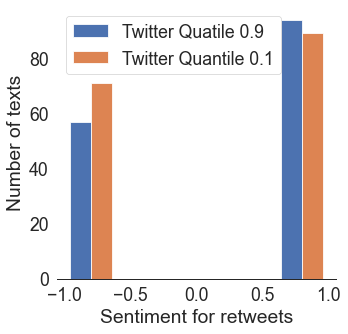

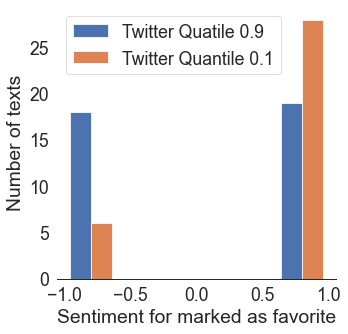

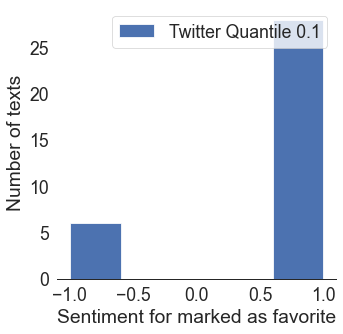

-------------------------------------------------------
Tag: HumanRights


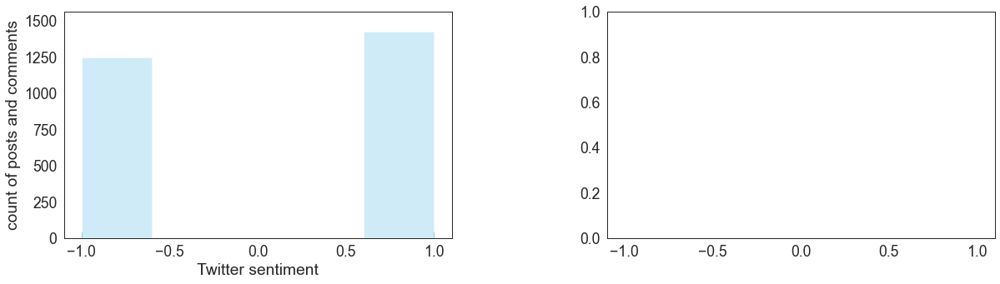

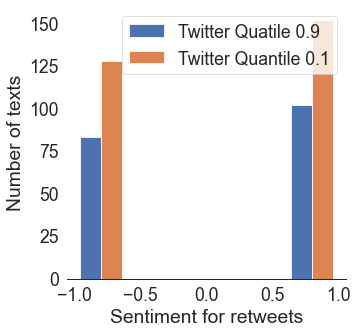

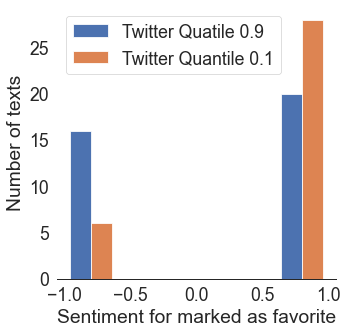

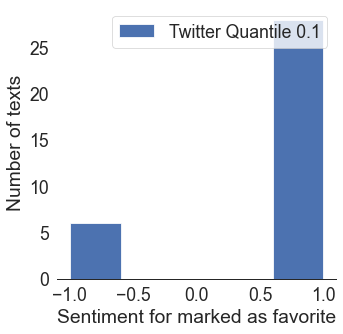

-------------------------------------------------------
Tag: COVID19


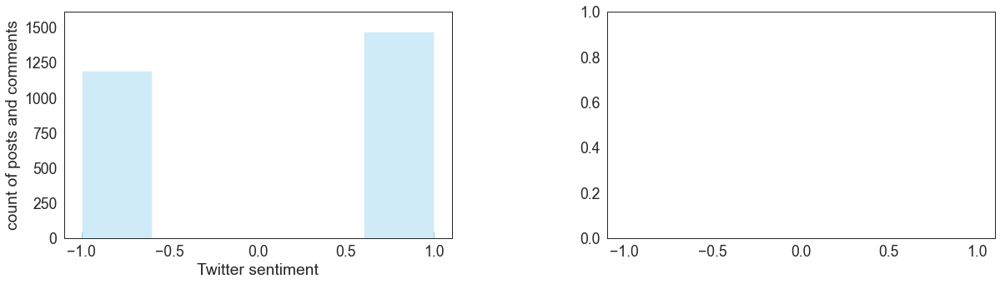

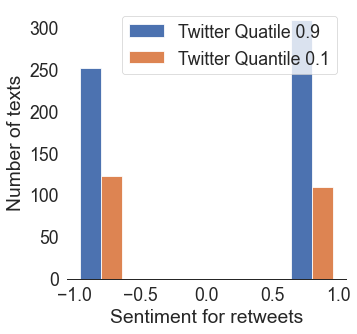

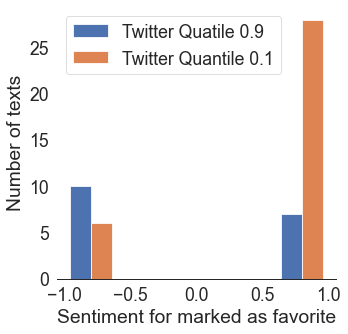

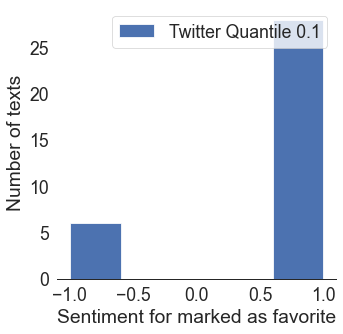

-------------------------------------------------------
Tag: 8CantWait


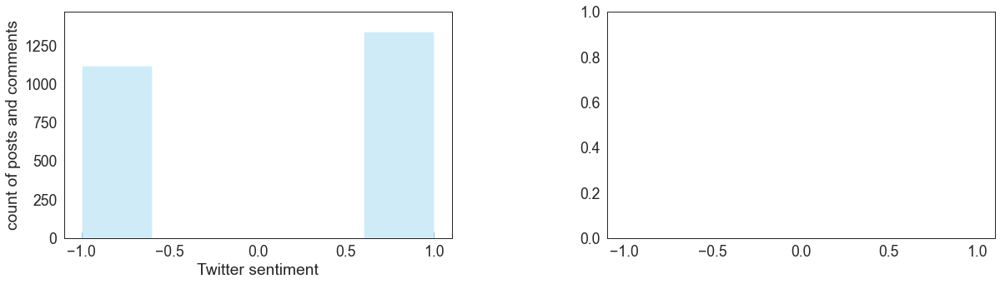

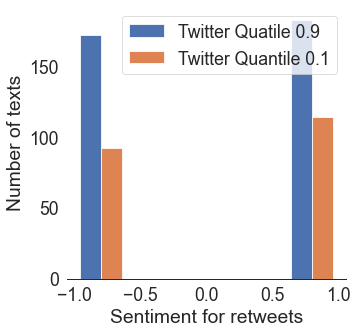

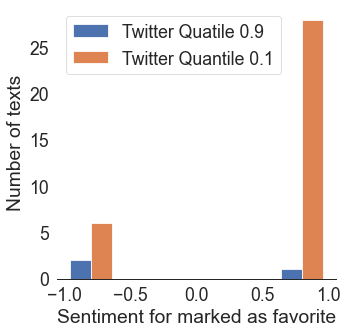

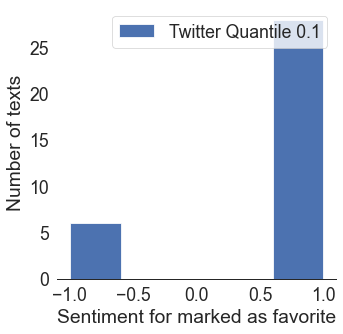

-------------------------------------------------------
Tag: feminism


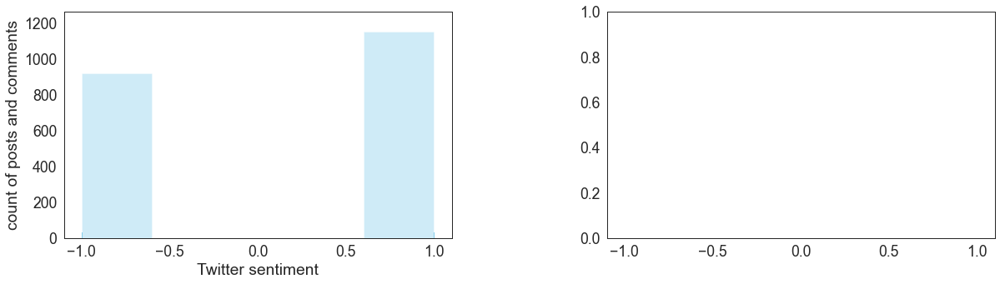

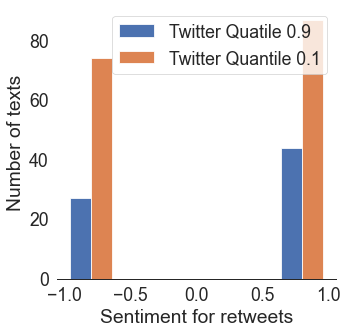

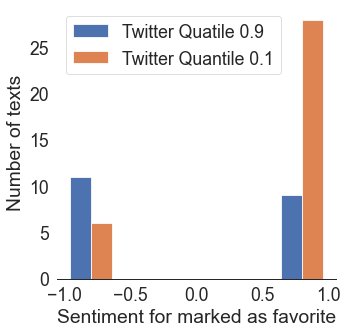

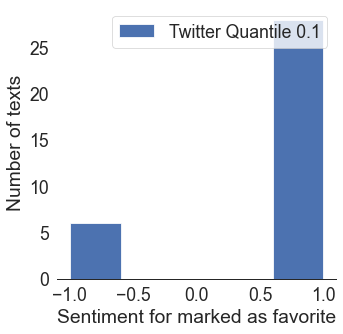

-------------------------------------------------------


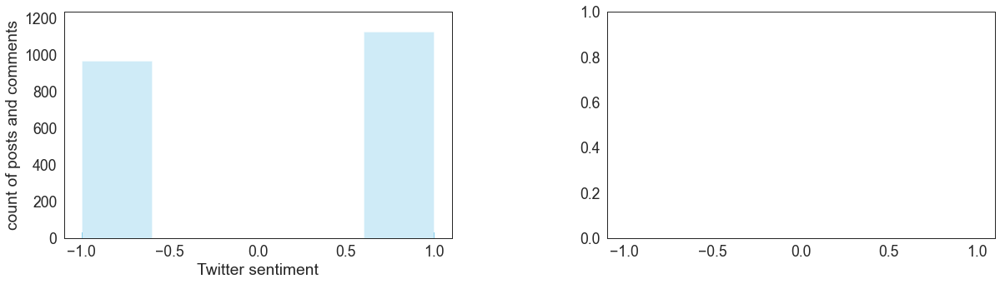

In [552]:
for t in tags_counter.most_common(10):
    tag = t[0]
    print(f'Tag: {tag}')
    _df = df_twitter_joined[df_twitter_joined['tags_str'].str.contains(tag)]
    show_twitter_df_info(_df)
    print('-------------------------------------------------------')

In [555]:
tags = []
positive_rate = []
negative_rate = []
for tag in tags_counter.most_common(50):
    print(tag)
    _df = df_twitter_joined[df_twitter_joined['tags_str'].str.contains(tag[0])]
    if len(_df)> 10:
        tags.append(tag[0])
        pos = len(_df[_df['sentiment'] == 1])
        positive_rate.append(pos / len(_df))
        negative_rate.append(-(1 - pos / len(_df)))
print(list(zip(tags, positive_rate, negative_rate)))

('women', 3876)
('Equality', 3087)
('feminist', 2819)
('womenempowerment', 2631)
('equality', 2576)
('MeToo', 2560)
('HumanRights', 2549)
('COVID19', 2315)
('8CantWait', 2069)
('feminism', 1950)
('Women', 1737)
('love', 1704)
('saraheverard', 1591)
('MOWYCA', 1577)
('NUG', 1576)
('PCSOjuliajames', 1511)
('WomenEmpowerment', 1351)
('metoo', 1335)
('girlpower', 1280)
('TimesUp', 1178)
('IStandWithJKRowling', 1161)
('Iran', 1096)
('LGBTQ', 1087)
('woman', 1085)
('EmpoweringWomen', 1075)
('abortion', 1057)
('Save_male_nurses', 1039)
('GenderEquality', 1027)
('InternationalWomensDay', 1026)
('DeraSachaSauda', 986)
('BlackLivesMatter', 842)
('genderequality', 814)
('Metoo', 775)
('womenintech', 772)
('WhatsHappeningInMyanmar', 760)
('save_male_nurses', 759)
('Feminist', 649)
('Art', 645)
('HeForShe', 625)
('female', 619)
('Feminism', 616)
('humanrights', 612)
('Womanhood', 612)
('MyBodyMyChoice', 569)
('WomensRights', 517)
('painting', 516)
('Myanmar', 506)
('BelieveWomen', 504)
('Woman', 50

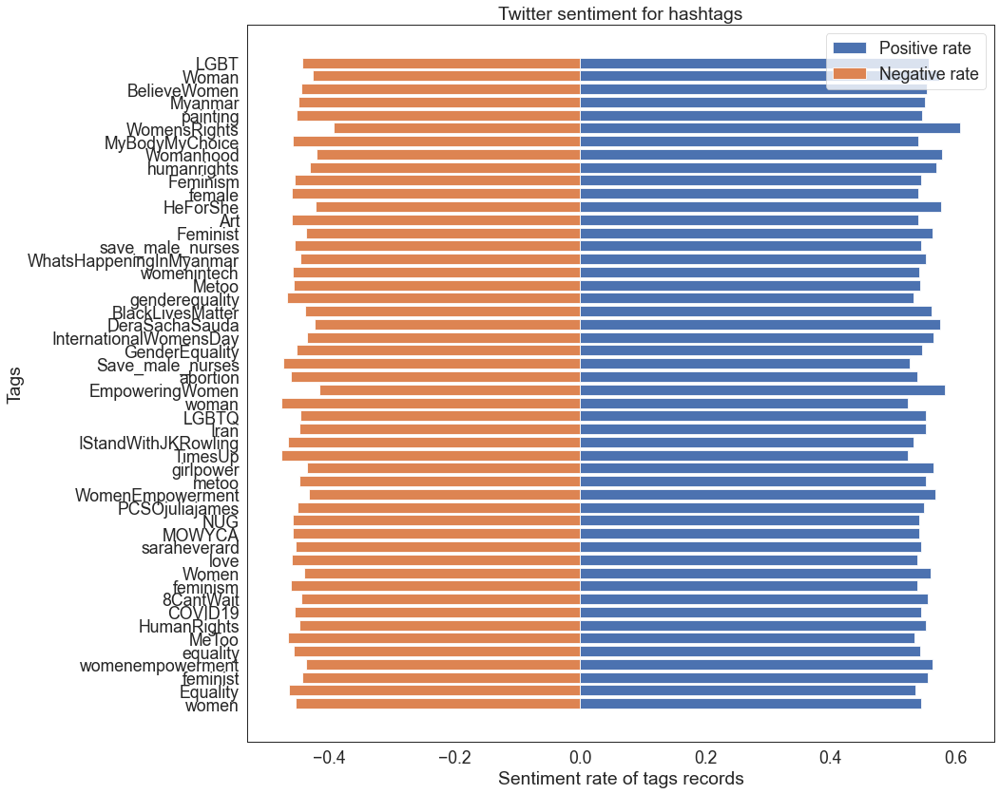

In [559]:
plt.figure(figsize=(15, 12))
plt.barh(tags, positive_rate, align='center', label="Positive rate")

plt.barh(tags, negative_rate, align='center', label="Negative rate")
plt.legend()

plt.ylabel('Tags')
plt.xlabel('Sentiment rate of tags records')
plt.title('Twitter sentiment for hashtags')
plt.tight_layout()
plt.show()

In [572]:
pos_sent = {}
neg_sent = {}
for idx, row in df_twitter_joined.iterrows():
    tags = row['tags']
    for t in tags:
        if row['sentiment'] == 1:
            if t in pos_sent:
                pos_sent[t] += 1
            else:
                pos_sent[t] = 1
        else: 
            if t in neg_sent:
                neg_sent[t] += 1
            else:
                neg_sent[t] = 1

25


In [595]:
more_positive_tags = []
more_negative_tags = []
most_neg = []
most_pos = []
for t in list(set(twitter_tags)):
    _df_pos = pos_sent.get(t, 0)
    _df_neg = neg_sent.get(t, 0)
    if (_df_pos + _df_neg) > 10:
        print(t)
        print(f'positive: {_df_pos}, negative {_df_neg}')
        print('------')
        pos_rate = _df_pos / (_df_pos + _df_neg)
        if pos_rate > 0.5:
            more_positive_tags.append(t)
        if pos_rate > 0.9:
            most_pos.append(t)
        if pos_rate < 0.5:
            more_negative_tags.append(t)
        if pos_rate < 0.1:
            most_neg.append(t)
print(f'Positive tags: {more_positive_tags}')
print(f'Negative tags: {more_negative_tags}')

Technology
positive: 9, negative 13
------
Britain
positive: 6, negative 6
------
essentialoils
positive: 6, negative 5
------
lawyer
positive: 6, negative 9
------
LegalTerrorism
positive: 11, negative 17
------
fierce
positive: 6, negative 8
------
mondaymotivation
positive: 13, negative 8
------
Communism
positive: 11, negative 8
------
ThisIsNotOK
positive: 8, negative 4
------
lesbianvisibilityday
positive: 7, negative 8
------
CoonRapids
positive: 6, negative 5
------
PhD
positive: 6, negative 7
------
Economy
positive: 4, negative 7
------
womenentrepreneurs
positive: 8, negative 15
------
businesses
positive: 6, negative 5
------
FGM
positive: 11, negative 6
------
SexualAssaultAwarenessMonth
positive: 8, negative 9
------
AllHeartsWithSidharth
positive: 16, negative 13
------
rap
positive: 22, negative 14
------
Freedom
positive: 31, negative 26
------
Covid_19
positive: 33, negative 30
------
BBCAN9
positive: 8, negative 3
------
support
positive: 43, negative 38
------
techn

------
quarantine
positive: 5, negative 15
------
America
positive: 35, negative 24
------
Youtube
positive: 11, negative 3
------
bliss
positive: 7, negative 6
------
raiseyourvibration
positive: 19, negative 10
------
GirlGetYourSwagBack
positive: 6, negative 8
------
diana
positive: 10, negative 7
------
tariff
positive: 11, negative 8
------
sunset
positive: 5, negative 7
------
mindset
positive: 30, negative 27
------
website
positive: 6, negative 9
------
leftist
positive: 14, negative 12
------
Face
positive: 29, negative 23
------
QueensBirthdayHonours
positive: 8, negative 5
------
endgunviolence
positive: 7, negative 8
------
JusticeForAhmaud
positive: 9, negative 2
------
model
positive: 23, negative 25
------
cyberabadsheteam
positive: 28, negative 22
------
Palestine
positive: 21, negative 8
------
monday
positive: 7, negative 5
------
LayleenPolanco
positive: 38, negative 34
------
travel
positive: 41, negative 21
------
Plant
positive: 6, negative 7
------
infographic
po

positive: 8, negative 11
------
Womeninbusiness
positive: 13, negative 8
------
Grass
positive: 5, negative 6
------
save_male_nursesI
positive: 161, negative 130
------
WorkingMom
positive: 12, negative 10
------
ProgressTribe
positive: 12, negative 16
------
BlogTour
positive: 16, negative 12
------
Indigenous
positive: 8, negative 4
------
ArtistsRBGIFF
positive: 20, negative 13
------
mensfashion
positive: 13, negative 14
------
HeForShe
positive: 361, negative 264
------
GoKnightsGo
positive: 7, negative 4
------
Compendium
positive: 22, negative 16
------
va
positive: 6, negative 9
------
Digitalisation
positive: 11, negative 4
------
OnlyOneOf
positive: 7, negative 9
------
developers
positive: 21, negative 14
------
ForeignPolicy
positive: 13, negative 10
------
StopTheStigma
positive: 186, negative 162
------
abortionpills
positive: 7, negative 5
------
FIDAUganda
positive: 19, negative 19
------
EqualMeansEqual
positive: 38, negative 30
------
fakecases
positive: 10, negative

positive: 11, negative 9
------
study
positive: 31, negative 21
------
SEO
positive: 253, negative 212
------
femaleempowerment
positive: 72, negative 56
------
Earth
positive: 8, negative 9
------
Periods
positive: 37, negative 36
------
pandemic
positive: 46, negative 37
------
mother
positive: 50, negative 37
------
BorisJohnson
positive: 11, negative 12
------
creative
positive: 13, negative 11
------
IEEE
positive: 9, negative 3
------
justice
positive: 183, negative 159
------
FakeNews
positive: 14, negative 11
------
TickTock
positive: 6, negative 7
------
Relationships
positive: 6, negative 5
------
AntiCapitalism
positive: 11, negative 7
------
Community
positive: 17, negative 1
------
illustration
positive: 35, negative 33
------
SchumanDeclaration
positive: 19, negative 14
------
DILeaders
positive: 7, negative 7
------
JKRowling
positive: 18, negative 9
------
pop
positive: 25, negative 21
------
shopsmall
positive: 5, negative 6
------
TopDownloadedArticle
positive: 8, neg

------
blackexcellence
positive: 10, negative 15
------
TTRPG
positive: 24, negative 19
------
Biased
positive: 12, negative 6
------
pinkprint
positive: 20, negative 27
------
smallbiz
positive: 17, negative 14
------
THINK
positive: 6, negative 8
------
career
positive: 17, negative 11
------
commission
positive: 5, negative 6
------
scicomm
positive: 6, negative 5
------
Microsoft
positive: 10, negative 11
------
bookboost
positive: 4, negative 7
------
HaveWeGotEqualityYet
positive: 13, negative 10
------
international
positive: 3, negative 10
------
onthewater
positive: 15, negative 5
------
LegalExtortion
positive: 7, negative 11
------
50sBornWomen
positive: 31, negative 14
------
May1st
positive: 3, negative 8
------
furry
positive: 12, negative 10
------
PRIDE2020
positive: 5, negative 6
------
Patriarchy
positive: 13, negative 15
------
Activist
positive: 14, negative 7
------
Punjab
positive: 14, negative 12
------
family
positive: 53, negative 66
------
believe
positive: 8,

Pfizer
positive: 8, negative 7
------
homemadecandles
positive: 9, negative 12
------
Mercari
positive: 19, negative 13
------
infosec
positive: 15, negative 5
------
UN75
positive: 7, negative 7
------
genderbasedviolenceawareness
positive: 7, negative 4
------
summer
positive: 17, negative 6
------
cooking
positive: 10, negative 9
------
weasourselves
positive: 7, negative 6
------
ticktock
positive: 3, negative 9
------
society
positive: 23, negative 15
------
ScoMoses
positive: 8, negative 7
------
dignity
positive: 44, negative 24
------
ThandoChannel
positive: 3, negative 13
------
GDDF20
positive: 6, negative 6
------
Roma
positive: 70, negative 58
------
beautifulwomen
positive: 8, negative 6
------
documentary
positive: 12, negative 10
------
internationalwomensday2021
positive: 8, negative 7
------
photooftheday
positive: 45, negative 33
------
peace
positive: 58, negative 42
------
harassment
positive: 7, negative 5
------
Respect
positive: 19, negative 21
------
Facts
posit

In [596]:
most_neg

[]

In [597]:
most_pos

['Jumpsuits',
 'Jumpsuit',
 'Redd',
 'Media',
 'Westminster',
 'TechGirlz',
 'Community',
 'consent',
 'HumansOfIT',
 'Automated',
 'NCCRWomen']

In [590]:
len(more_positive_tags) / (len(more_negative_tags) + len(more_positive_tags))

0.6881968473663975

In [591]:
more_negative_tags

['Technology',
 'lawyer',
 'LegalTerrorism',
 'fierce',
 'lesbianvisibilityday',
 'PhD',
 'Economy',
 'womenentrepreneurs',
 'SexualAssaultAwarenessMonth',
 'iron',
 'cryptoart',
 'bollywoodmaniac',
 'dayton',
 'nohate',
 'Colombia',
 'blogtour',
 'Vodafone',
 'Seattle',
 'outcome',
 'bothsidesnow',
 'singlemothers',
 'artistsontwitter',
 'JoeBiden2020',
 'Apparel',
 'CMO',
 'cdnpoli',
 'tweegram',
 'Humanrights',
 'mixedmedia',
 'cleanwater',
 'entrepreneurs',
 'science',
 'Painting',
 'Law',
 'PictureOfTheDay',
 'CountessofWessex',
 'Antifa',
 'eighties',
 'Outdoors',
 'BLACKLIVESMATTER',
 'lips',
 'blood',
 'DOGE',
 'regions',
 'nWo',
 'IThoughtItWasJustAPartOfLife',
 'AFLPiesSuns',
 '1980sgirl',
 'Godslaws',
 'powerful',
 'library',
 'TarnishedBadge',
 'vegan',
 'Ghana',
 'hiddenhistory',
 'TaraReade',
 'accessibility',
 'Baha',
 'TerroristTedrosMustGo',
 'victim',
 'Nails',
 'wednesdaythought',
 'Pregnant',
 'artist',
 'stayhome',
 'ClimateCrisis',
 'MadameSpeaker',
 'Fintech',
 '

In [39]:
df_twitter.head()

,id,text,retweet,created_at,tags,is_quote_status,retweet_count,favorite_count,possibly_sensitive,loc_country,loc_country_name,text_proc_simple,target,txt,negative_prob,positive_prob,sentiment
0,1388120465714016262,That moment of relief is real.\n\nUse #ECP for...,1,2021-04-30 13:18:03,"[ECP, Chennai, SRHR]",False,1,0,0,IN,Chennai,moment relief real ecp emergency purpose pill ...,1,moment relief real ecp emergency purpose pill ...,0.000720,0.999280,1
1,1387474394616766465,I still would like to know why politicians get...,0,2021-04-28 18:30:48,[MyBodyMyChoice],True,0,1,0,US,Phoenix,politician body mybodymychoice,1,politician body mybodymychoice,0.407856,0.592144,1
2,1387031713256194050,📢 The only person who should make choices over...,6,2021-04-27 13:11:44,[],False,6,11,0,SZ,Swaziland,loudspeaker person choice body future join mil...,1,loudspeaker person choice body future join mil...,0.011121,0.988879,1
3,1386641940314218499,I'm not going on the pill. #MyBodyMyChoice #Dr...,0,2021-04-26 11:22:55,"[MyBodyMyChoice, DrugsAreForMugs]",False,0,0,0,GB,Milton Keynes,pill mybodymychoice drugsareformugs,1,pill mybodymychoice drugsareformugs,0.934881,0.065119,-1
4,1387692021092163587,And this is a government that denies the exist...,5,2021-04-29 08:55:34,[],False,5,4,0,GB,Brent,government denies existence institutional raci...,1,government denies existence institutional raci...,0.001180,0.998820,1


## Instagram

In [194]:
df_instagram.head()

,Unnamed: 0,id,parent_id,tag,text,ts,likes,is_comment,comments_count,location_name,...,tags,text_proc_tm,text_proc,text_proc_simple,target,txt,negative_prob,positive_prob,sentiment,sentiment_with_neutr
0,0,2304727226113192671,NaN,feminismo,Quem mais???\n.\n.\n#ebook #amazon #brasil #li...,1588964916,3527,False,58,None,...,"['empodere', 'book', 'empoderamento', 'female'...",quem mais ebook amazon brasil livros leia leia...,quem mais ebook amazon brasil livros leia leia...,quem mais ebook amaon brasil livros leia leiag...,1,quem mais ebook amaon brasil livros leia leiag...,0.123702,0.876298,1,1
1,1,17862460147860155,2.304727e+18,feminismo,Todo santo dia,1588966189,0,True,0,None,...,None,todo santo dia,todo santo dia,todo santo dia,1,todo santo dia,0.006302,0.993698,1,1
2,4,18089176312198189,2.304727e+18,feminismo,🙌,1588966796,0,True,0,None,...,None,None,raise hand,raisinghands,1,raisinghands,0.998605,0.001395,-1,-1
3,5,17850895976056651,2.304727e+18,feminismo,☝️,1588967072,0,True,0,None,...,None,None,point,indexpointingup,1,indexpointingup,0.924755,0.075245,-1,-1
4,8,17950967938329709,2.304727e+18,feminismo,A gente não tem um minuto de paz!!!,1588967933,0,True,0,None,...,None,gente tem um minute de pa,gente tem um minute de pa,gente nao tem um minuto pa,1,gente nao tem um minuto pa,0.129114,0.870886,1,1


In [465]:
def show_instagram_likes(df, rate=0):
    df_instagram_unique_with_likes = df[df.likes > rate]
    df_instagram_unique_without_likes = df[(df.likes == 0) & (df.is_comment == False)]
    df_inst_unpop = df_instagram_unique_with_likes[df_instagram_unique_with_likes.likes <= df_instagram_unique_with_likes.likes.quantile(0.1)]
    df_inst_pop = df_instagram_unique_with_likes[df_instagram_unique_with_likes.likes >= df_instagram_unique_with_likes.likes.quantile(0.9)]

    sns.set_context("paper", font_scale=2)
    sns.set_style("white")
    plt.rc('text', usetex=False)
    fig, ax = plt.subplots(figsize=(5,5))
    sns.despine(left=True)

    ax.hist([df_inst_pop['sentiment'], df_inst_unpop['sentiment']], 
                  bins=5, label=["Instagram Quantile 0.9" , "Instagram Quantile 0.1"])
    ax.set_xlabel('Instagram Sentiment')
    ax.set_ylabel('Number of texts')
    ax.legend()
    plt.show()
 
    sns.set_context("paper", font_scale=2)
    sns.set_style("white")
    plt.rc('text', usetex=False)
    fig, ax = plt.subplots(figsize=(5,5))
    sns.despine(left=True)

    ax.hist([df_instagram_unique_without_likes['sentiment']], 
                  bins=5, label=["Instagram not liked"])
    ax.set_xlabel('Instagram Sentiment')
    ax.set_ylabel('Number of texts')
    ax.legend()
    plt.show()


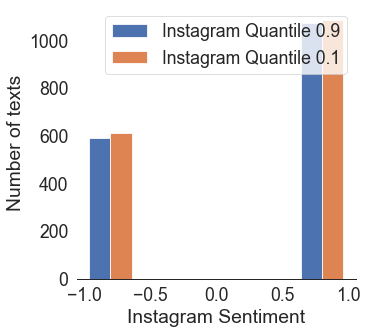

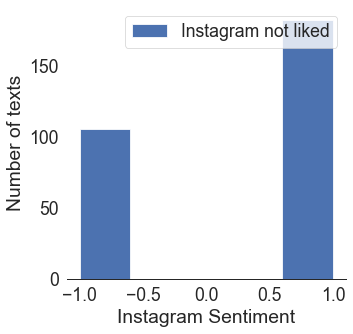

In [466]:
show_instagram_likes(df_instagram)

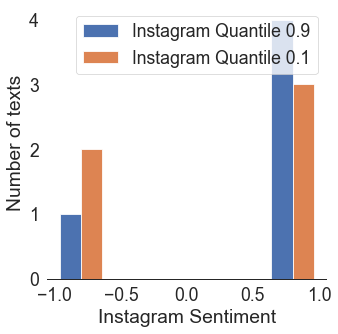

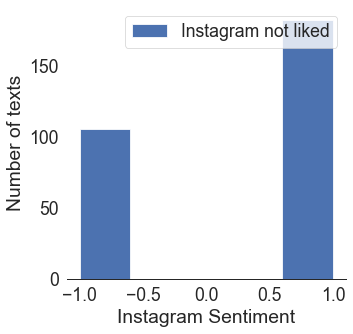

In [467]:
show_instagram_likes(df_instagram, 100000)

In [207]:
def show_posts_comments_info(df):
    len_posts = len(df[df['is_comment'] == False])
    len_neg_posts = len(df[(df['is_comment'] == False) & (df['sentiment'] == -1)])
    print('posts', len_neg_posts/len_posts*100)
    len_com = len(df[df['is_comment'] == True])
    len_neg_com = len(df[(df['is_comment'] == True) & (df['sentiment'] == -1)])
    print('comments', len_neg_com/len_com*100)
    sns.set_context("paper", font_scale=2)
    sns.set_style("white")
    plt.rc('text', usetex=False)
    fig, ax = plt.subplots(figsize=(5,5))
    sns.despine(left=True)

    ax.hist([df[df['is_comment'] == False]['sentiment'],
             df[df['is_comment'] == True]['sentiment']], 
                  bins=5, label=["Instagram Posts" , "Instagram Comments"])
    ax.set_xlabel('Sentiment')
    ax.set_ylabel('Number of texts')
    ax.legend()
    plt.show()

posts 35.40570888245376
comments 35.38318117526038


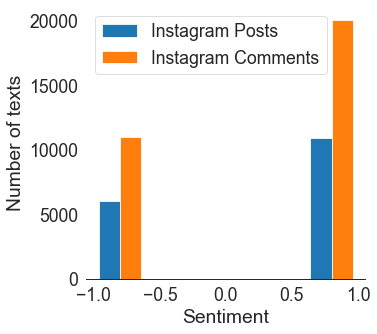

In [208]:
show_posts_comments_info(df_instagram)

In [211]:
df_instagram['date'] = df_instagram['ts'].apply(lambda t: pd.to_datetime(t, unit='s'))

In [214]:
df_instagram['date_info'] = df_instagram['date'].dt.month.map(str) + "-" + df_instagram['date'].dt.year.map(str)
df_instagram['year'] = df_instagram['date'].dt.year.map(str)

df_instagram_unique_grouped_pos = df_instagram[df_instagram['sentiment'] == 1].groupby(['year']).count()[['id']]
df_instagram_unique_grouped_neg = df_instagram[df_instagram['sentiment'] == -1].groupby(['year']).count()[['id']]

df_inst_joined = df_instagram_unique_grouped_pos.join(df_instagram_unique_grouped_neg, on='year',lsuffix='_pos', rsuffix='_neg')


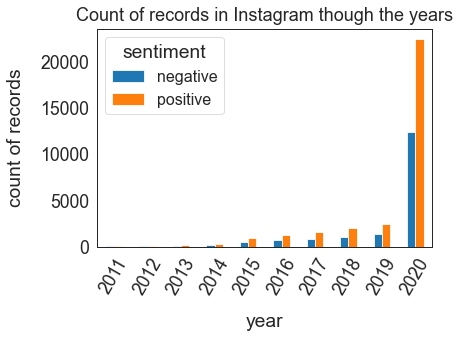

In [215]:
df_inst_joined[['id_neg', 'id_pos']].plot(kind='bar')
plt.xticks(rotation=60)
plt.title("Count of records in Instagram though the years", fontsize=18, y=1.01)
plt.xlabel("year", labelpad=15)
plt.ylabel("count of records", labelpad=15)
plt.legend(["negative", "positive"], fontsize=16, title="sentiment");

In [216]:
rate = df_inst_joined['id_pos']/df_inst_joined['id_neg']

<AxesSubplot:title={'center':'Rate of positive to negative records'}, xlabel='year', ylabel='positive to negative rate'>

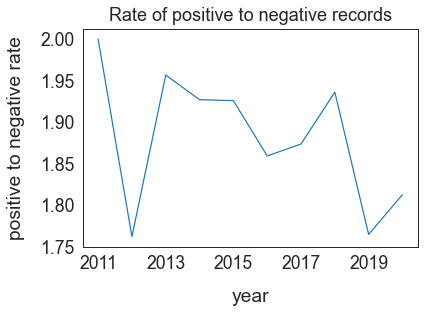

In [217]:
plt.title("Rate of positive to negative records", fontsize=18, y=1.01)
plt.xlabel("year", labelpad=15)
plt.ylabel("positive to negative rate", labelpad=15)
rate.plot()

<Figure size 2880x2160 with 0 Axes>

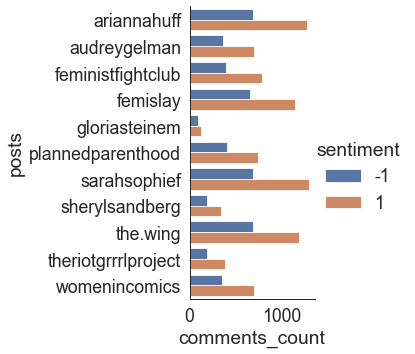

In [468]:
df_inst_tag = df_instagram[df_instagram['is_comment']==False].groupby(['tag', 'sentiment']).count().reset_index()

plt.figure(figsize=(40,30))
g = sns.catplot(y="tag", x="comments_count", hue="sentiment", data=df_inst_tag[df_inst_tag['id'] >80],kind="bar")
g.set_ylabels("posts")

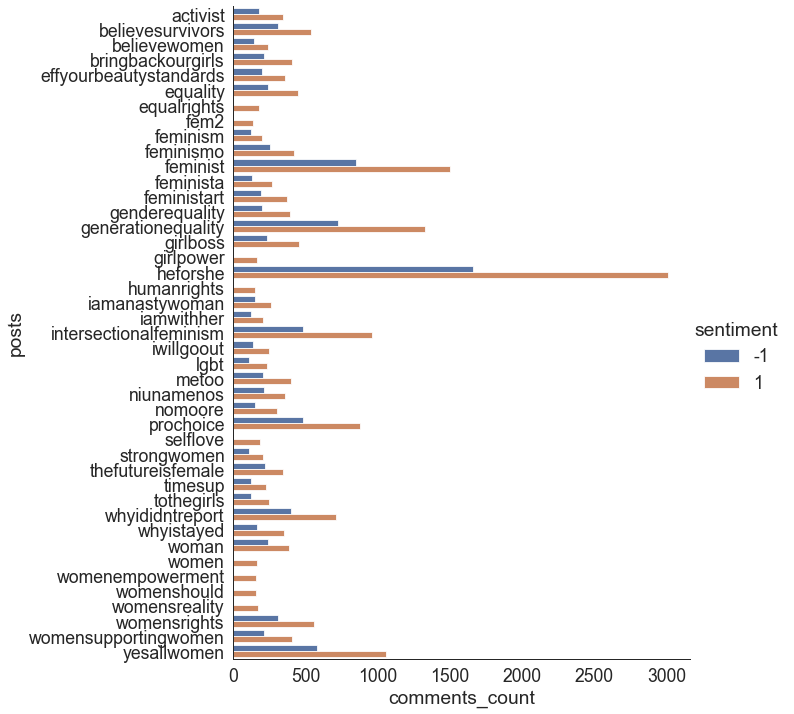

In [489]:
df_inst_tag = df_instagram[df_instagram['is_comment']==True].groupby(['tag', 'sentiment']).count().reset_index()

g = sns.catplot(y="tag", x="comments_count", hue="sentiment", 
                data=df_inst_tag[df_inst_tag['id'] > 100],kind="bar", height=10,
                aspect=1)
g.set_ylabels("posts")

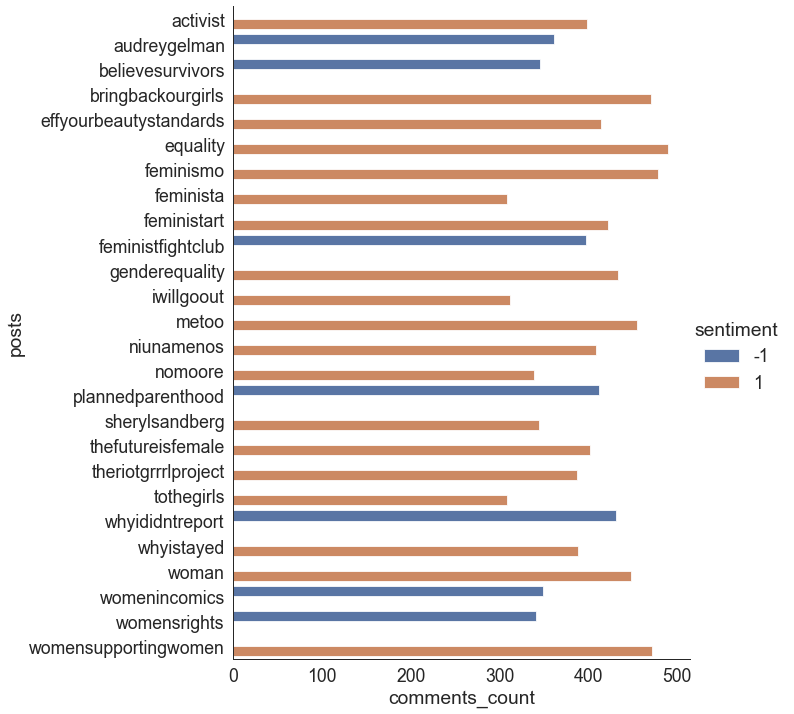

In [494]:
df_inst_tag = df_instagram.groupby(['tag', 'sentiment']).count().reset_index()

g = sns.catplot(y="tag", x="comments_count", hue="sentiment",
                data=df_inst_tag[(df_inst_tag['id'] > 300) & (df_inst_tag['id'] < 500)],
                kind="bar", height=10,
                aspect=1)
g.set_ylabels("posts")

In [517]:
df_inst_tag = df_instagram[df_instagram['is_comment']==True].groupby(['tag', 'sentiment']).count().reset_index()

more_positive_tags = []
more_negative_tags = []
for t in instagram_tags:
    print(t)
    _df_pos = df_inst_tag[(df_inst_tag['tag'] == t) & (df_inst_tag['sentiment'] == 1)]['text'].values
    _df_pos = 0 if len(_df_pos) == 0 else _df_pos[0]
    _df_neg = df_inst_tag[(df_inst_tag['tag'] == t) & (df_inst_tag['sentiment'] == -1)]['text'].values
    _df_neg = 0 if len(_df_neg) == 0 else _df_neg[0]
    if (_df_pos + _df_neg) > 0:
        print(f'positive: {_df_pos}, negative {_df_neg}')
        print('------')
        pos_rate = _df_pos / (_df_pos + _df_neg)
        if pos_rate > 0.5:
            more_positive_tags.append(t)
        if pos_rate < 0.5:
            more_negative_tags.append(t)
print(f'Positive tags: {more_positive_tags}')
print(f'Negative tags: {more_negative_tags}')

sadgirlsclub
women
positive: 166, negative 100
------
timesupnow
effyourbeautystandards
positive: 359, negative 196
------
audreygelman
generationequality
positive: 1329, negative 724
------
activist
positive: 344, negative 179
------
thefutureisfemale
positive: 345, negative 220
------
sarahsophief
womenempowerment
positive: 157, negative 100
------
iwillgoout
positive: 247, negative 134
------
bumble
girlpower
positive: 166, negative 85
------
bringbackourgirls
positive: 404, negative 216
------
womensrights
positive: 560, negative 311
------
prochoice
positive: 877, negative 485
------
iamanastywoman
positive: 260, negative 149
------
whyistayed
positive: 349, negative 164
------
issarae
humanrights
positive: 152, negative 76
------
equalrights
positive: 175, negative 91
------
timesup
positive: 226, negative 123
------
feministfightclub
theriotgrrrlproject
believewomen
positive: 238, negative 143
------
womensupportingwomen
positive: 408, negative 215
------
intersectionalfeminism


## Reddit

In [265]:
df_reddit_joined = df_reddit_joined.append(df_reddit)
df_reddit_joined.drop_duplicates(subset=['id'], inplace=True)

In [240]:
def show_reddit_liked(df):
    df_reddit_unique_with_likes = df[df['score'] != 0]
    df_reddit_unpop = df_reddit_unique_with_likes[df_reddit_unique_with_likes.score \
                                                <= df_reddit_unique_with_likes.score.quantile(0.1)]
    df_reddit_pop = df_reddit_unique_with_likes[df_reddit_unique_with_likes.score \
                                                >= df_reddit_unique_with_likes.score.quantile(0.9)]

    sns.set_context("paper", font_scale=2)
    sns.set_style("white")
    plt.rc('text', usetex=False)
    fig, ax = plt.subplots(figsize=(5,5))
    sns.despine(left=True)

    ax.hist([df_reddit_pop['sentiment'], df_reddit_unpop['sentiment']], 
                  bins=5, label=["Reddit Quatile 0.9" , "Reddit Quantile 0.1"])
    ax.set_xlabel('Sentiment')
    ax.set_ylabel('Number of texts')
    ax.legend()
    plt.show()

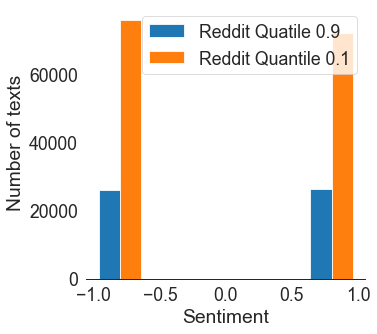

In [268]:
show_reddit_liked(df_reddit_joined)

In [269]:
subreddits = list(set(df_reddit_joined['subreddit_topic'].values))

In [598]:
def show_reddit_df_info(_df):
    show_reddit_liked(_df)
    
    f, axes = plt.subplots(1, 2, figsize=(20, 5), sharex=True)
    f.subplots_adjust(hspace=0.4, wspace=0.4)

    ax = sns.distplot(_df['sentiment'], kde=False, rug=True, bins=5, label="Reddit", color="skyblue", ax=axes[0])
    ax.set(xlabel='Reddit sentiment', ylabel='count of posts and comments')
    plt.show()

subreddit women.json, size 2000


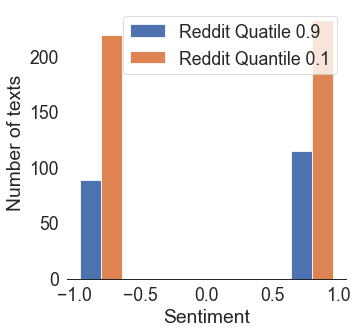

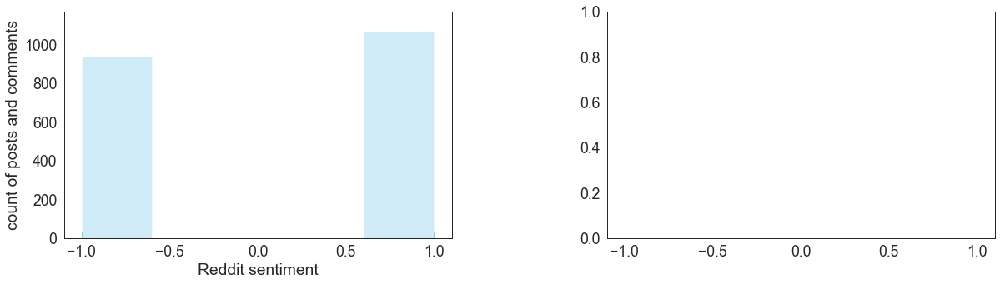

subreddit subreddit_Feminism.json, size 33391


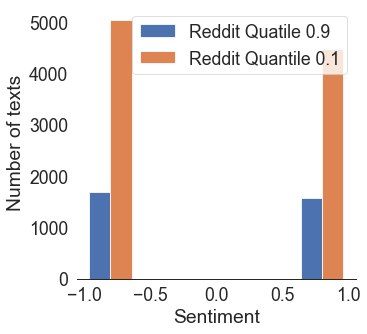

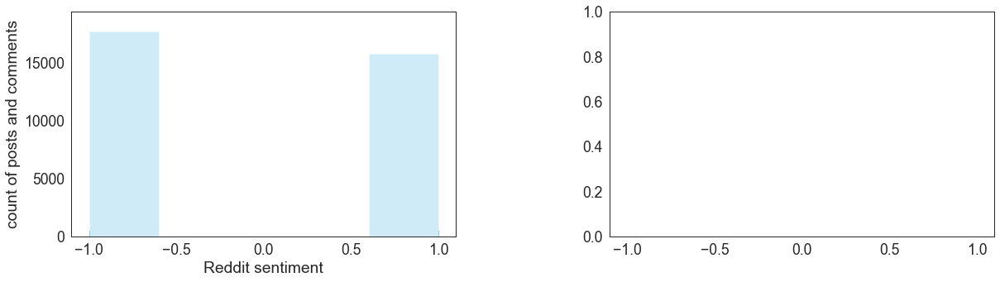

subreddit subreddit_titleix.json, size 129


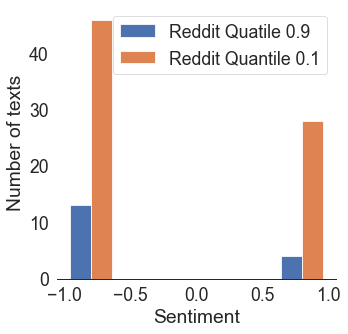

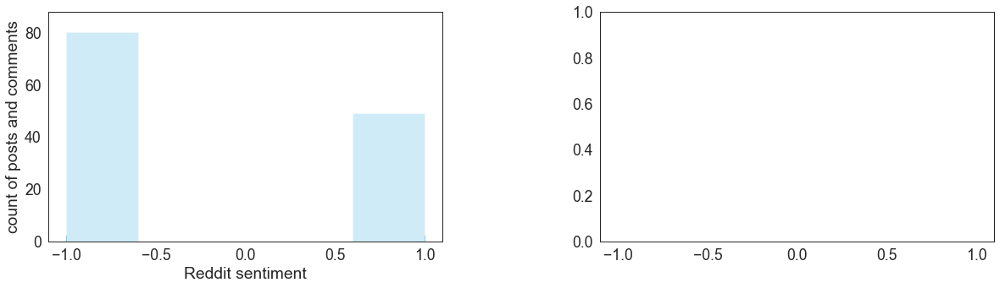

subreddit ContraPoints.json, size 700


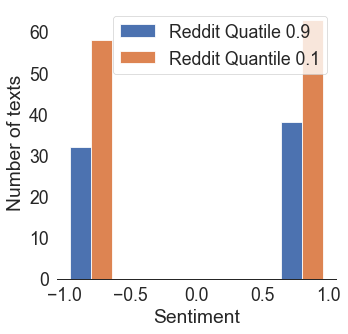

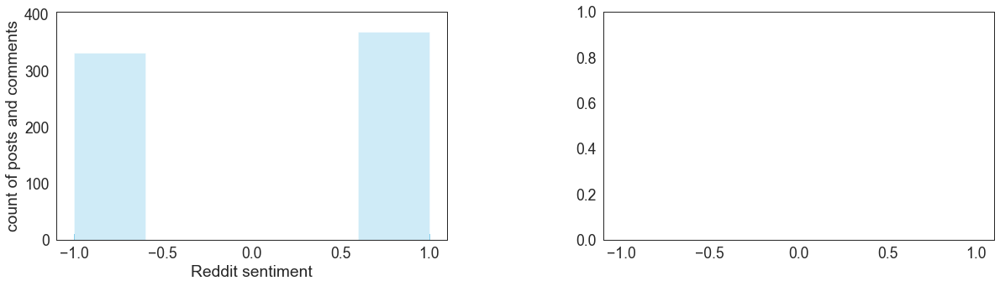

subreddit subreddit_Nicegirls.json, size 76901


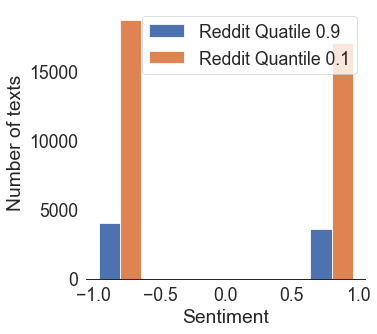

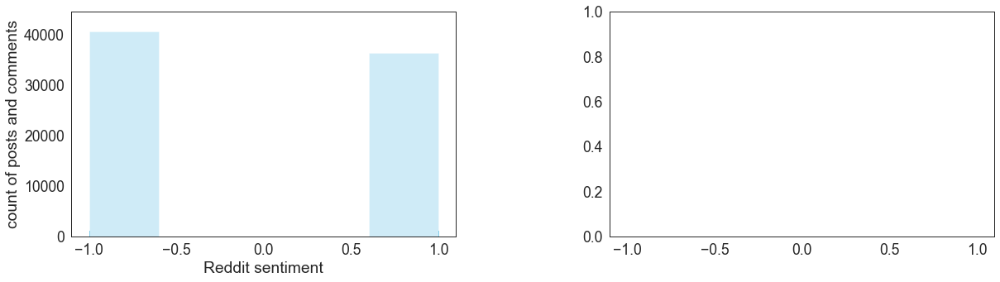

subreddit GirlGamers.json, size 29917


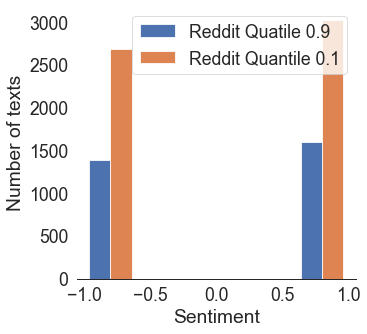

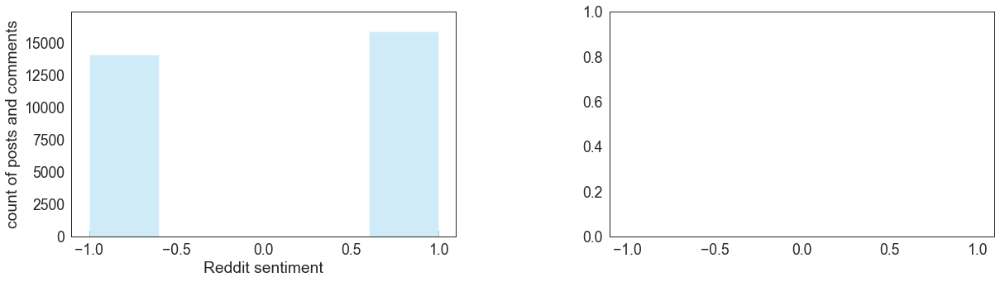

subreddit NotHowGirlsWork.json, size 29354


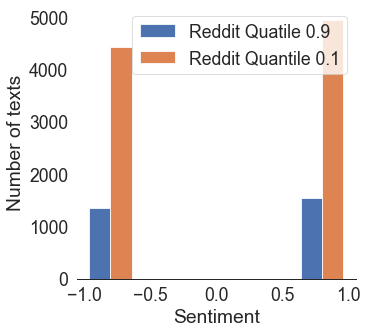

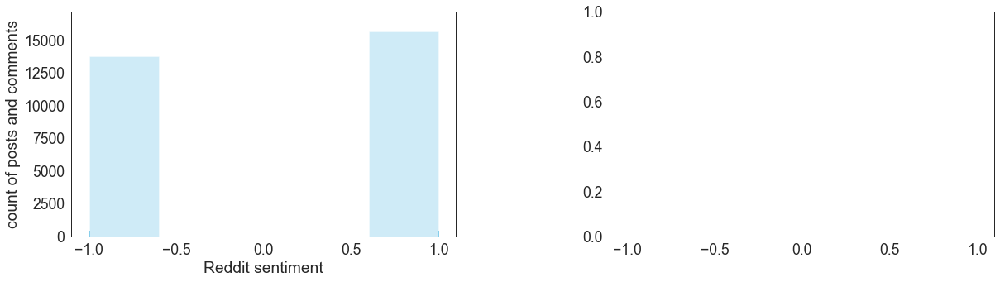

subreddit FemmeThoughts.json, size 259


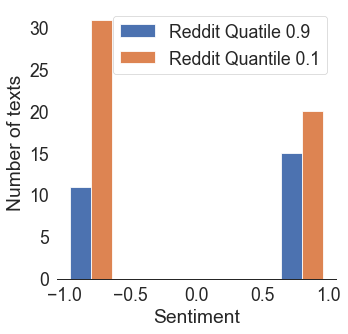

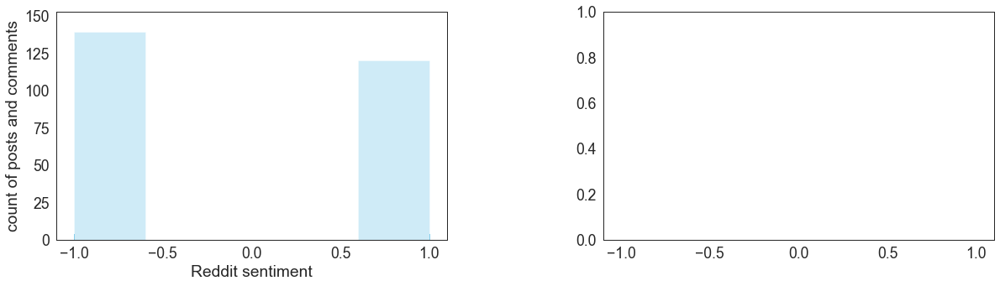

subreddit GirlsGoneWired.json, size 6846


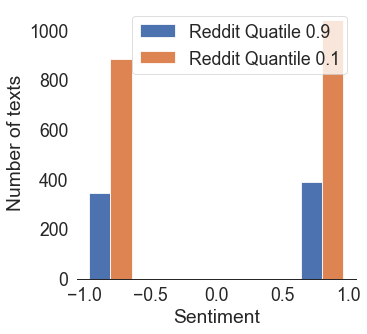

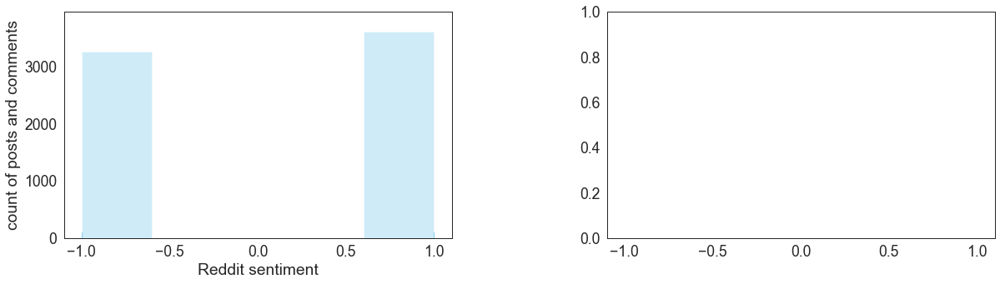

subreddit subreddit_WitchesVsPatriarchy.json, size 69029


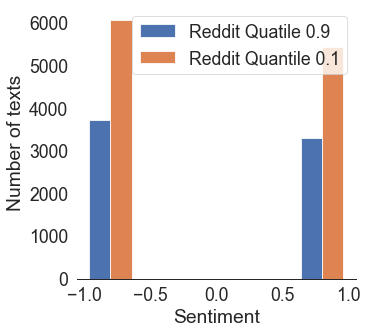

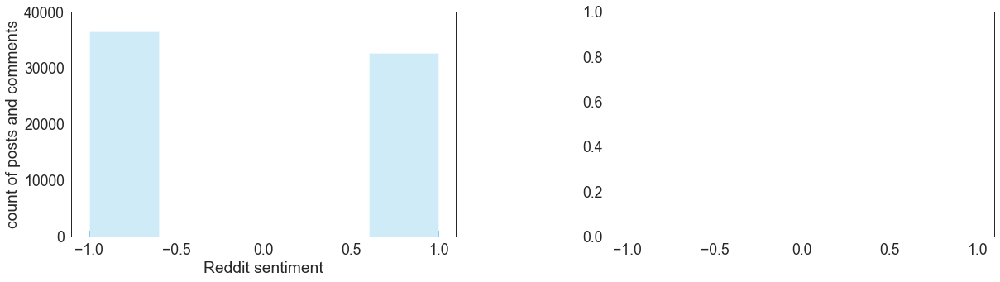

subreddit subreddit_GirlGamers.json, size 4747


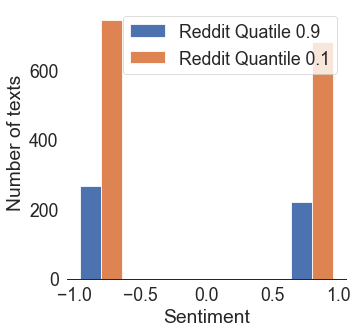

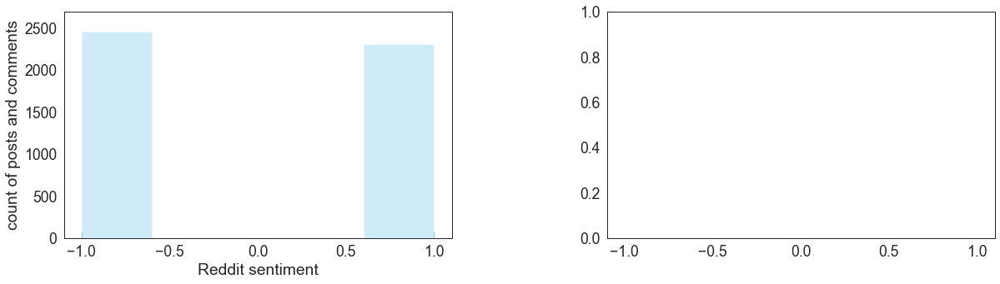

subreddit subreddit_MensRights.json, size 69226


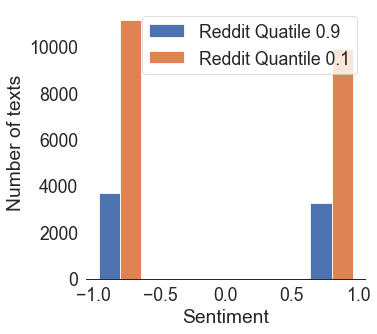

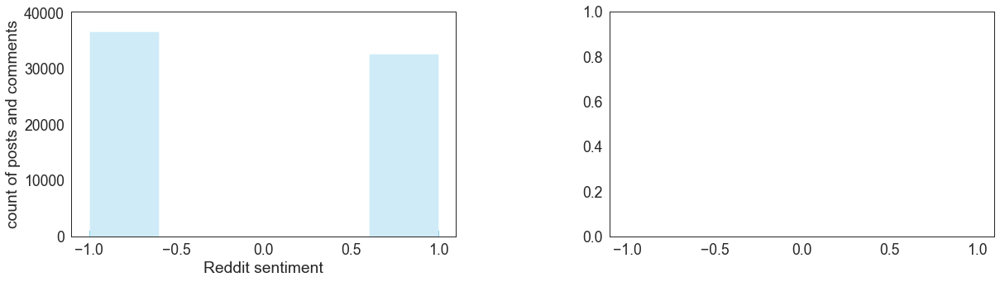

subreddit scientits.json, size 3787


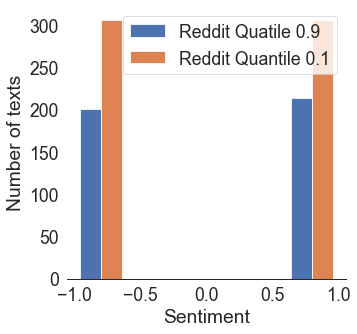

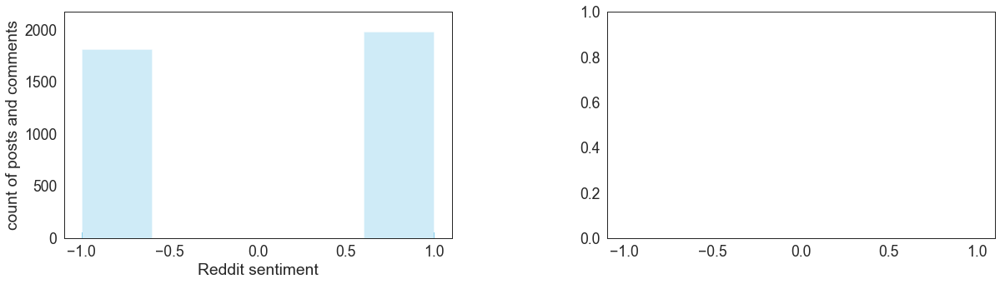

subreddit FemaleDatingStrategy.json, size 2237


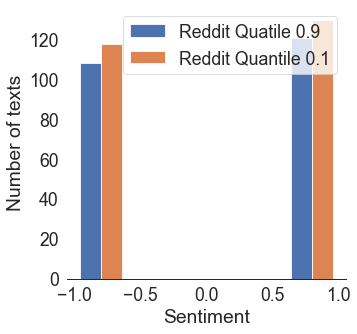

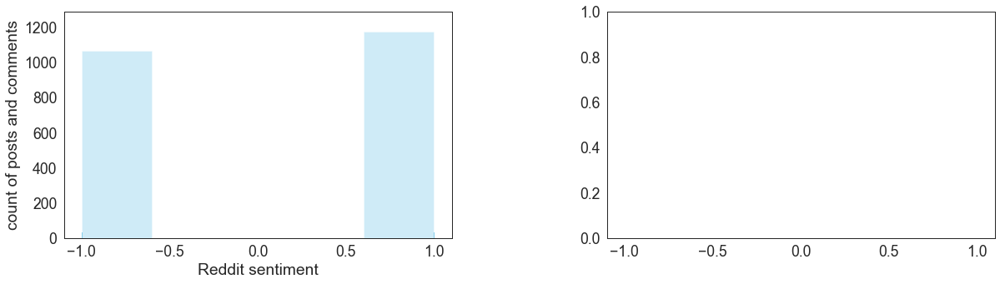

subreddit subreddit_AskWomen.json, size 55619


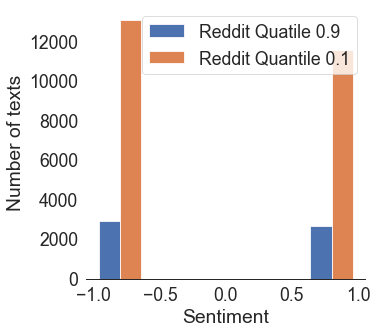

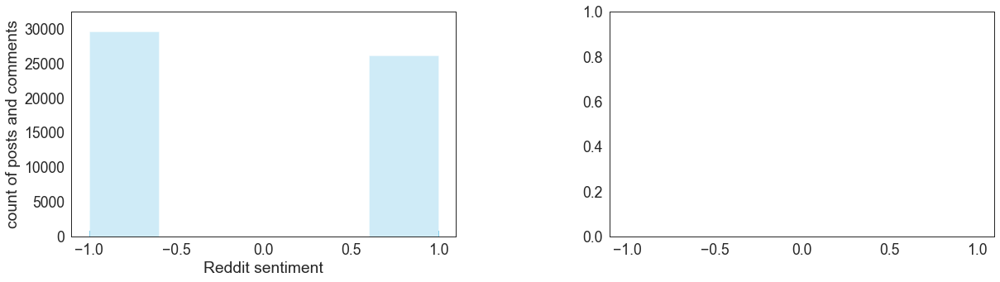

subreddit feminism.json, size 23014


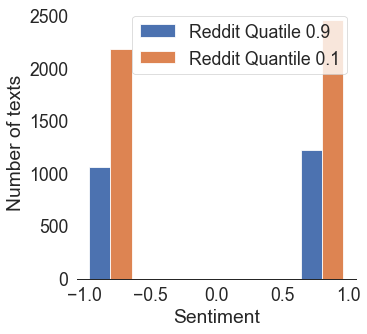

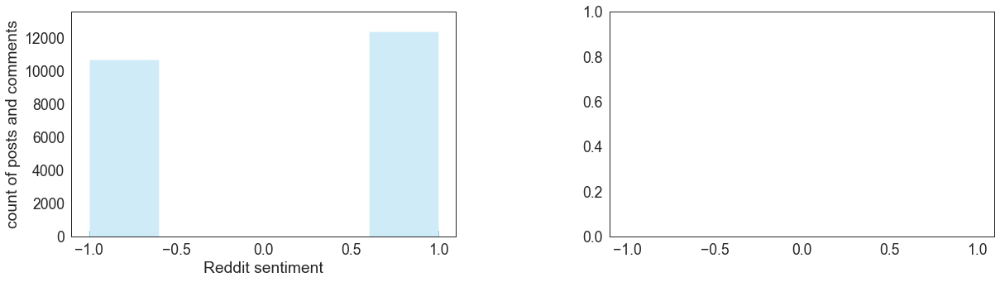

subreddit antifeminists.json, size 3054


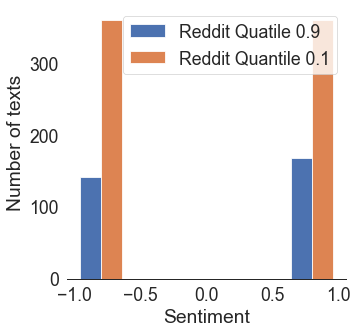

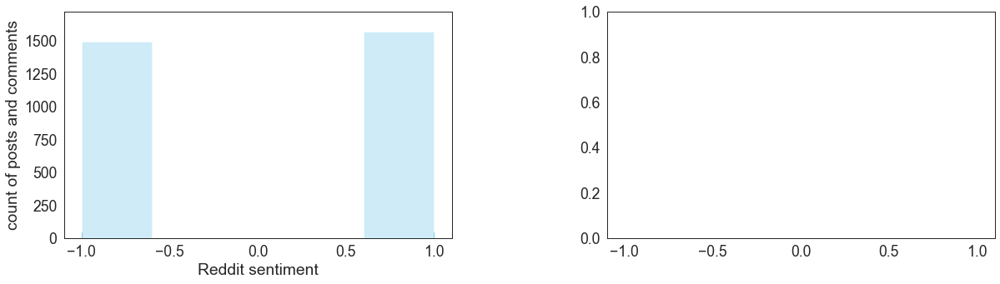

subreddit blackladies.json, size 23947


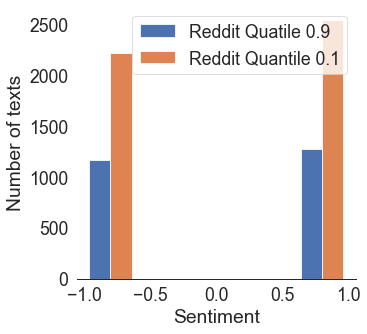

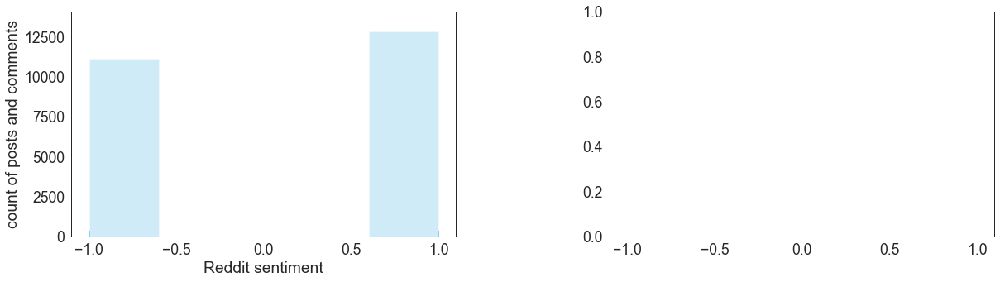

subreddit BreadTube.json, size 1977


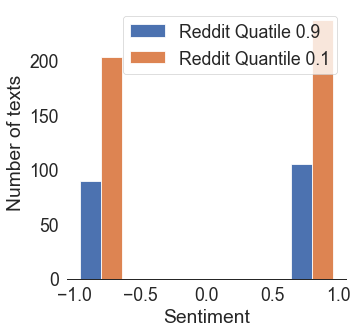

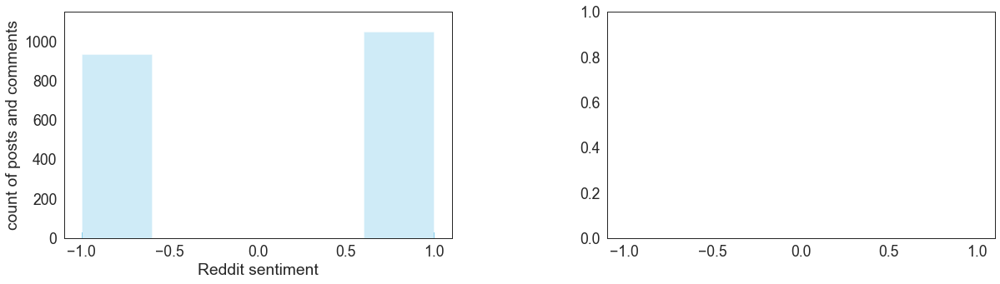

subreddit AskFeminists.json, size 1232


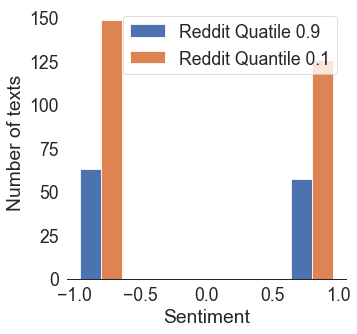

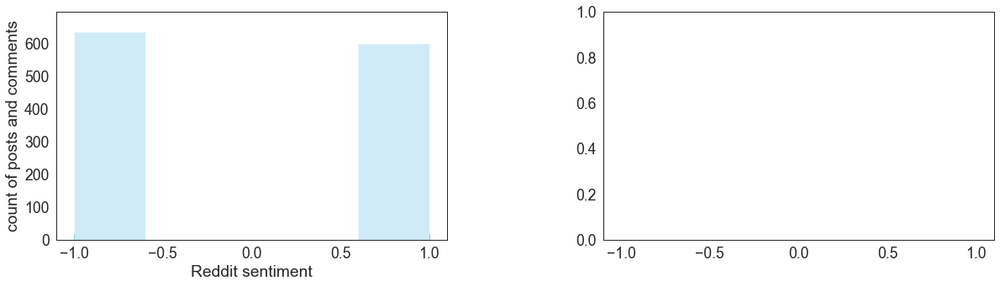

subreddit MensRights.json, size 2487


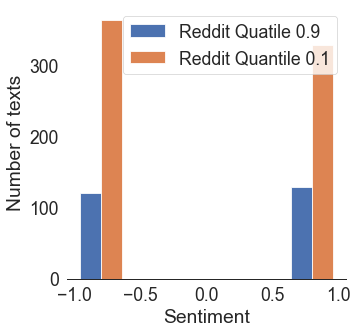

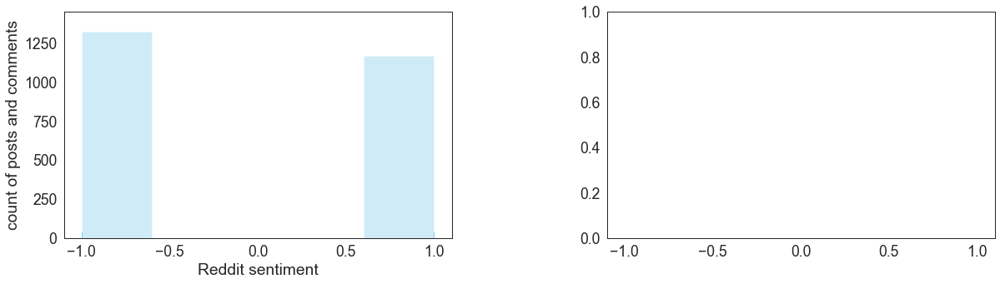

subreddit femmethoughts.json, size 10490


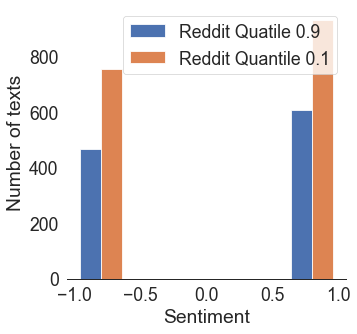

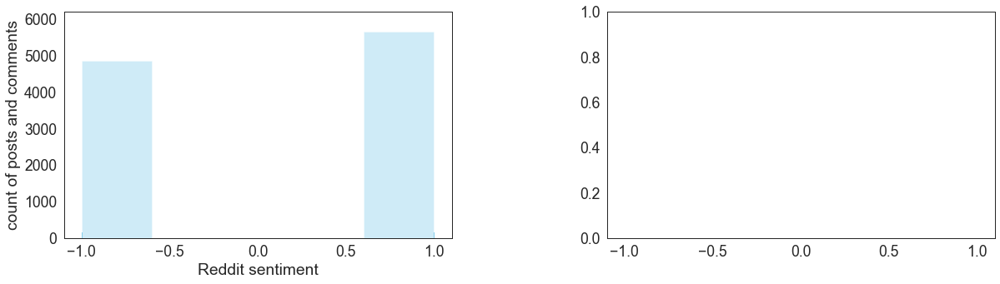

subreddit Feminism.json, size 916


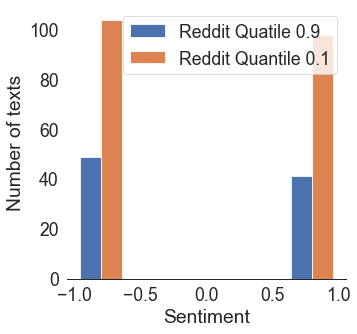

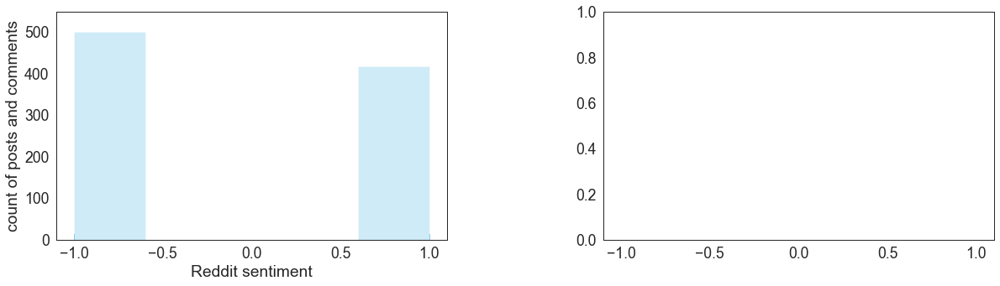

subreddit TheGirlSurvivalGuide.json, size 29871


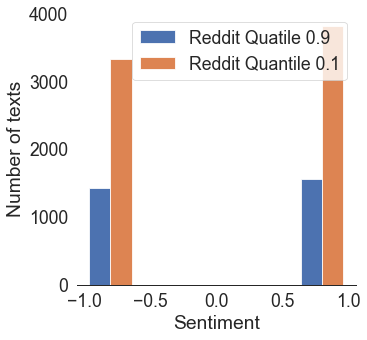

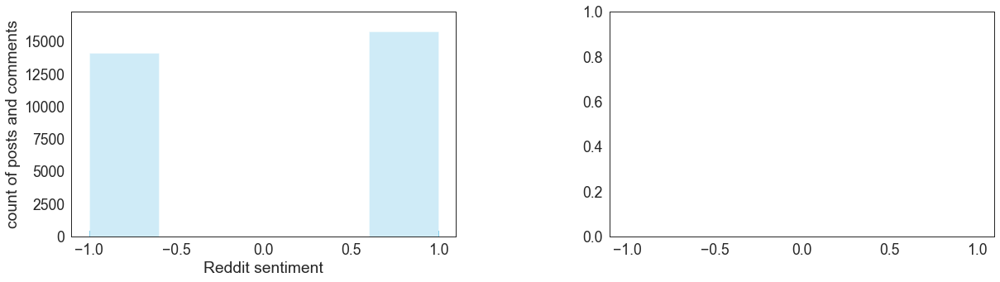

subreddit Nicegirls.json, size 3498


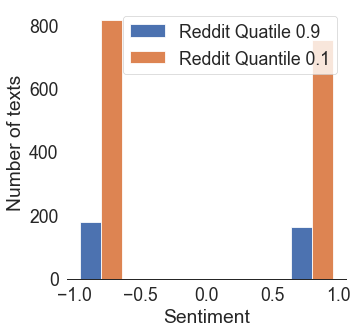

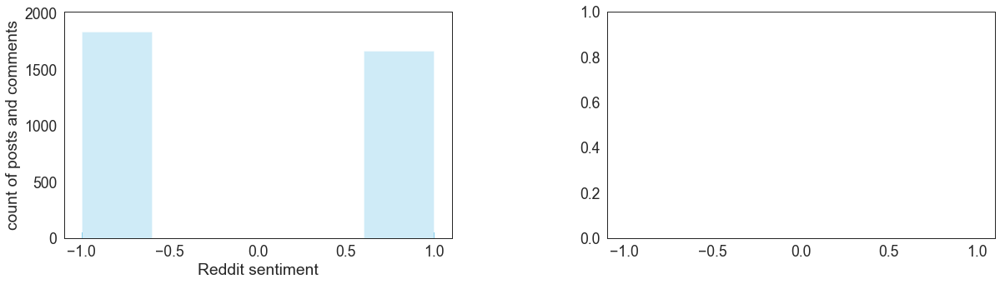

subreddit AskWomen.json, size 10864


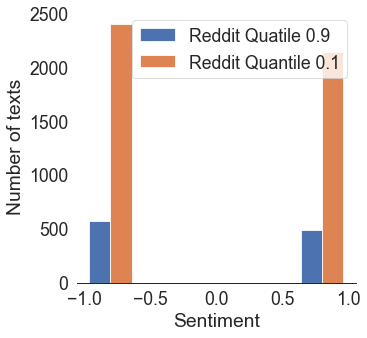

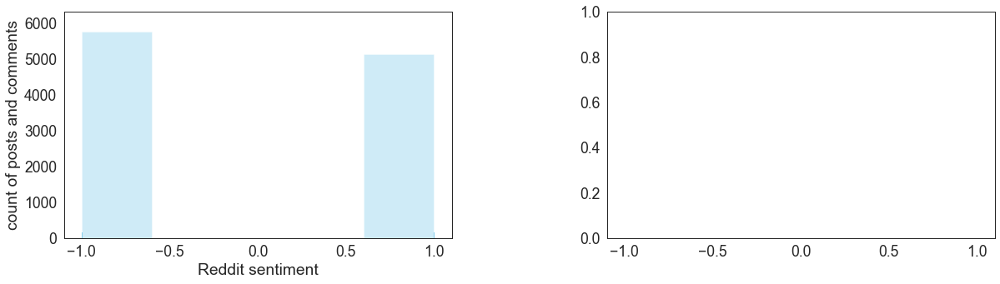

subreddit TrollXChromosomes.json, size 2109


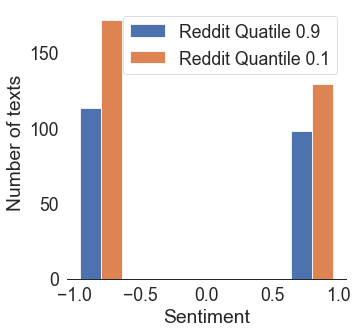

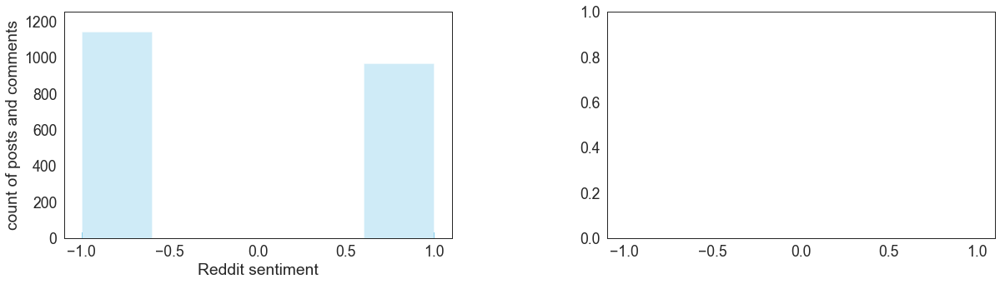

subreddit WitchesVsPatriarchy.json, size 26452


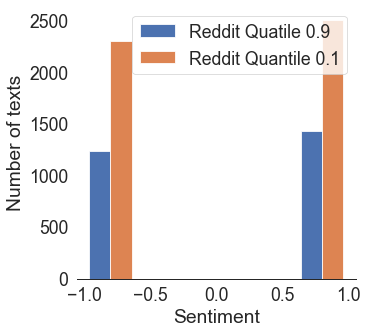

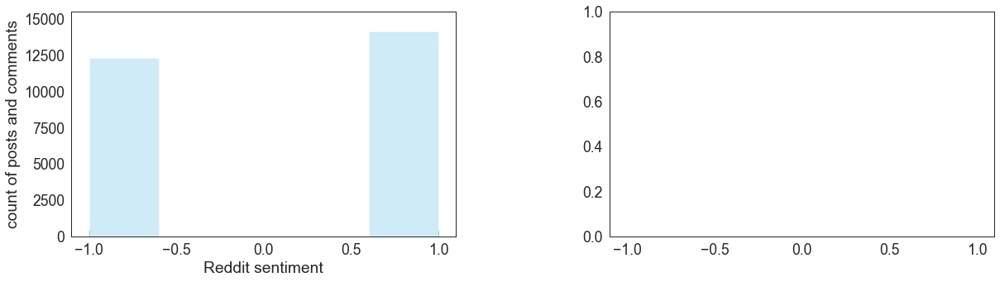

In [601]:
for sr in subreddits:
    _df = df_reddit_joined[df_reddit_joined['subreddit_topic'] == sr]
    if len(_df) > 100:
        print(f'subreddit {sr}, size {len(_df)}')
        show_reddit_df_info(_df)

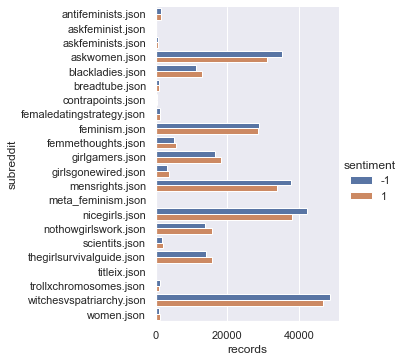

In [610]:
df_reddit_subreddit = df_reddit_joined.groupby(['subreddit_topic_lower', 'sentiment']).count().reset_index()

sns.set(rc={'figure.figsize':(20,20)})
g = sns.catplot(y="subreddit_topic_lower", x="com_count", hue="sentiment", data=df_reddit_subreddit,kind="bar")
g.set_ylabels("subreddit")
g.set_xlabels("records")
plt.show()

In [604]:
df_reddit_joined['subreddit_topic_lower'] = df_reddit_joined['subreddit_topic'].apply(lambda t: t.lower().replace("subreddit_", ""))

posts 65.9090909090909
comments 64.78280401578186


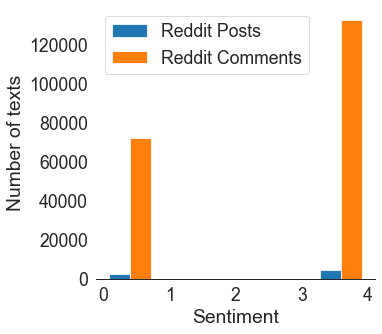

In [291]:
len_posts = len(df_reddit_unique[df_reddit_unique['topic_id'].isnull() == True])
len_neg_posts = len(df_reddit_unique[(df_reddit_unique['topic_id'].isnull() == True) \
                           & (df_reddit_unique['text_proc_sentiment'] == 4)])
print('posts', len_neg_posts/len_posts*100)

len_com = len(df_reddit_unique[df_reddit_unique['topic_id'].isnull() == False])
len_neg_com = len(df_reddit_unique[(df_reddit_unique['topic_id'].isnull() == False) \
                           & (df_reddit_unique['text_proc_sentiment'] == 4)])
print('comments', len_neg_com/len_com*100)

sns.set_context("paper", font_scale=2)
sns.set_style("white")
plt.rc('text', usetex=False)
fig, ax = plt.subplots(figsize=(5,5))
sns.despine(left=True)

ax.hist([df_reddit_unique[df_reddit_unique['topic_id'].isnull() == True]['text_proc_sentiment'],
         df_reddit_unique[df_reddit_unique['topic_id'].isnull() == False]['text_proc_sentiment']], 
              bins=5, label=["Reddit Posts" , "Reddit Comments"])
ax.set_xlabel('Sentiment')
ax.set_ylabel('Number of texts')
ax.legend()
plt.show()

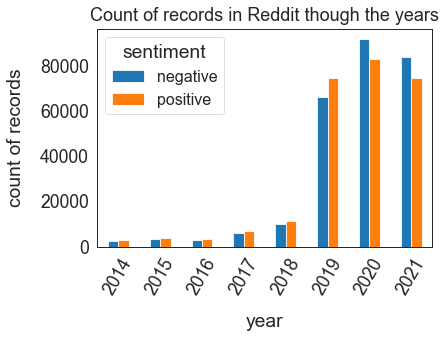

In [267]:
df_reddit_joined['date'] = df_reddit_joined['utc'].apply(lambda t: pd.to_datetime(t, unit='s'))
df_reddit_joined['date_info'] = df_reddit_joined['date'].dt.month.map(str) + "-" + df_reddit_joined['date'].dt.year.map(str)
df_reddit_joined['year'] = df_reddit_joined['date'].dt.year.map(str)

df_reddit_unique_grouped_pos = df_reddit_joined[df_reddit_joined['sentiment'] == 1].groupby(['year']).count()[['id']]
df_reddit_unique_grouped_neg = df_reddit_joined[df_reddit_joined['sentiment'] == -1].groupby(['year']).count()[['id']]

df_red_joined = df_reddit_unique_grouped_pos.join(df_reddit_unique_grouped_neg, on='year',lsuffix='_pos', rsuffix='_neg')

df_red_joined[['id_neg', 'id_pos']].plot(kind='bar')
plt.xticks(rotation=60)
plt.title("Count of records in Reddit though the years", fontsize=18, y=1.01)
plt.xlabel("year", labelpad=15)
plt.ylabel("count of records", labelpad=15)
plt.legend(["negative", "positive"], fontsize=16, title="sentiment");

<AxesSubplot:title={'center':'Rate of positive to negative records'}, xlabel='year', ylabel='positive to negative rate'>

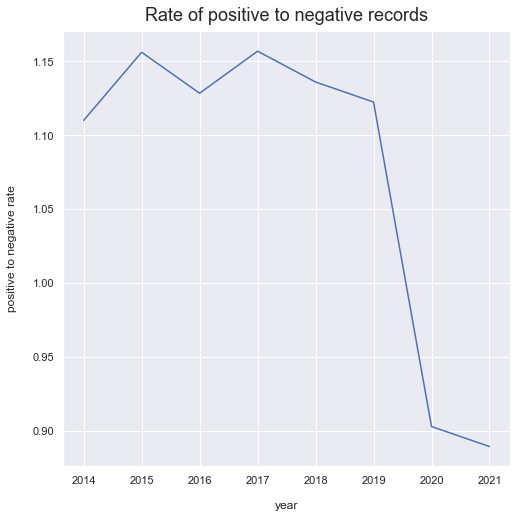

In [278]:
reddit_pos_rate = df_red_joined['id_pos']/df_red_joined['id_neg']

plt.figure(figsize=(8,8))
plt.title("Rate of positive to negative records", fontsize=18, y=1.01)
plt.xlabel("year", labelpad=15)
plt.ylabel("positive to negative rate", labelpad=15)
reddit_pos_rate.plot()

In [294]:
popular_posts = df_reddit_joined['parent_id'].value_counts()[:10].index.tolist()

In [295]:
popular_posts

['t3_d8fe6u',
 't3_bt40ck',
 't3_mid98r',
 't3_d03xh3',
 't3_c89oll',
 't3_mwk4vd',
 't3_mexoaq',
 't3_ml01gq',
 't3_mqsmko',
 't3_ly8mrw']

t3_d8fe6u


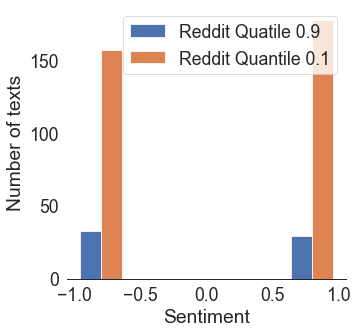

t3_bt40ck


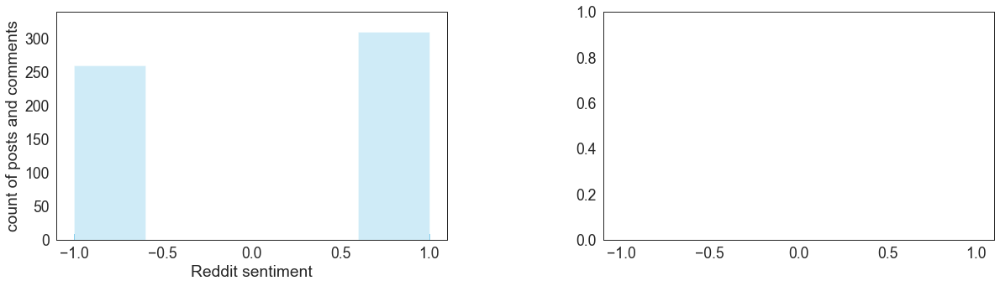

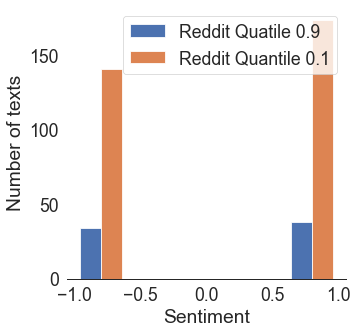

t3_mid98r


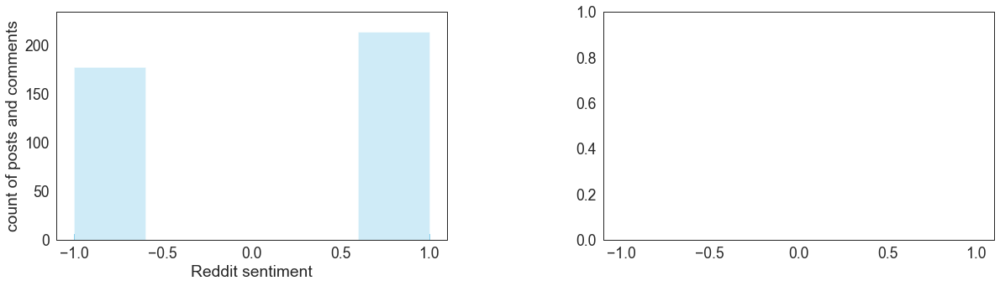

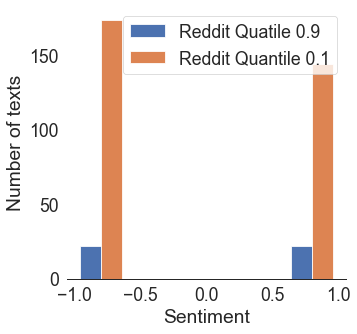

t3_d03xh3


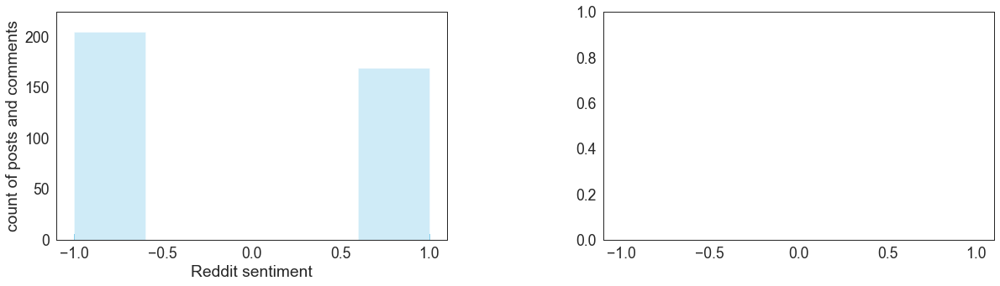

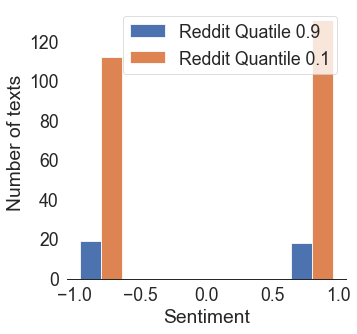

t3_c89oll


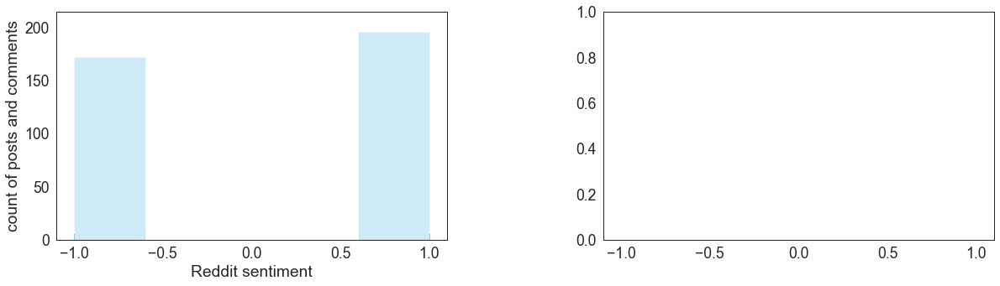

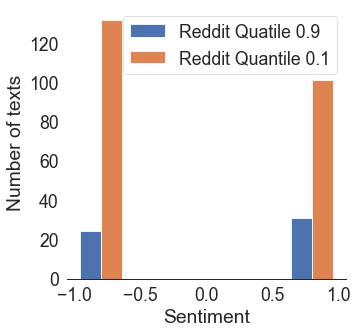

t3_mwk4vd


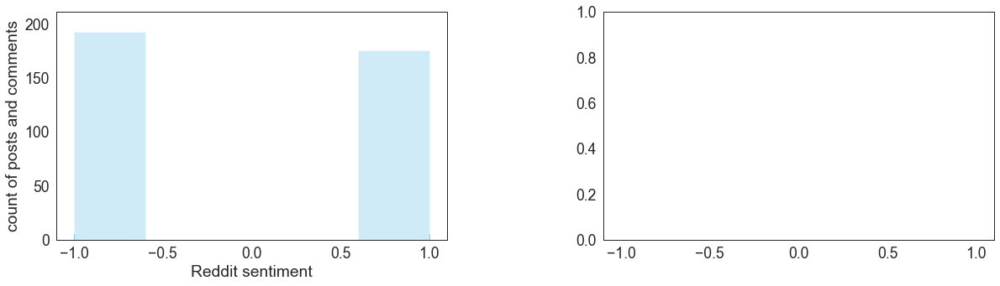

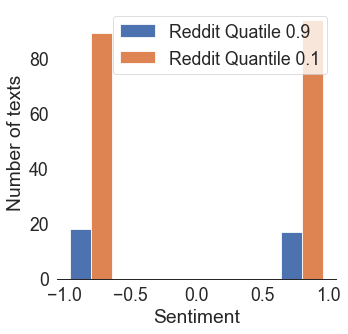

t3_mexoaq


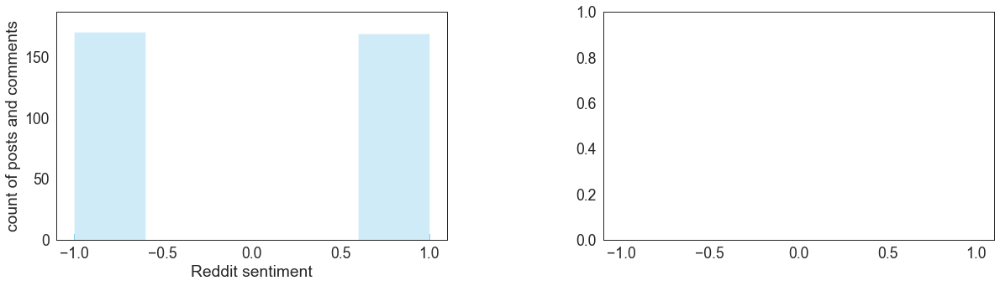

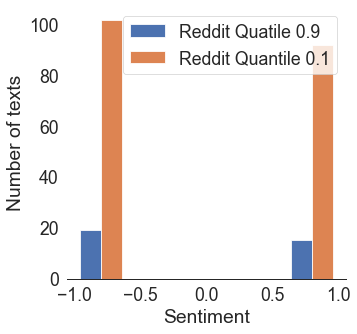

t3_ml01gq


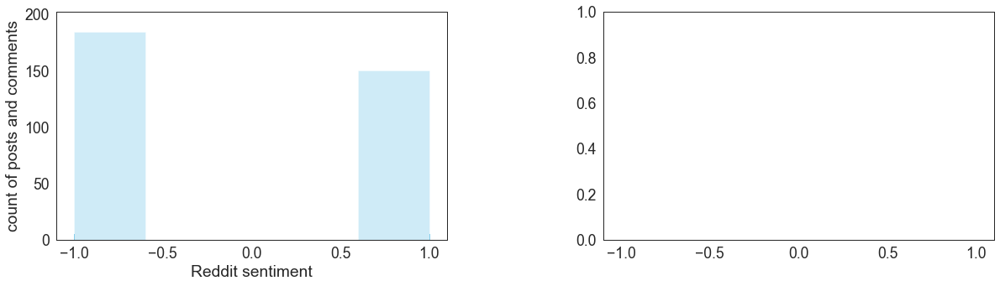

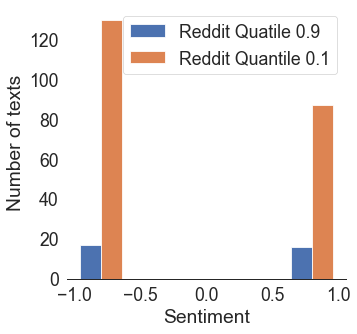

t3_mqsmko


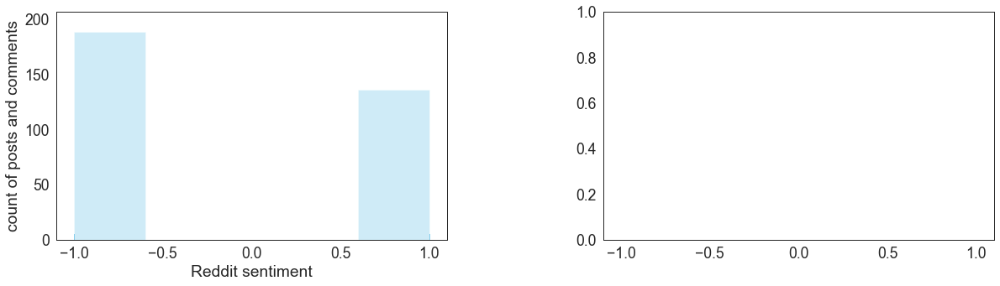

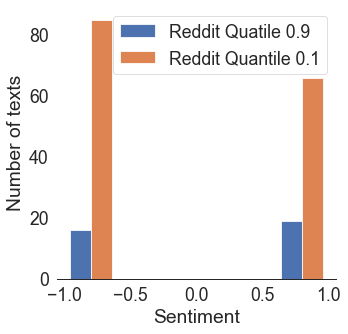

t3_ly8mrw


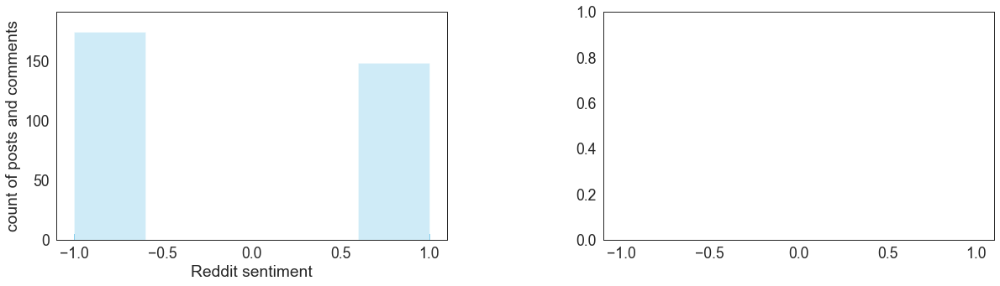

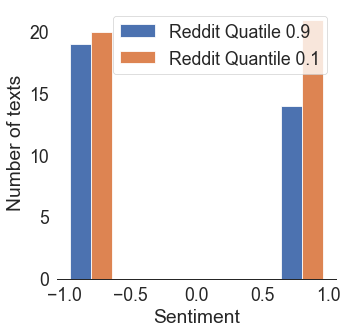

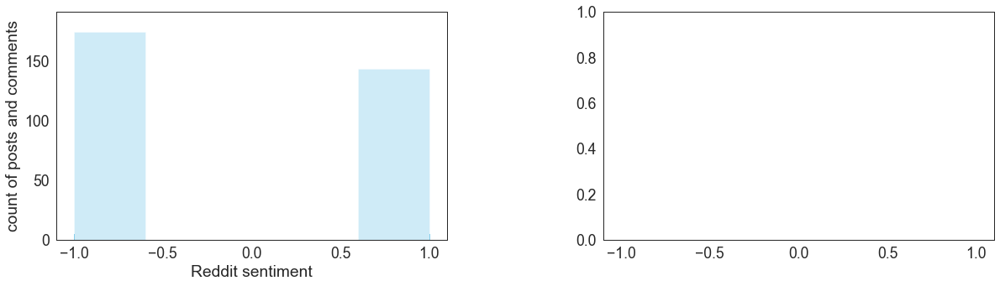

In [296]:
for p in popular_posts:
    print(p)
    _df = df_reddit_joined[df_reddit_joined['parent_id'] == p]
    show_reddit_df_info(_df)

t3_ieafb6


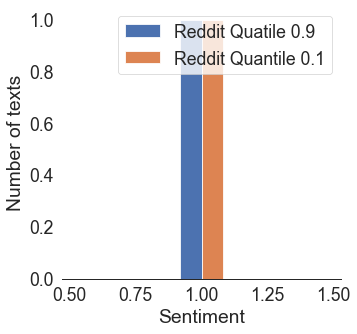

t3_h9azkd


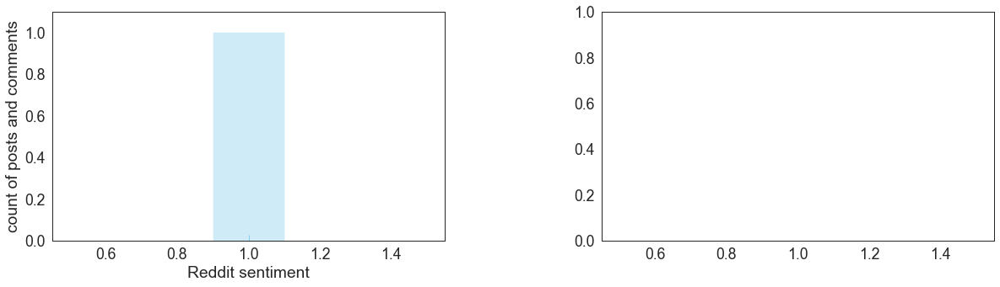

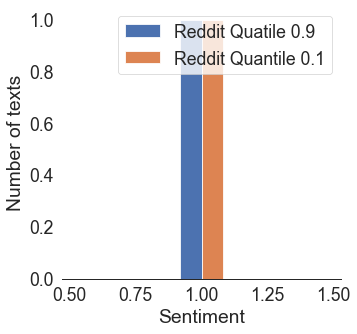

t1_f5qs14p


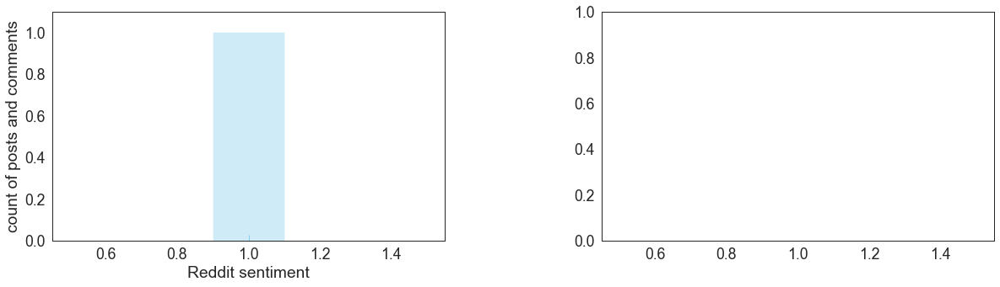

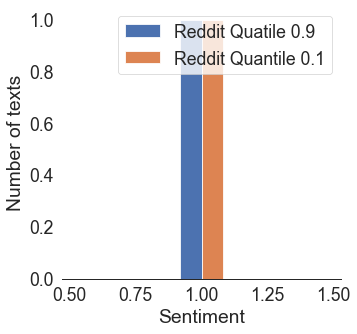

t1_et5seo0


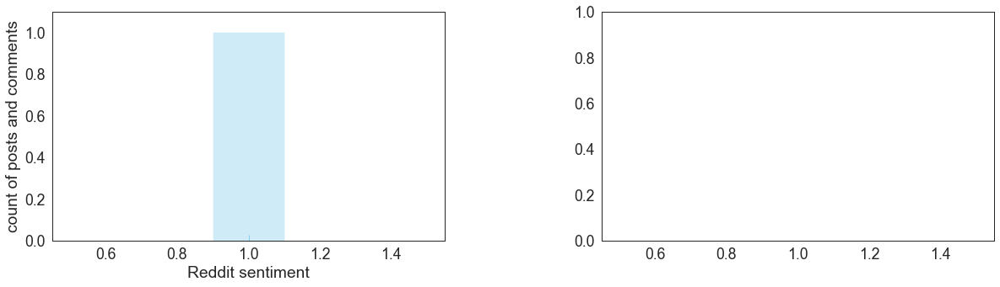

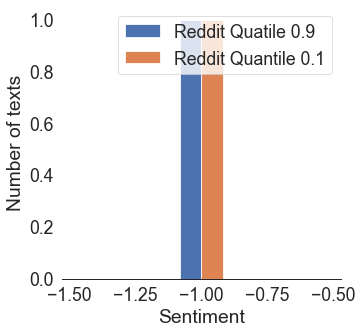

t1_esc6285


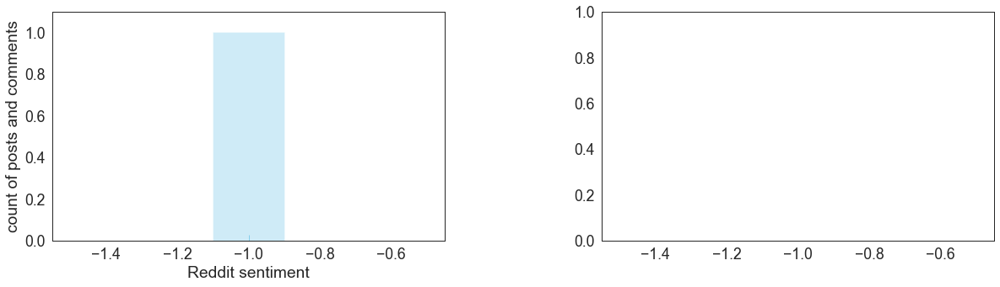

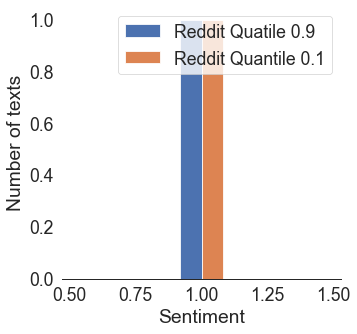

t3_h98ltv


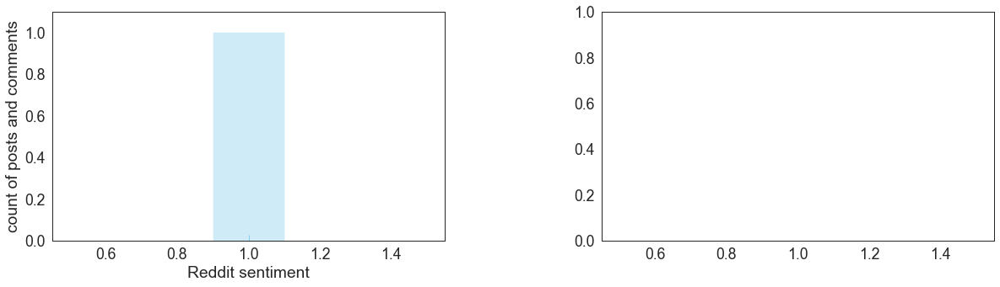

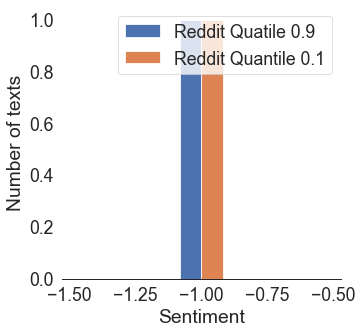

t3_kw0x5q


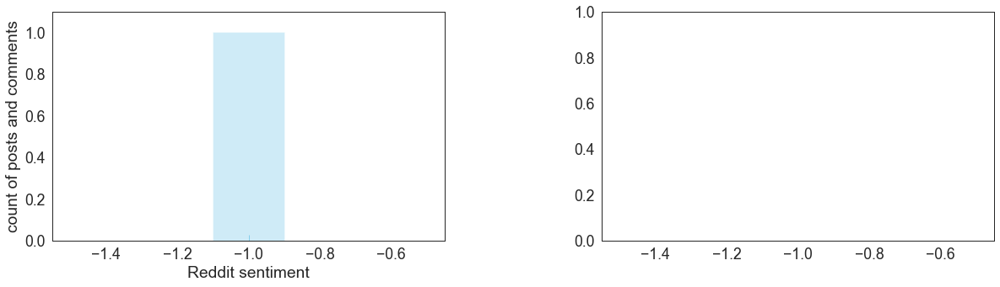

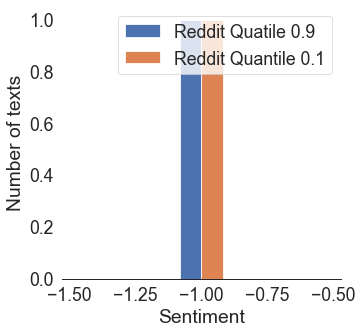

t1_f05amt4


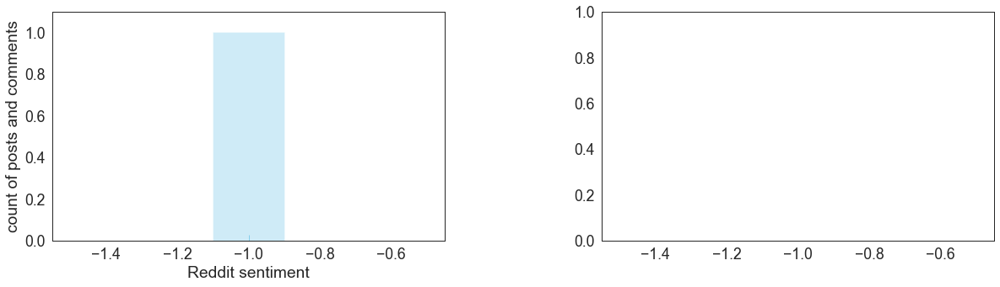

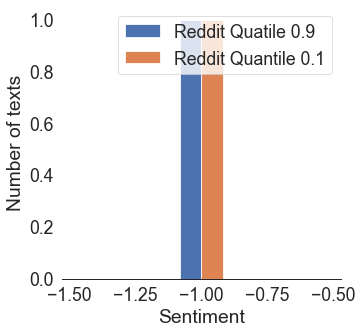

t1_ehye7vj


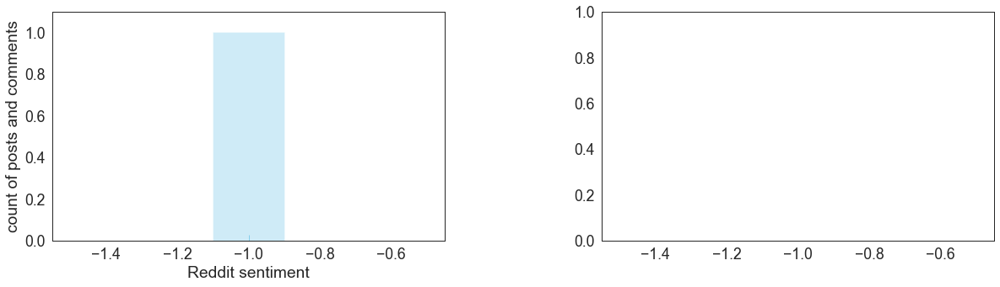

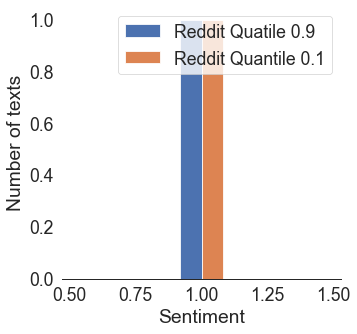

t1_ey93di3


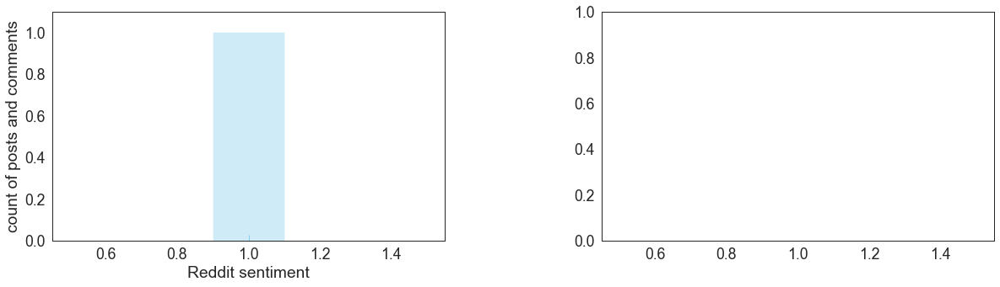

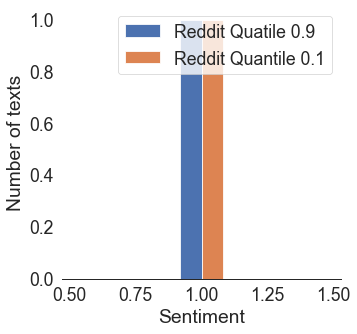

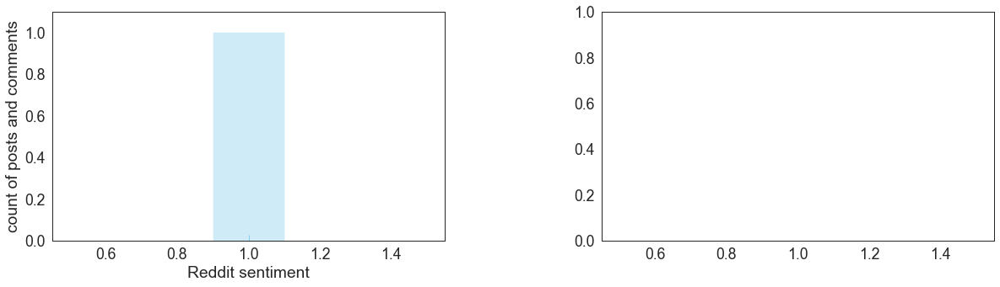

In [298]:
unpopular_posts = df_reddit_joined['parent_id'].value_counts()[-10:].index.tolist()
for p in unpopular_posts:
    print(p)
    _df = df_reddit_joined[df_reddit_joined['parent_id'] == p]
    show_reddit_df_info(_df)

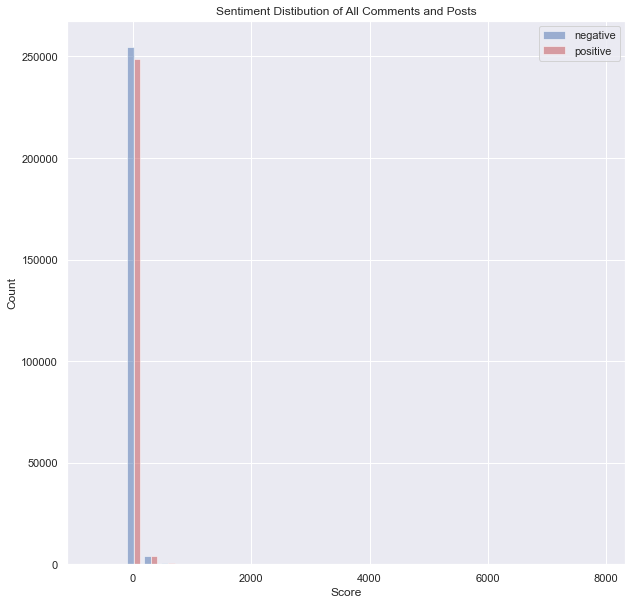

In [611]:
plt.figure(figsize=(10,10))
plt.hist([df_reddit_joined[(df_reddit_joined['sentiment'] == -1) & (df_reddit_joined['score'] != 0)]['score'], 
          df_reddit_joined[(df_reddit_joined['sentiment'] == 1) & (df_reddit_joined['score'] != 0)]['score']], 
         color=['b','r'], alpha=0.5, bins=30, label=['negative', 'positive'])
plt.legend(loc='upper right')
plt.xlabel('Score')
plt.ylabel('Count')
plt.title('Sentiment Distibution of All Comments and Posts')
plt.show()

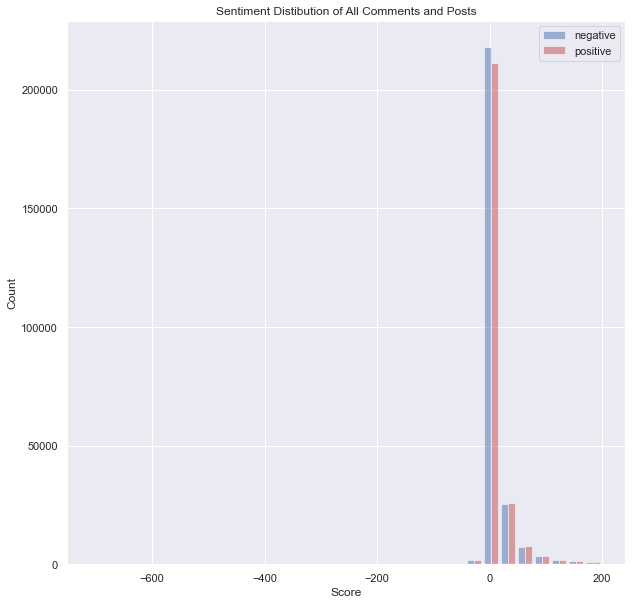

In [612]:
plt.figure(figsize=(10,10))
plt.hist([df_reddit_joined[(df_reddit_joined['sentiment'] == -1) & (df_reddit_joined['score'] < 200)]['score'], 
          df_reddit_joined[(df_reddit_joined['sentiment'] == 1) & (df_reddit_joined['score'] < 200)]['score']], 
         color=['b','r'], alpha=0.5, bins=30, label=['negative', 'positive'])
plt.legend(loc='upper right')
plt.xlabel('Score')
plt.ylabel('Count')
plt.title('Sentiment Distibution of All Comments and Posts')
plt.show()

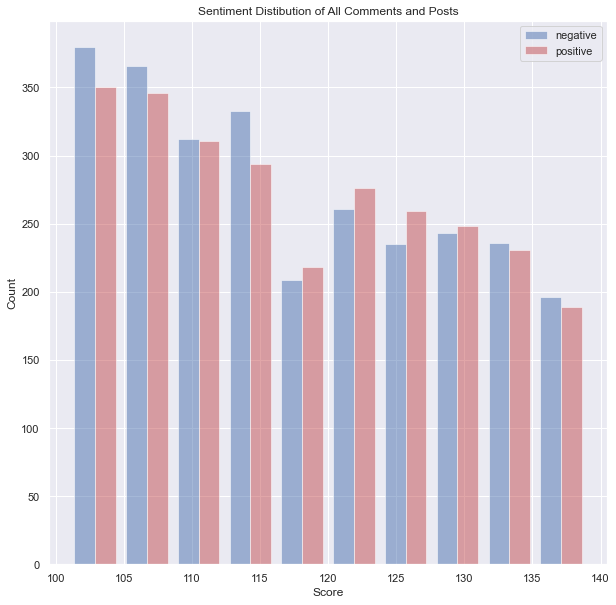

In [615]:
plt.figure(figsize=(10,10))
plt.hist([df_reddit_joined[(df_reddit_joined['sentiment'] == -1) & (df_reddit_joined['score'] > 100) & (df_reddit_joined['score'] < 140)]['score'], 
          df_reddit_joined[(df_reddit_joined['sentiment'] == 1) & (df_reddit_joined['score'] > 100) & (df_reddit_joined['score'] < 140)]['score']], 
         color=['b','r'], alpha=0.5, bins=10, label=['negative', 'positive'])
plt.legend(loc='upper right')
plt.xlabel('Score')
plt.ylabel('Count')
plt.title('Sentiment Distibution of All Comments and Posts')
plt.show()

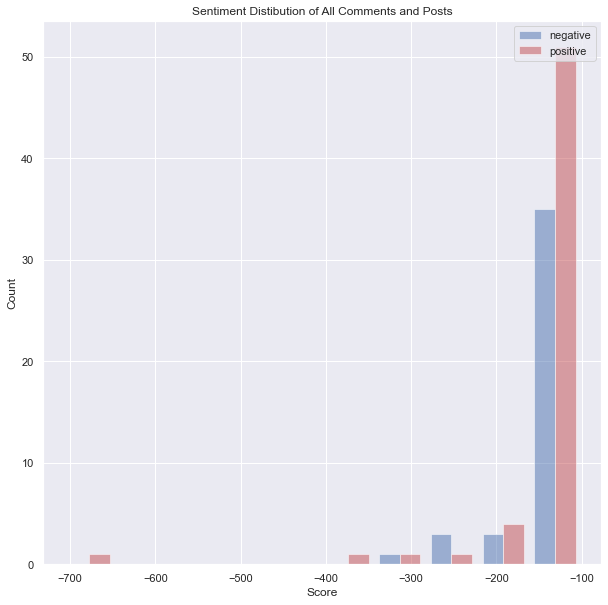

In [616]:
plt.figure(figsize=(10,10))
plt.hist([df_reddit_joined[(df_reddit_joined['sentiment'] == -1) & (df_reddit_joined['score'] < - 100)]['score'], 
          df_reddit_joined[(df_reddit_joined['sentiment'] == 1) & (df_reddit_joined['score'] < -100)]['score']], 
         color=['b','r'], alpha=0.5, bins=10, label=['negative', 'positive'])
plt.legend(loc='upper right')
plt.xlabel('Score')
plt.ylabel('Count')
plt.title('Sentiment Distibution of All Comments and Posts')
plt.show()

## TikTok 

In [321]:
df_tiktok.head()

,id,desc,createTime,video_duration,authorId,authorUniqueId,musicTitle,challenges,diggCount,shareCount,...,target,txt,desc_negative_prob,desc_positive_prob,stickerText_negative_prob,stickerText_positive_prob,subtitles_sentiment,desc_sentiment,desc_sentiment_with_neutr,subt_with_neutr
0,6921887153106603008,show: good girls #goodgirls #goodgirlsshow #fe...,1611627459,42,6921885533481075712,moviesanimeandshows,original sound,"[goodgirls, goodgirlsshow, feminist, feminism]",3600000,23900,...,1,r4pe sister listen,0.043097,0.956903,0.272787,0.727212,1,1,1,1
1,6941081899544742912,yea. #fyp #feminism #facts #equality #comedy ...,1616096569,28,6722294647856563200,snotsm00thie,original sound,"[fyp, feminism, facts, equality, comedy, relat...",3000000,102200,...,1,find disrespectful boyfriend picture naked gir...,0.858028,0.141972,0.541411,0.458589,-1,-1,-1,0
2,6946699608449895424,Por mi y por TODAS 💜💚 #feministas #feminism#yo...,1617404545,52,6847936321492911104,boyslove_asian23,sonido original,"[feministas, feminism, yositecreo, kdrama, kor...",2800000,29800,...,1,,0.260969,0.739031,0.000187,0.999813,1,1,1,1
3,6918821818841238528,Mrs. Feminism herself 😂😂😂. ...,1610913740,16,6738073606407029760,cher.tok,Men?,"[cher, music, fyp, fy, icon, woman, feminism]",2600000,63200,...,1,,0.045838,0.954162,0.541411,0.458589,-1,1,1,0
4,6888789760144428032,#stitch with @2700relle #stats #feminism #fem...,1603921377,43,6624983741704798208,mrvdk,original sound,"[stitch, stats, feminism, feminist, feministik...",2400000,89800,...,1,,0.362976,0.637024,0.985006,0.014994,-1,1,0,-1


In [328]:
df_tiktok['date'] = df_tiktok['createTime'].apply(lambda t: pd.to_datetime(t, unit='s'))
df_tiktok['date_info'] = df_tiktok['date'].dt.month.map(str) + "-" + df_tiktok['date'].dt.year.map(str)
df_tiktok['year'] = df_tiktok['date'].dt.year.map(str)

NameError: name 'df_tiktok_joined' is not defined

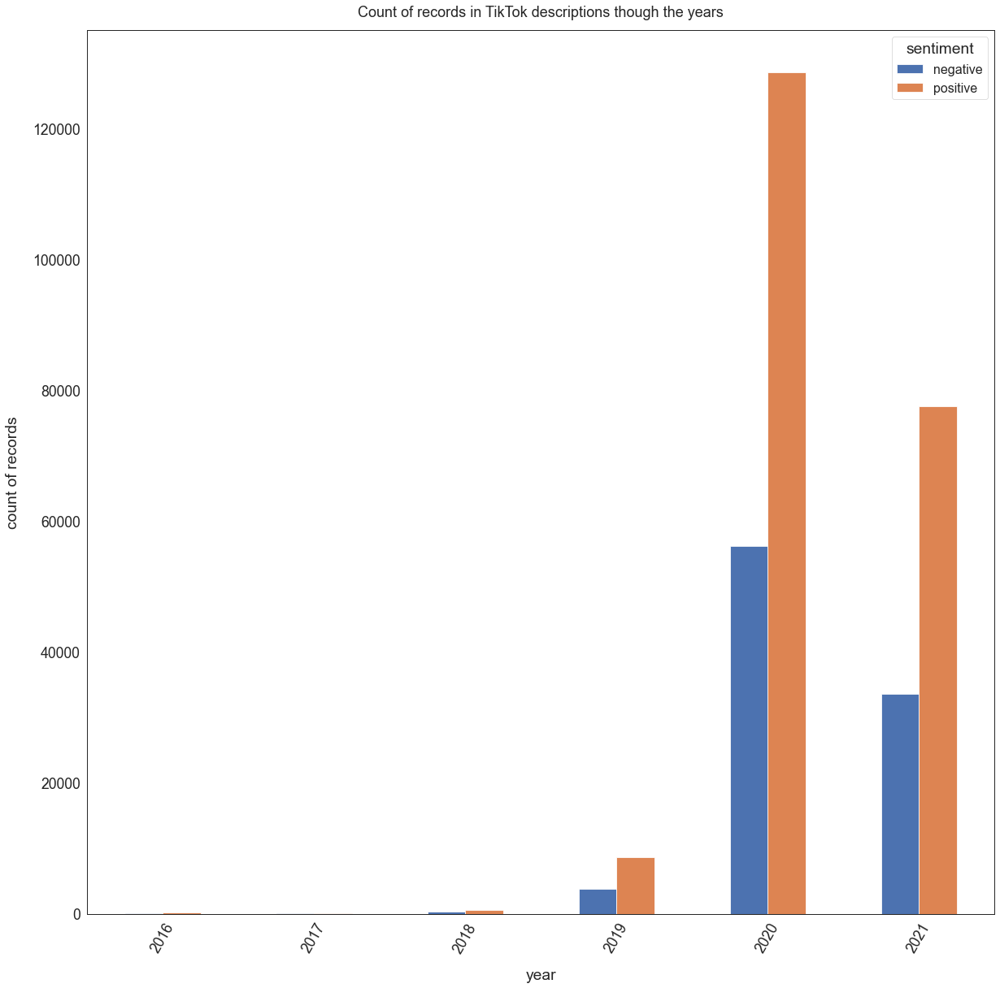

In [339]:
df_tiktok_unique_grouped_pos = df_tiktok[df_tiktok['desc_sentiment'] == 1].groupby(['year']).count()[['id']]
df_tiktok_unique_grouped_neg = df_tiktok[df_tiktok['desc_sentiment'] == -1].groupby(['year']).count()[['id']]

df_tiktok_joined = df_tiktok_unique_grouped_pos.join(df_tiktok_unique_grouped_neg, on='year',lsuffix='_pos', rsuffix='_neg')

df_tiktok_joined[['id_neg', 'id_pos']].plot(kind='bar')
plt.xticks(rotation=60)
plt.title("Count of records in TikTok descriptions though the years", fontsize=18, y=1.01)
plt.xlabel("year", labelpad=15)
plt.ylabel("count of records", labelpad=15)
plt.legend(["negative", "positive"], fontsize=16, title="sentiment")

<AxesSubplot:title={'center':'Rate of positive to negative records'}, xlabel='year', ylabel='positive to negative rate'>

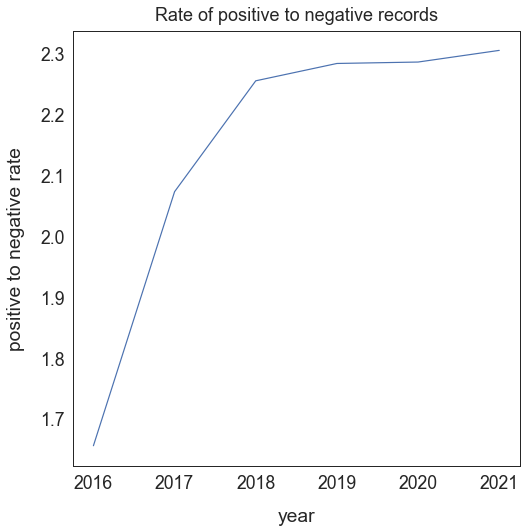

In [341]:
tiktok_descr_pos_rate = df_tiktok_joined['id_pos']/df_tiktok_joined['id_neg']

plt.figure(figsize=(8,8))
plt.title("Rate of positive to negative records", fontsize=18, y=1.01)
plt.xlabel("year", labelpad=15)
plt.ylabel("positive to negative rate", labelpad=15)
tiktok_descr_pos_rate.plot()

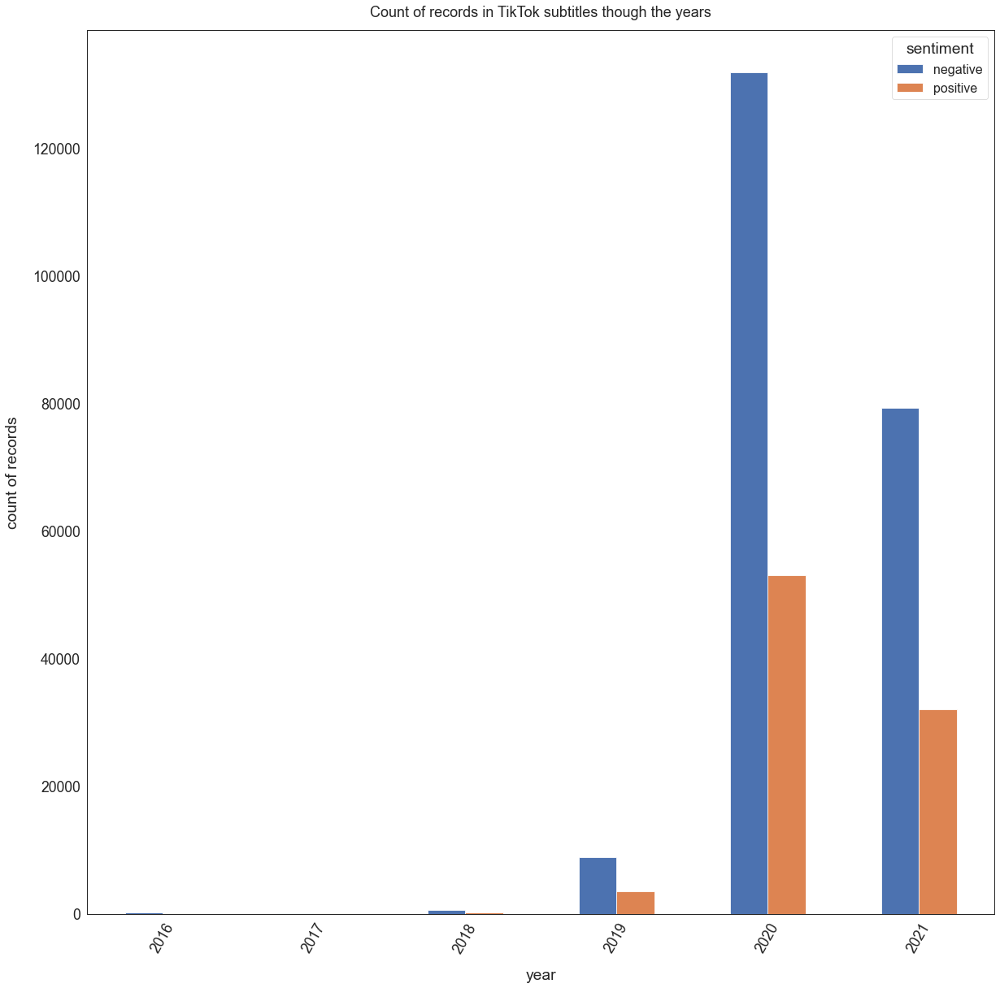

In [342]:
df_tiktok_unique_grouped_pos = df_tiktok[df_tiktok['subtitles_sentiment'] == 1].groupby(['year']).count()[['id']]
df_tiktok_unique_grouped_neg = df_tiktok[df_tiktok['subtitles_sentiment'] == -1].groupby(['year']).count()[['id']]

df_tiktok_joined = df_tiktok_unique_grouped_pos.join(df_tiktok_unique_grouped_neg, on='year',lsuffix='_pos', rsuffix='_neg')

df_tiktok_joined[['id_neg', 'id_pos']].plot(kind='bar')
plt.xticks(rotation=60)
plt.title("Count of records in TikTok subtitles though the years", fontsize=18, y=1.01)
plt.xlabel("year", labelpad=15)
plt.ylabel("count of records", labelpad=15)
plt.legend(["negative", "positive"], fontsize=16, title="sentiment")

<AxesSubplot:title={'center':'Rate of positive to negative records'}, xlabel='year', ylabel='positive to negative rate'>

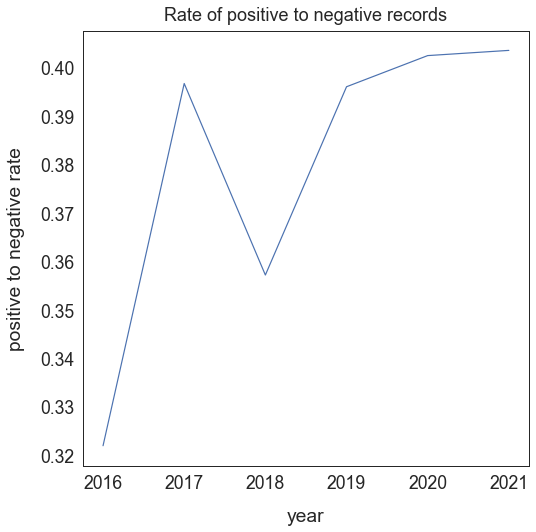

In [345]:
tiktok_subt_pos_rate = df_tiktok_joined['id_pos']/df_tiktok_joined['id_neg']

plt.figure(figsize=(8,8))
plt.title("Rate of positive to negative records", fontsize=18, y=1.01)
plt.xlabel("year", labelpad=15)
plt.ylabel("positive to negative rate", labelpad=15)
tiktok_subt_pos_rate.plot()

In [620]:
def show_tiktok_likes(df, field):
    print(f'For field - {field}')
    df_instagram_unique_with_likes = df[df[field] > 0]
    df_instagram_unique_without_likes = df[df[field] == 0]
    df_inst_unpop = df_instagram_unique_with_likes[df_instagram_unique_with_likes[field] <= df_instagram_unique_with_likes[field].quantile(0.1)]
    df_inst_pop = df_instagram_unique_with_likes[df_instagram_unique_with_likes[field] >= df_instagram_unique_with_likes[field].quantile(0.9)]

    sns.set_context("paper", font_scale=2)
    sns.set_style("white")
    plt.rc('text', usetex=False)
    fig, ax = plt.subplots(figsize=(5,5))
    sns.despine(left=True)

    ax.hist([df_inst_pop['desc_sentiment'], df_inst_unpop['desc_sentiment']], 
                  bins=5, label=["TikTok Quatile 0.9" , "TikTok Quantile 0.1"])
    ax.set_xlabel('TikTok description Sentiment')
    ax.set_ylabel('Number of texts')
    ax.legend()
    plt.show()
    
    fig, ax = plt.subplots(figsize=(5,5))
    sns.despine(left=True)

    ax.hist([df_inst_pop['subtitles_sentiment'], df_inst_unpop['subtitles_sentiment']], 
                  bins=5, label=["TikTok Quatile 0.9" , "TikTok Quantile 0.1"])
    ax.set_xlabel('TikTok subtitles Sentiment')
    ax.set_ylabel('Number of texts')
    ax.legend()
    plt.show()


In [618]:
def show_tiktok_sentiment(df):
    show_tiktok_likes(df, 'diggCount')
    show_tiktok_likes(df, 'shareCount')
    show_tiktok_likes(df, 'commentCount')
    show_tiktok_likes(df, 'playCount')

For field - diggCount


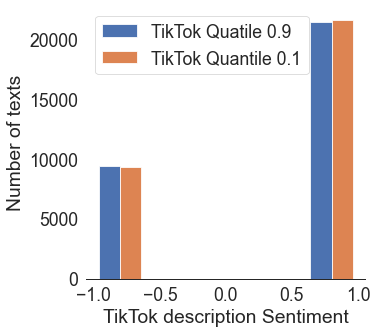

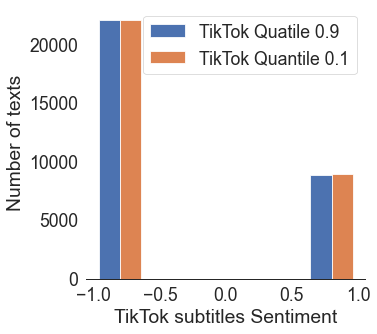

For field - shareCount


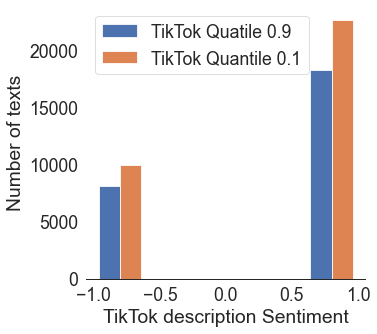

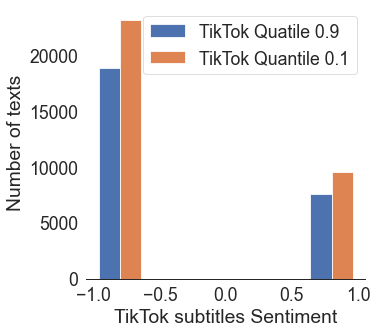

For field - commentCount


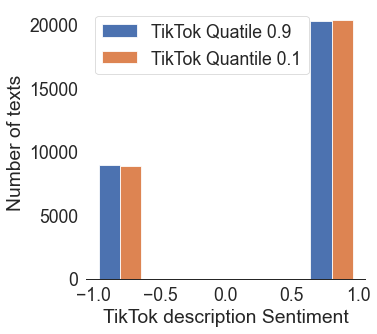

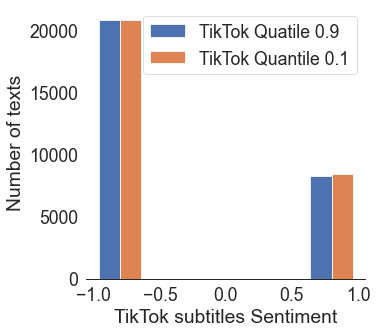

For field - playCount


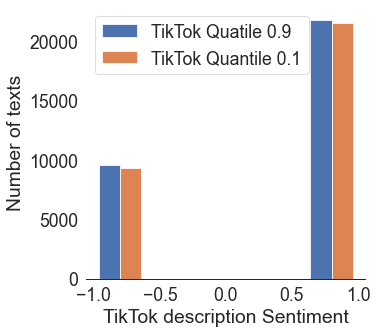

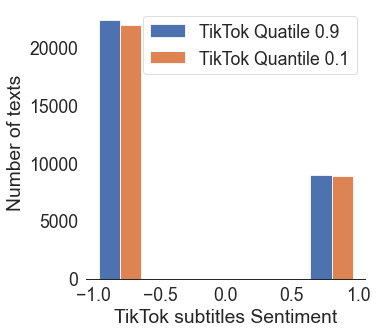

In [621]:
show_tiktok_sentiment(df_tiktok)

In [622]:
df_tiktok_pos = df_tiktok[(df_tiktok['desc_sentiment']==1) & (df_tiktok['subtitles_sentiment'] == 1)]
df_tiktok_neg = df_tiktok[(df_tiktok['desc_sentiment']==-1) & (df_tiktok['subtitles_sentiment'] == -1)]
df_tiktok_desc_neg_subt_pos = df_tiktok[(df_tiktok['desc_sentiment']==-1) & (df_tiktok['subtitles_sentiment'] == 1)]
df_tiktok_desc_pos_subt_neg = df_tiktok[(df_tiktok['desc_sentiment']==1) & (df_tiktok['subtitles_sentiment'] == -1)]

print(len(df_tiktok_pos) / len(df_tiktok))
print(len(df_tiktok_neg) / len(df_tiktok))
print(len(df_tiktok_desc_neg_subt_pos) / len(df_tiktok))
print(len(df_tiktok_desc_pos_subt_neg) / len(df_tiktok))

0.19926366102570728
0.21614455496705853
0.08765986306678723
0.49693192094044697


In [658]:
pos_tiktok_tags = []
for t in df_tiktok_pos['challenges']:
    pos_tiktok_tags.extend(list(filter(lambda k: k not in stop_challenges, t)))
  
limit = 20
df_tiktok_pos['challenges_str'] = df_tiktok_pos['challenges'].apply(lambda t: ' '.join(t))
pos_tiktok_tags_counter = collections.Counter(pos_tiktok_tags)
print(pos_tiktok_tags_counter.most_common(limit))
pos_set = set(map(lambda t: t[0], pos_tiktok_tags_counter.most_common(limit)))  

[('lgbt', 2445), ('funny', 2006), ('feminism', 1968), ('comedy', 1899), ('feminist', 1543), ('lgbtq', 1494), ('politics', 1453), ('love', 1356), ('blm', 1291), ('gay', 1251), ('leftist', 1105), ('liberal', 1018), ('trend', 992), ('makeup', 991), ('art', 970), ('women', 943), ('democrat', 902), ('alt', 864), ('feminismo', 863), ('selflove', 823)]


In [659]:
neg_tiktok_tags = []
for t in df_tiktok_neg['challenges']:
    neg_tiktok_tags.extend(list(filter(lambda k: k not in stop_challenges, t)))
  
limit = 20
df_tiktok_neg['challenges_str'] = df_tiktok_neg['challenges'].apply(lambda t: ' '.join(t))
neg_tiktok_tags_counter = collections.Counter(neg_tiktok_tags)
print(neg_tiktok_tags_counter.most_common(limit))
neg_set = set(map(lambda t: t[0], neg_tiktok_tags_counter.most_common(limit)))  

[('lgbt', 2695), ('feminism', 2238), ('funny', 2141), ('comedy', 2084), ('feminist', 1761), ('lgbtq', 1695), ('politics', 1633), ('love', 1532), ('gay', 1400), ('blm', 1238), ('leftist', 1214), ('liberal', 1178), ('trend', 1150), ('art', 1081), ('makeup', 1052), ('trump', 1017), ('women', 1006), ('democrat', 964), ('feminismo', 958), ('feminista', 932)]


In [661]:
print(neg_set - pos_set)
print(pos_set - neg_set)

{'trump', 'feminista'}
{'selflove', 'alt'}


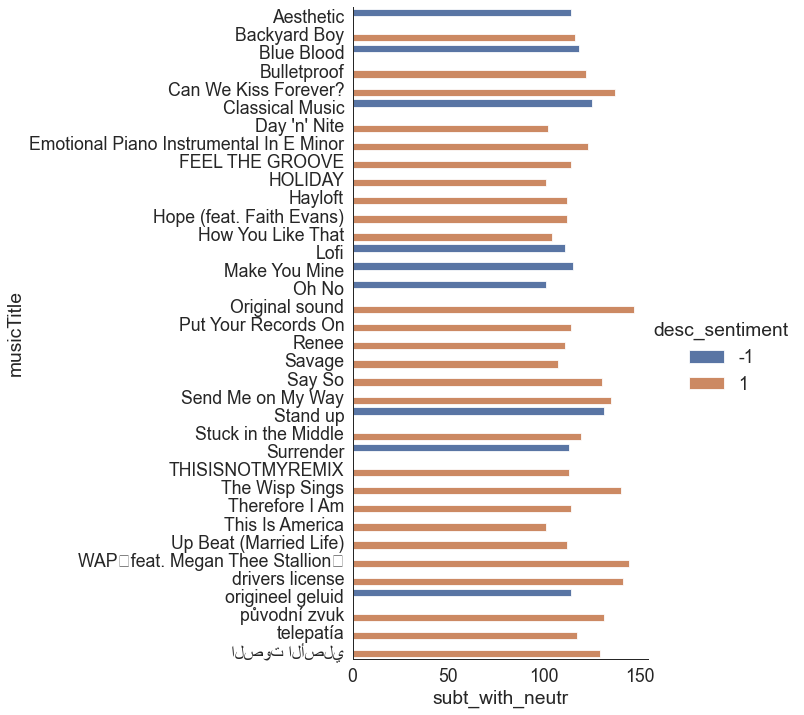

In [628]:
df_tiktok_tag = df_tiktok.groupby(['musicTitle', 'desc_sentiment']).count().reset_index()

g = sns.catplot(y="musicTitle", x="subt_with_neutr", hue="desc_sentiment", 
                data=df_tiktok_tag[(df_tiktok_tag['year'] > 100) & (df_tiktok_tag['year'] < 150)], 
                kind="bar", 
                height=10,
                aspect=1)
plt.show()

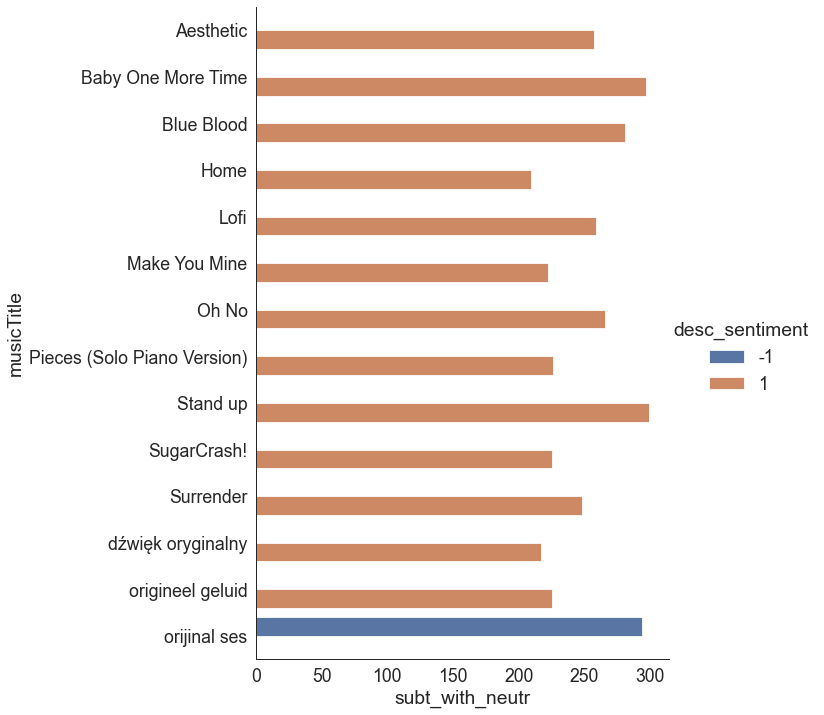

In [631]:
df_tiktok_tag = df_tiktok.groupby(['musicTitle', 'desc_sentiment']).count().reset_index()

g = sns.catplot(y="musicTitle", x="subt_with_neutr", hue="desc_sentiment", 
                data=df_tiktok_tag[(df_tiktok_tag['year'] > 200) & (df_tiktok_tag['year'] < 300)], 
                kind="bar", 
                height=10,
                aspect=1)
plt.show()

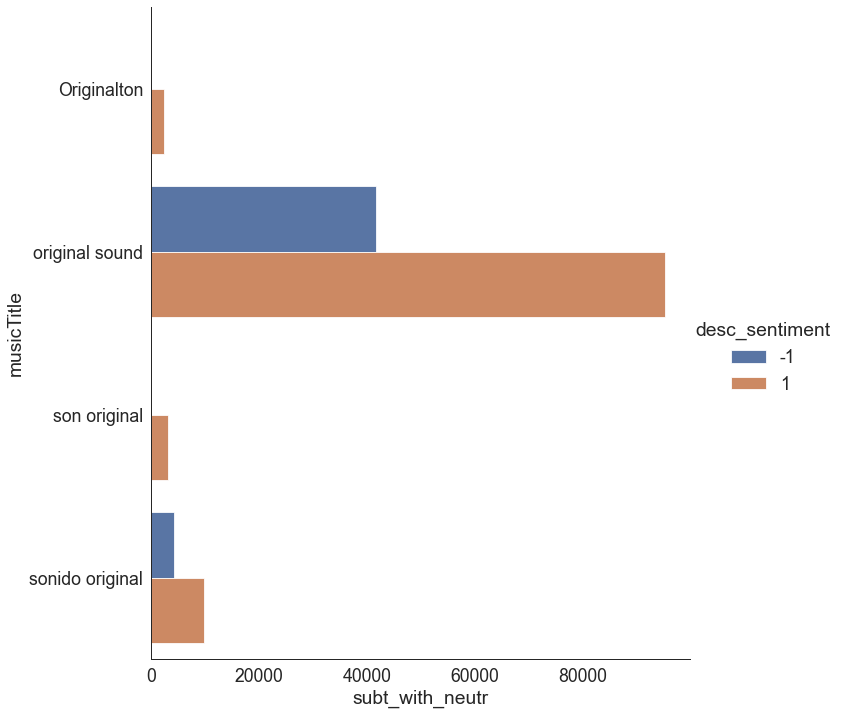

In [627]:
df_tiktok_tag = df_tiktok.groupby(['musicTitle', 'desc_sentiment']).count().reset_index()

g = sns.catplot(y="musicTitle", x="subt_with_neutr", hue="desc_sentiment", 
                data=df_tiktok_tag[df_tiktok_tag['year'] > 1000], 
                kind="bar", 
                height=10,
                aspect=1)
plt.show()

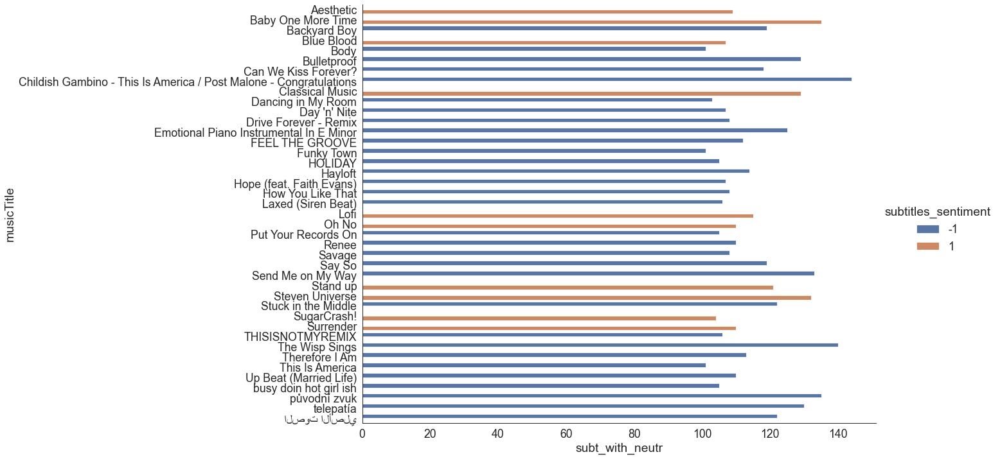

In [625]:
df_tiktok_tag = df_tiktok.groupby(['musicTitle', 'subtitles_sentiment']).count().reset_index()

g = sns.catplot(y="musicTitle", x="subt_with_neutr", hue="subtitles_sentiment", 
                data=df_tiktok_tag[(df_tiktok_tag['year'] > 100) & (df_tiktok_tag['year'] < 150)], 
                kind="bar", 
                height=10,
                aspect=2)
plt.show()

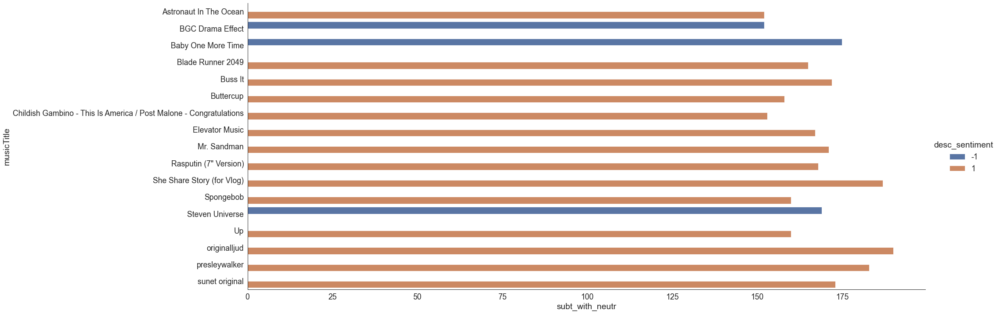

In [381]:
df_tiktok_tag = df_tiktok.groupby(['musicTitle', 'desc_sentiment']).count().reset_index()

g = sns.catplot(y="musicTitle", x="subt_with_neutr", hue="desc_sentiment",
                data=df_tiktok_tag[(df_tiktok_tag['year'] > 150) & (df_tiktok_tag['year'] < 200)], 
                kind="bar", 
                height=10,
                aspect=3)
plt.show()

In [648]:
tiktok_music_titles = Counter(df_tiktok['musicTitle'].values)
most_pos = []
most_neg = []
for m in tiktok_music_titles.most_common(1000):
    if len(m) > 0:
        _df = df_tiktok[df_tiktok['musicTitle'] == m[0]]
#         print(len(_df), m, len(m))
        _df_pos = len(_df[_df['desc_sentiment'] == 1])
        _df_neg = len(_df[_df['desc_sentiment'] == -1])
        pos_rate = _df_pos / (_df_pos + _df_neg)
        if pos_rate > 0.9:
            most_pos.append(m)
        if pos_rate < 0.1:
            most_neg.append(m)
print(most_pos)
print()
print(most_neg)

[('Grammarg', 42), ('MotorSport', 27), ('Beat It - Extended Version', 27), ('Girls in the Hood', 27), ('Ice Cream', 26)]

[]


In [650]:
tiktok_music_titles = Counter(df_tiktok['musicTitle'].values)
most_pos = []
most_neg = []
for m in tiktok_music_titles.most_common(1000):
    if len(m) > 0:
        _df = df_tiktok[df_tiktok['musicTitle'] == m[0]]
#         print(len(_df), m, len(m))
        _df_pos = len(_df[_df['subtitles_sentiment'] == 1])
        _df_neg = len(_df[_df['subtitles_sentiment'] == -1])
        pos_rate = _df_pos / (_df_pos + _df_neg)
        if pos_rate > 0.9:
            most_pos.append(m)
        if pos_rate < 0.1:
            most_neg.append(m)
print(most_pos)
print()
print(most_neg)

[]

[('My Tears Are Becoming A Sea', 33), ('Mount Everest', 29), ('treehouse by alex g', 26), ('Jzuz tarhini i still got my money', 26), ('真夜中のドア/Stay With Me', 25), ('Morgan St. Jean Not All Men unreleased', 24), ('my sense of humor', 24), ('mayday mayday', 23)]


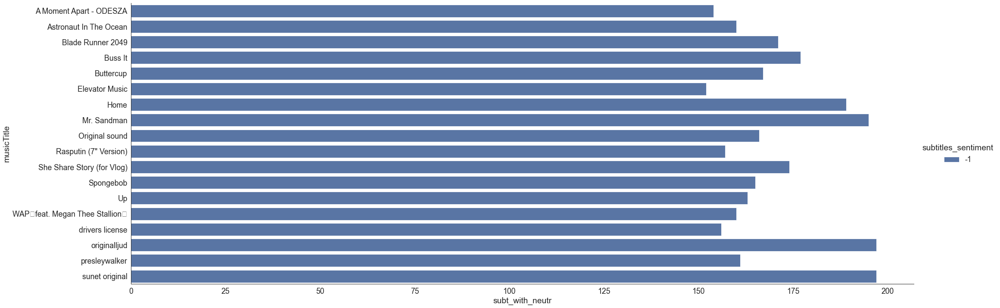

In [383]:
df_tiktok_tag = df_tiktok.groupby(['musicTitle', 'subtitles_sentiment']).count().reset_index()

g = sns.catplot(y="musicTitle", x="subt_with_neutr", hue="subtitles_sentiment",
                data=df_tiktok_tag[(df_tiktok_tag['year'] > 150) & (df_tiktok_tag['year'] < 200)], 
                kind="bar", 
                height=10,
                aspect=3)
plt.show()

In [652]:
def show_tiktok_challenges(df, tags):
    for t in tags:
        tag = t[0]
        print(f'Tag: {tag}')
        _df = df[df['challenges_str'].str.contains(tag)]
        show_tiktok_sentiment(_df)
        print('-------------------------------------------------------')

    tiktok_tags = []
    tiktok_positive_rate = []
    tiktok_negative_rate = []
    for tag in tags:
        print(tag)
        _df = df[df['challenges_str'].str.contains(tag[0])]
        if len(_df)> 10:
            tiktok_tags.append(tag[0])
            pos = len(_df[_df['desc_sentiment'] == 1])
            tiktok_positive_rate.append(pos / len(_df))
            tiktok_negative_rate.append(-(1 - pos / len(_df)))
    print(list(zip(tiktok_tags, tiktok_positive_rate, tiktok_negative_rate)))

    plt.figure(figsize=(10, 10))
    plt.barh(tiktok_tags, tiktok_positive_rate, align='center', label="Positive rate")

    plt.barh(tiktok_tags, tiktok_negative_rate, align='center', label="Negative rate")
    plt.legend()

    plt.ylabel('Challenges')
    plt.xlabel('Sentiment rate of challenges records')
    plt.title('TikTok sentiment for challenges')
    plt.tight_layout()
    plt.show()

[('lgbt', 12252), ('feminism', 10158), ('funny', 10079), ('comedy', 9575), ('feminist', 8098), ('lgbtq', 7663), ('politics', 7300), ('love', 7086), ('gay', 6333), ('blm', 6007), ('leftist', 5436), ('liberal', 5269), ('trend', 5173), ('makeup', 4924), ('art', 4924), ('women', 4550), ('democrat', 4425), ('trump', 4319), ('feminismo', 4251), ('alt', 4150)]
Tag: lgbt
For field - diggCount


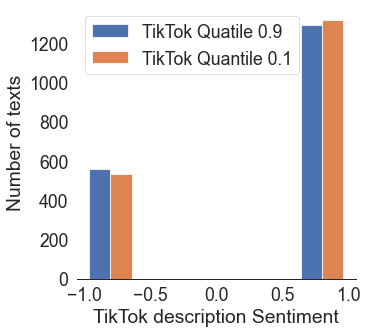

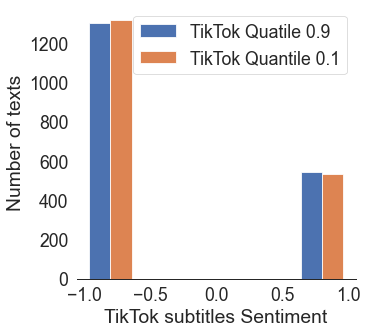

For field - shareCount


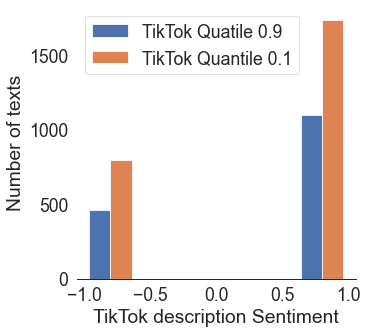

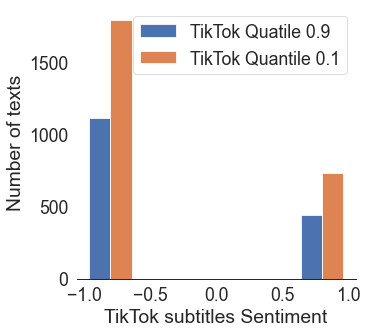

For field - commentCount


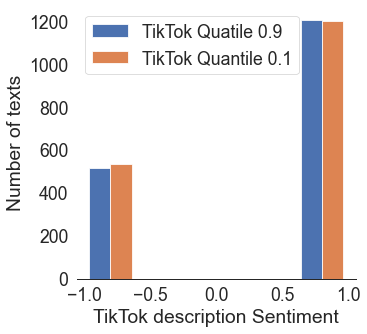

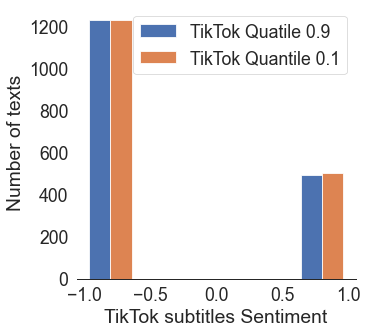

For field - playCount


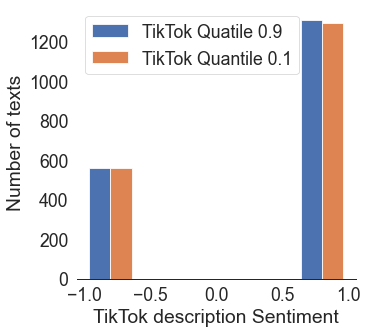

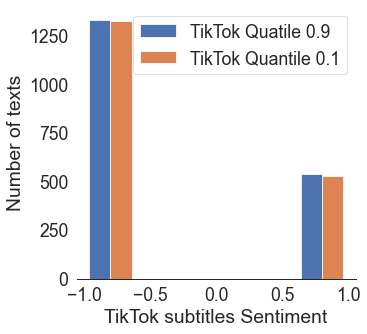

-------------------------------------------------------
Tag: feminism
For field - diggCount


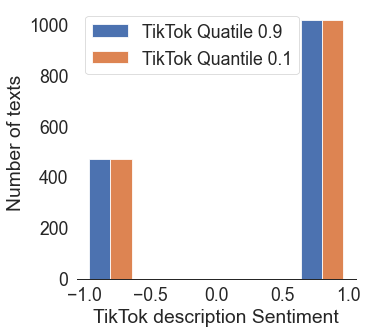

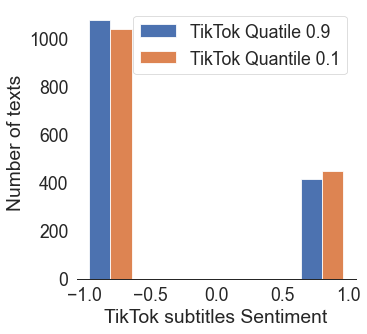

For field - shareCount


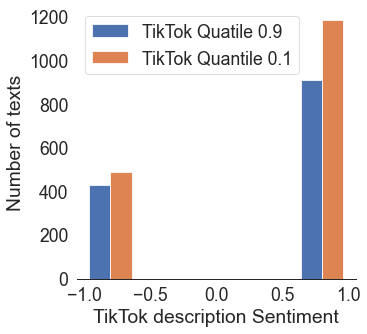

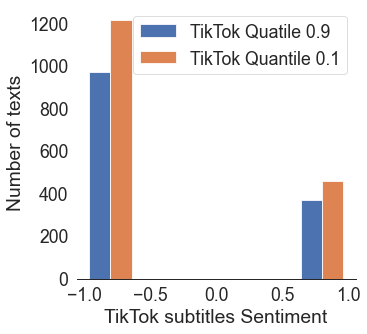

For field - commentCount


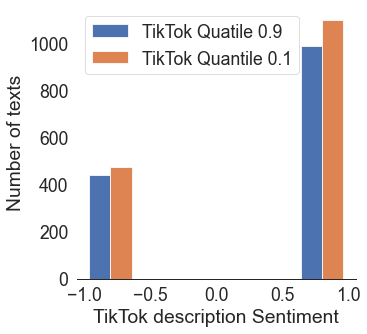

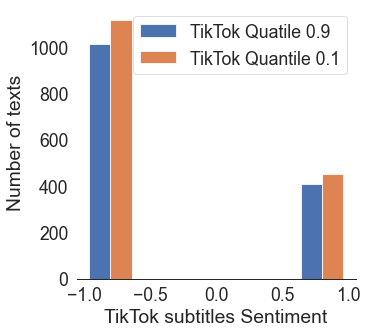

For field - playCount


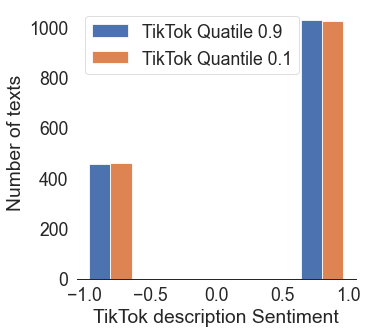

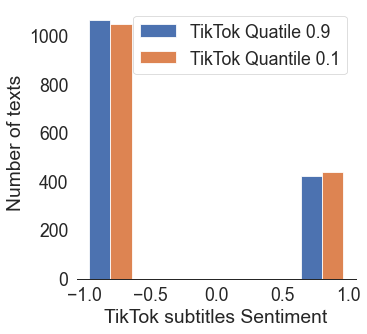

-------------------------------------------------------
Tag: funny
For field - diggCount


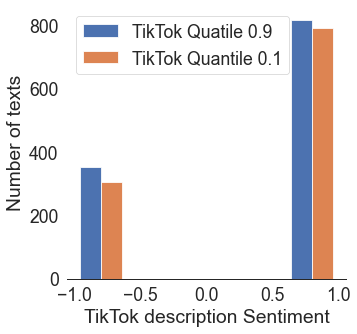

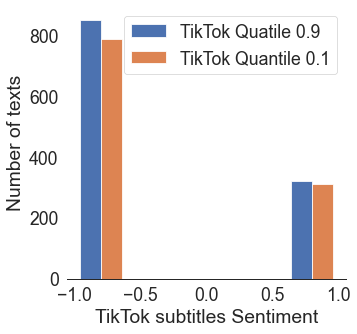

For field - shareCount


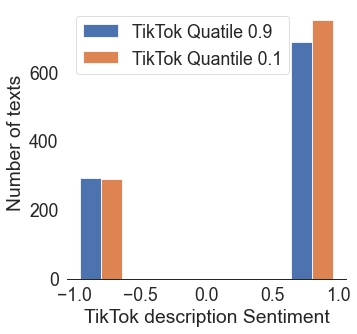

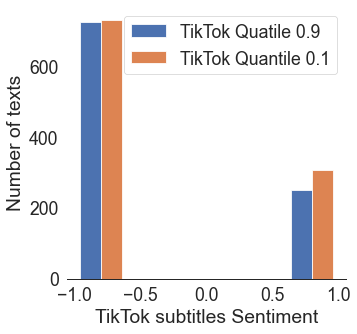

For field - commentCount


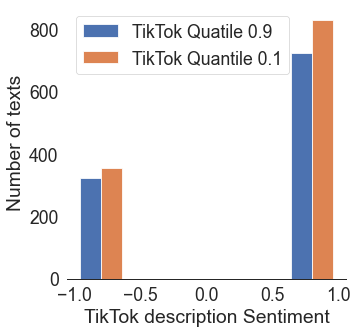

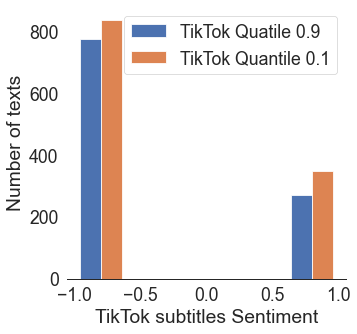

For field - playCount


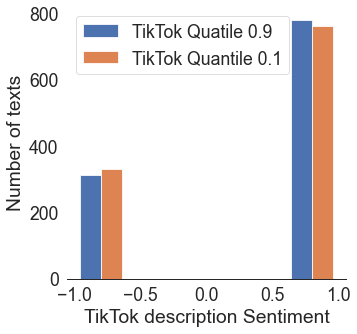

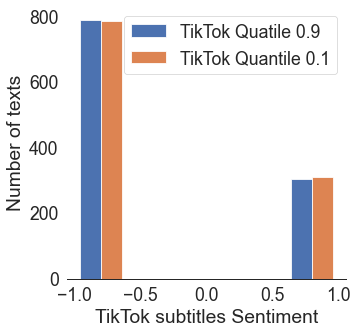

-------------------------------------------------------
Tag: comedy
For field - diggCount


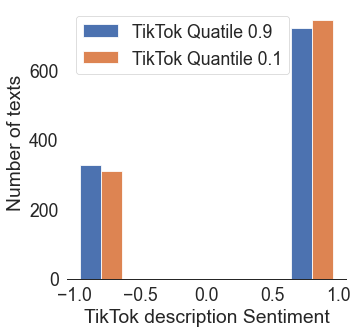

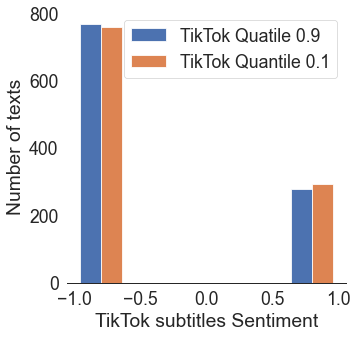

For field - shareCount


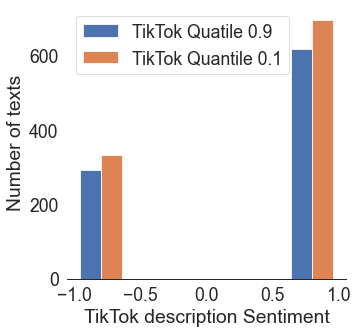

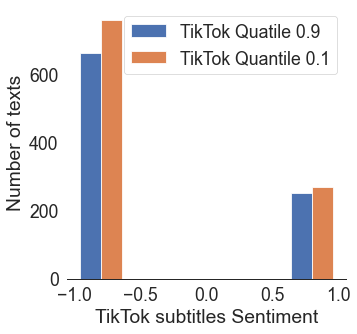

For field - commentCount


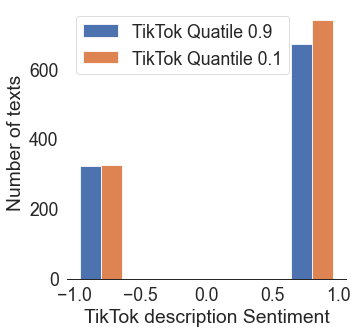

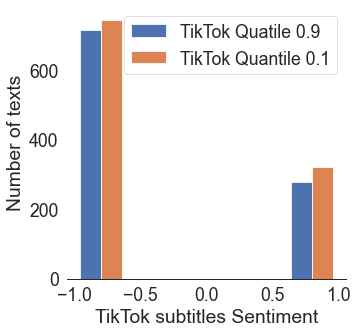

For field - playCount


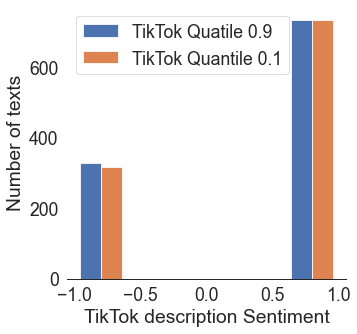

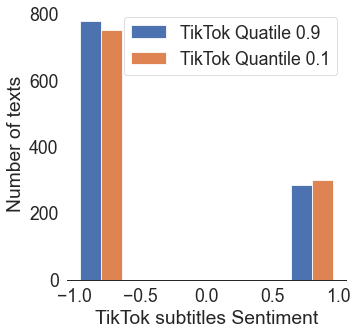

-------------------------------------------------------
Tag: feminist
For field - diggCount


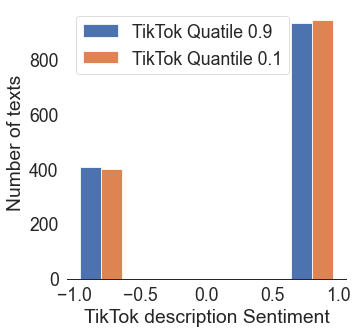

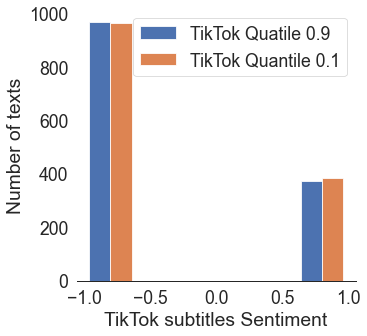

For field - shareCount


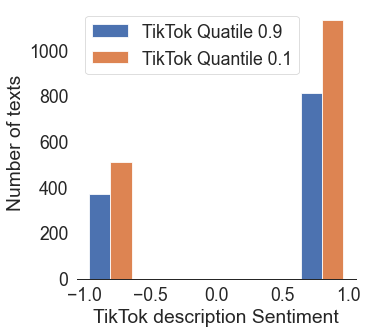

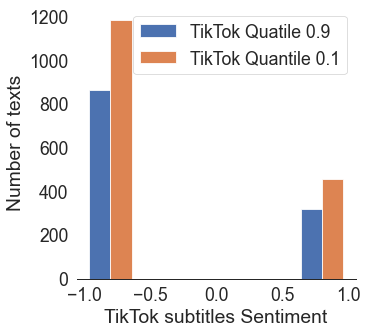

For field - commentCount


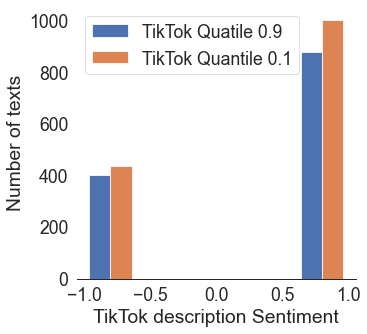

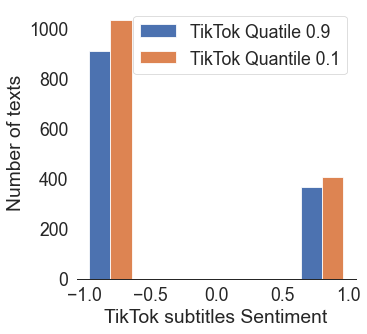

For field - playCount


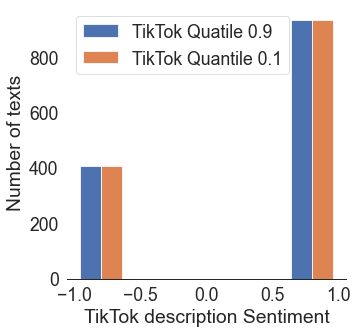

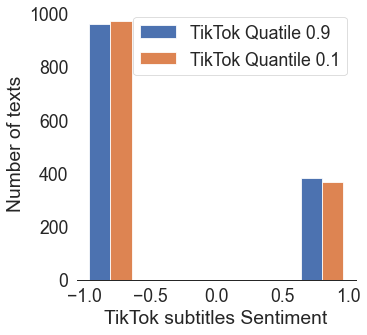

-------------------------------------------------------
Tag: lgbtq
For field - diggCount


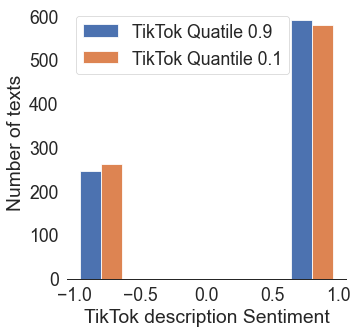

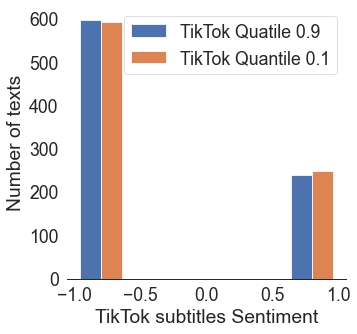

For field - shareCount


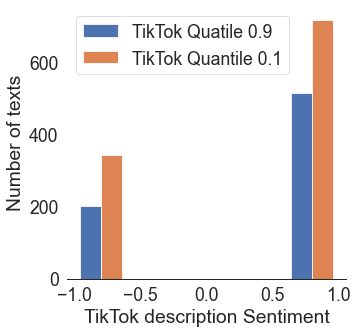

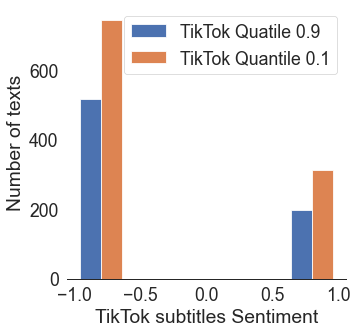

For field - commentCount


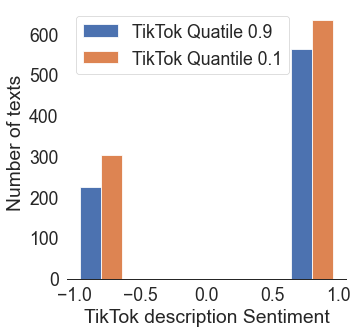

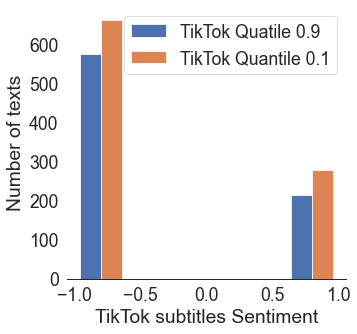

For field - playCount


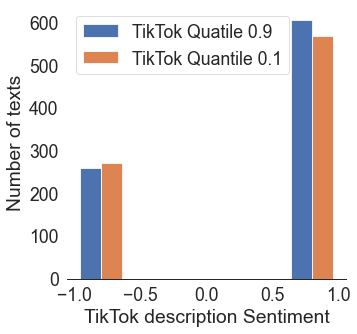

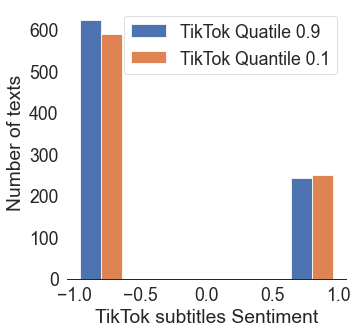

-------------------------------------------------------
Tag: politics
For field - diggCount


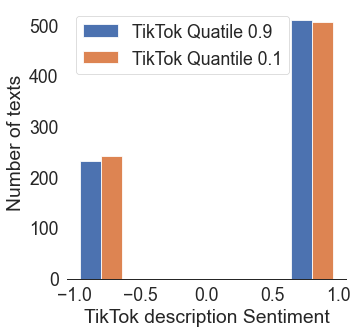

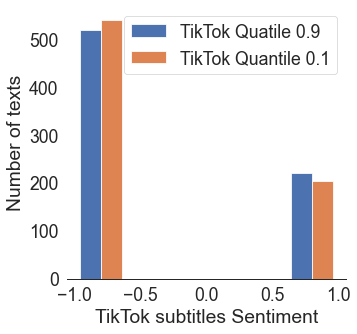

For field - shareCount


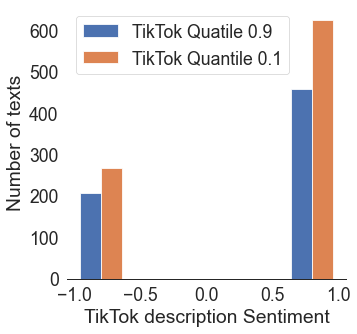

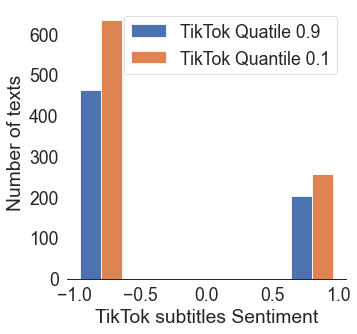

For field - commentCount


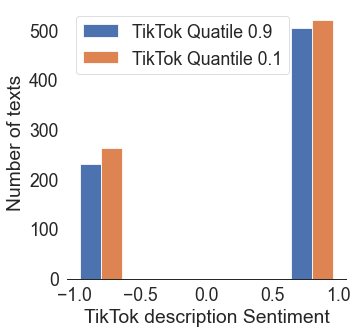

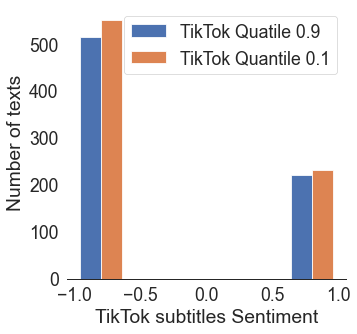

For field - playCount


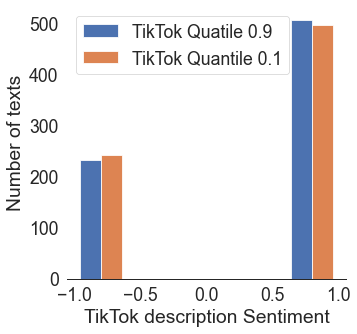

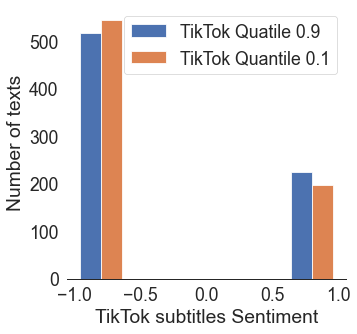

-------------------------------------------------------
Tag: love
For field - diggCount


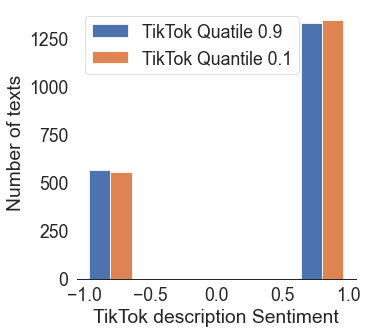

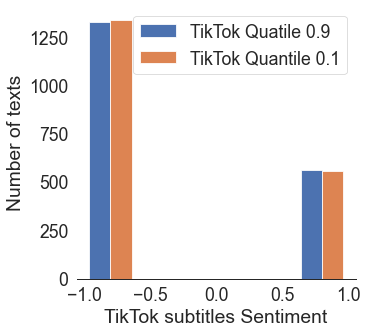

For field - shareCount


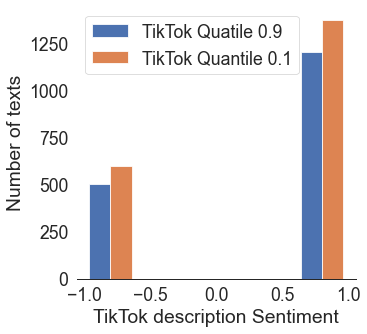

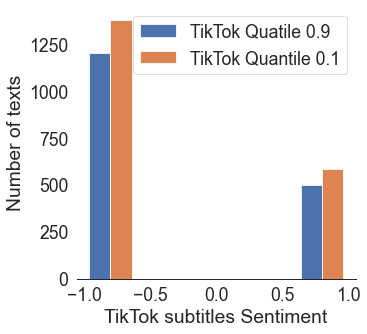

For field - commentCount


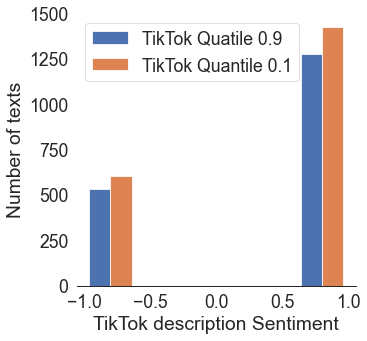

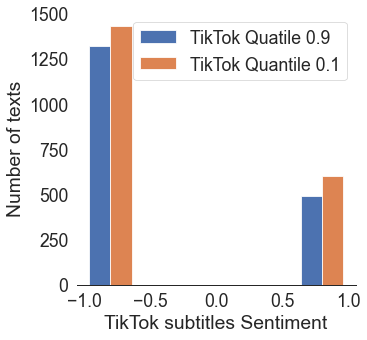

For field - playCount


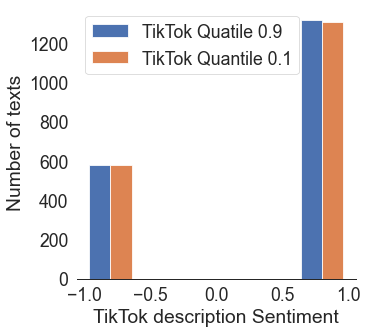

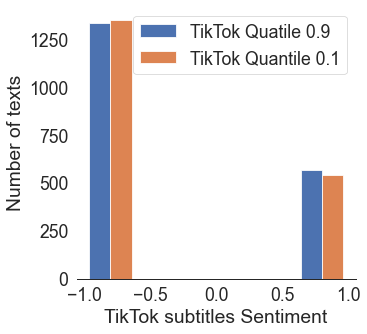

-------------------------------------------------------
Tag: gay
For field - diggCount


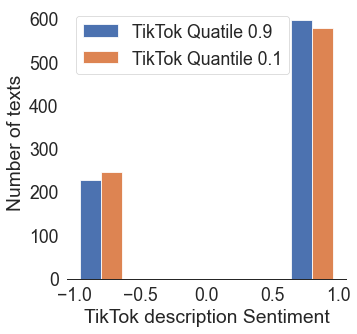

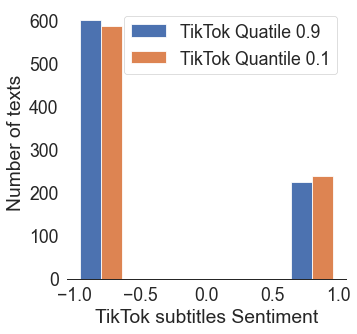

For field - shareCount


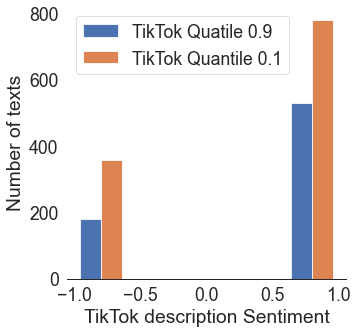

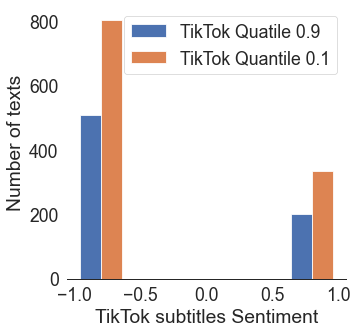

For field - commentCount


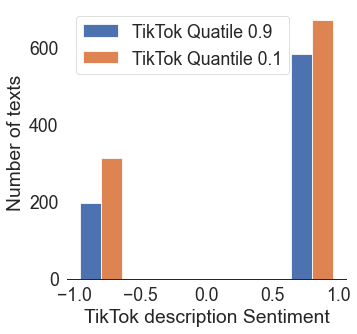

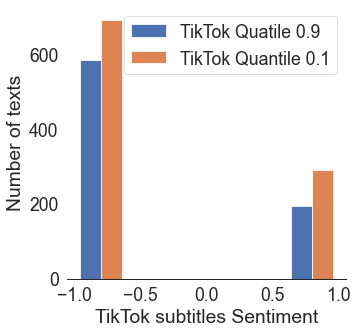

For field - playCount


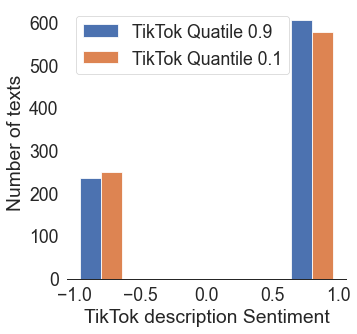

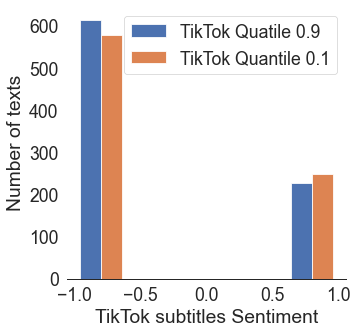

-------------------------------------------------------
Tag: blm
For field - diggCount


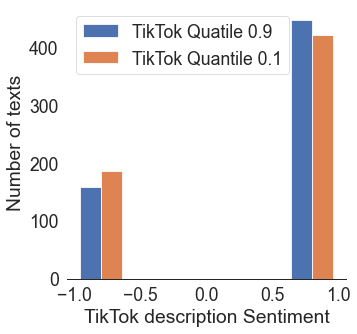

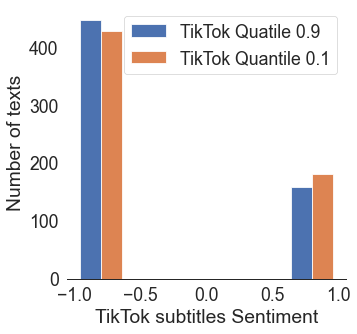

For field - shareCount


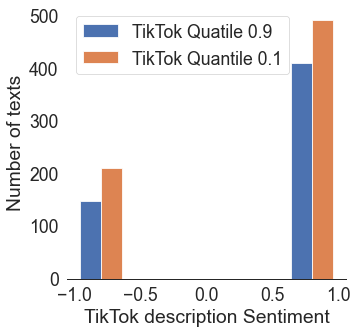

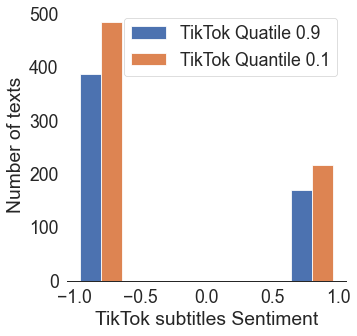

For field - commentCount


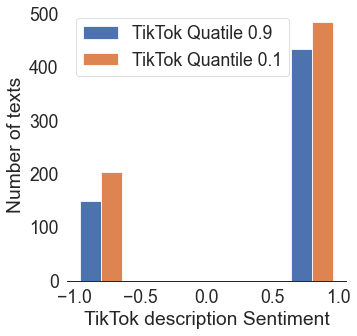

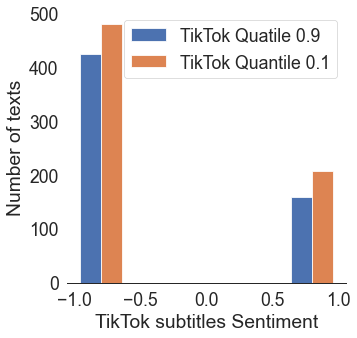

For field - playCount


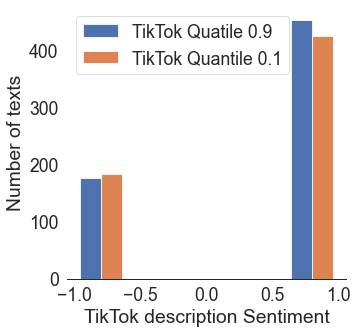

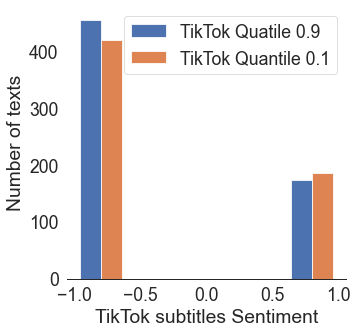

-------------------------------------------------------
Tag: leftist
For field - diggCount


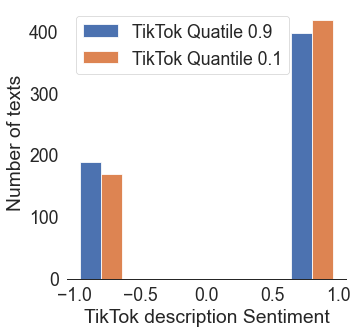

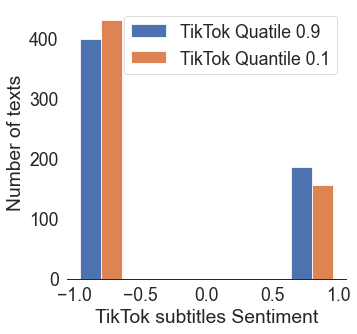

For field - shareCount


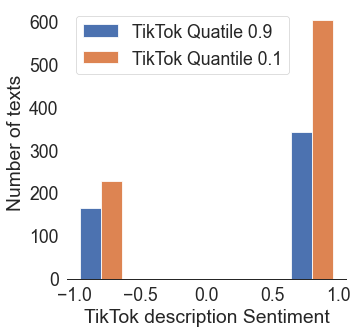

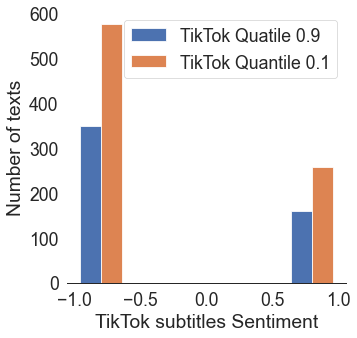

For field - commentCount


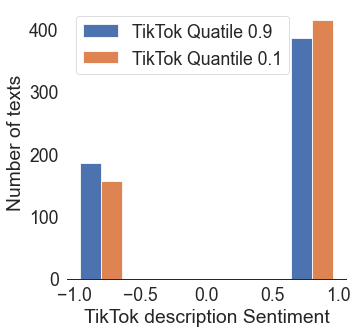

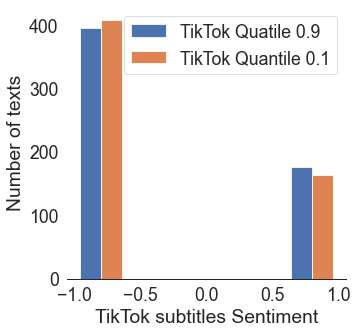

For field - playCount


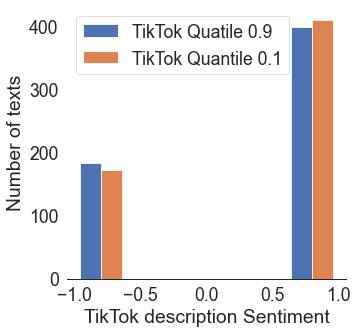

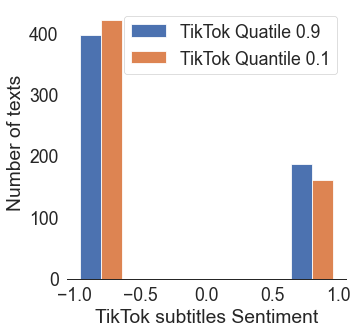

-------------------------------------------------------
Tag: liberal
For field - diggCount


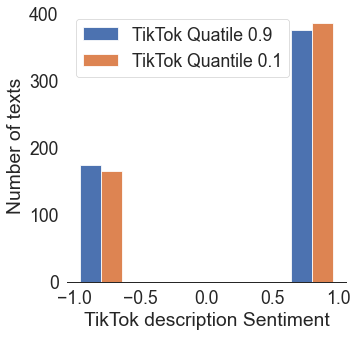

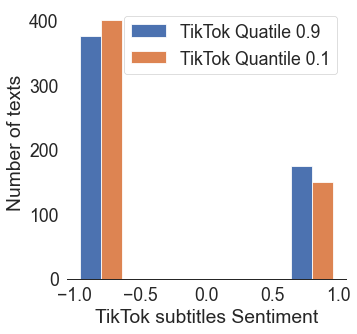

For field - shareCount


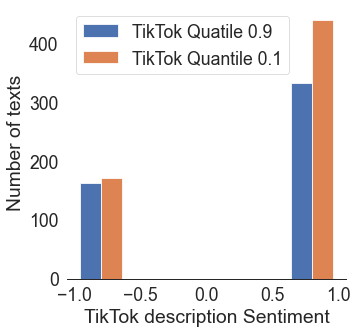

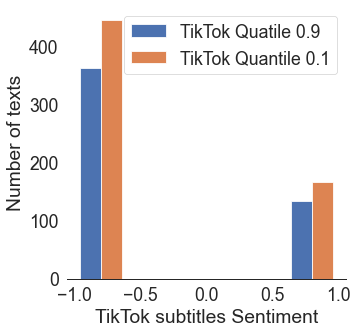

For field - commentCount


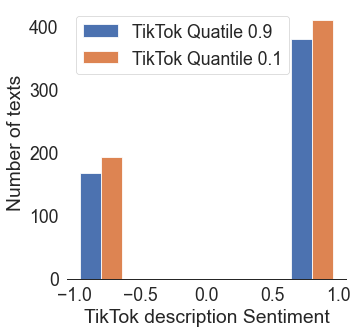

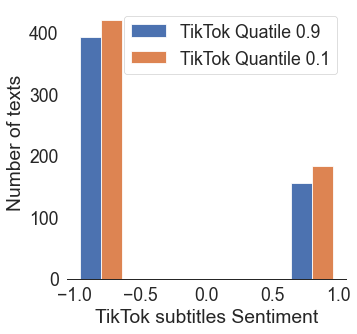

For field - playCount


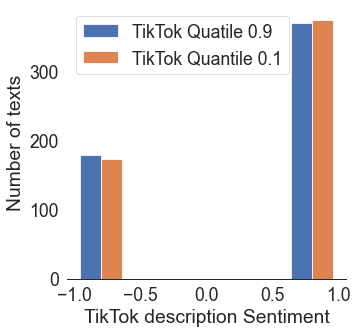

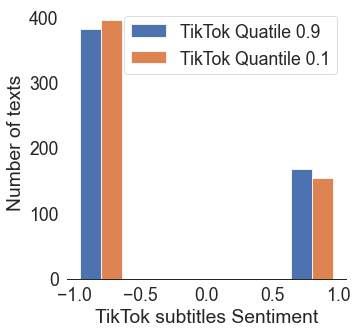

-------------------------------------------------------
Tag: trend
For field - diggCount


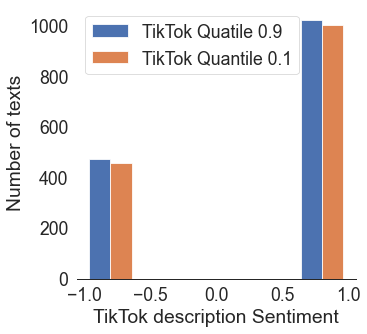

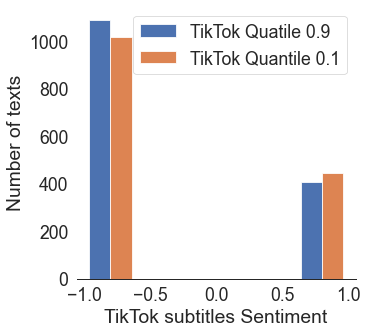

For field - shareCount


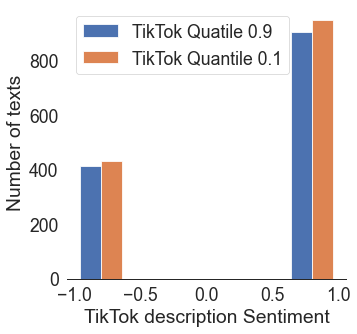

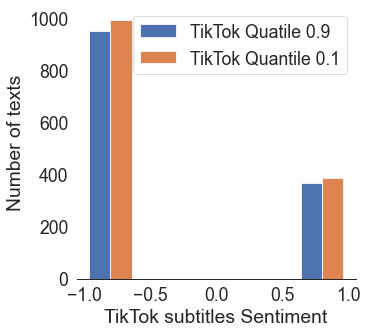

For field - commentCount


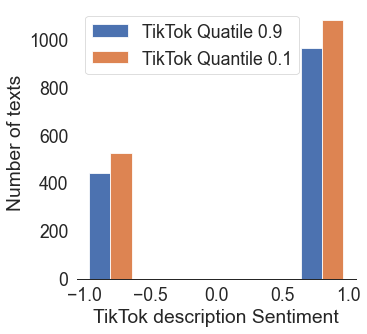

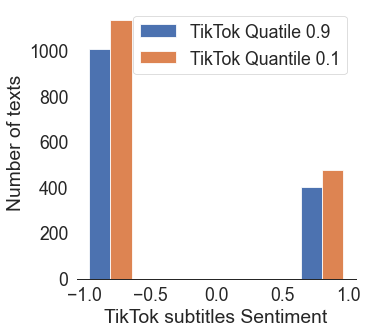

For field - playCount


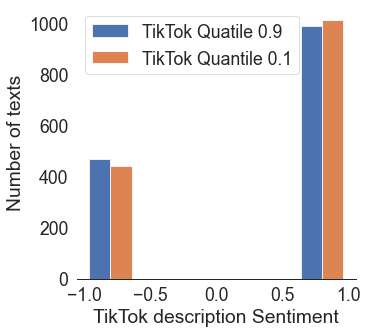

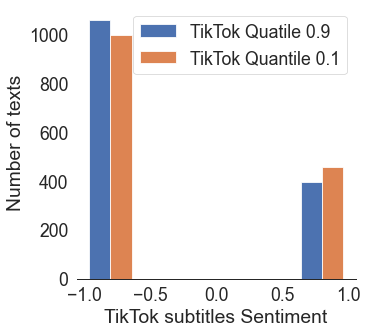

-------------------------------------------------------
Tag: makeup
For field - diggCount


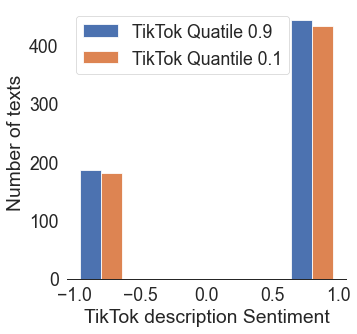

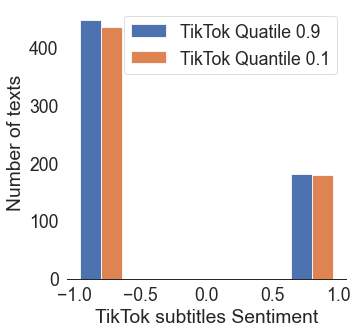

For field - shareCount


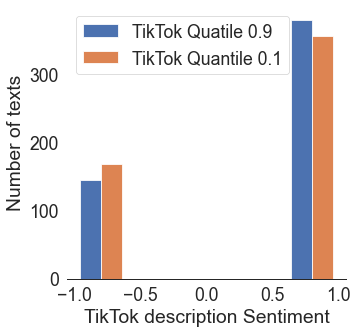

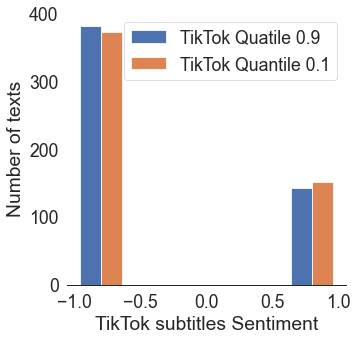

For field - commentCount


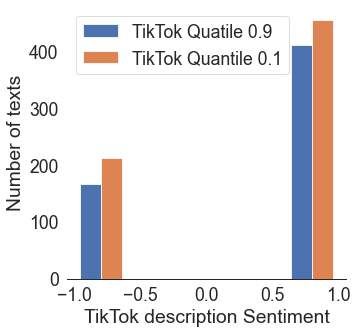

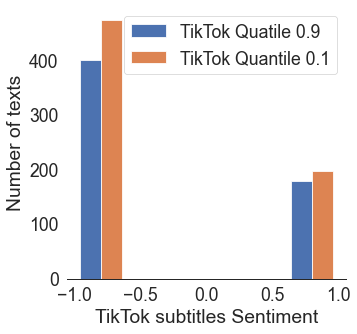

For field - playCount


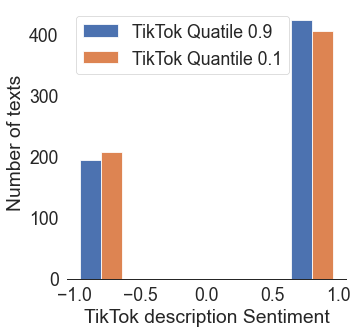

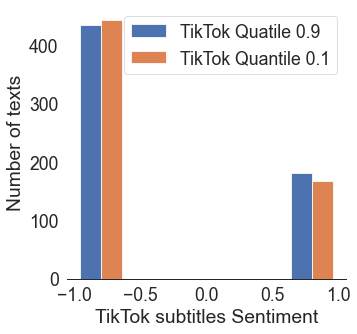

-------------------------------------------------------
Tag: art
For field - diggCount


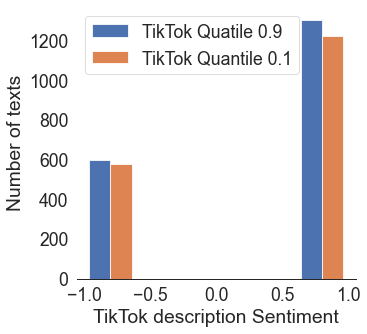

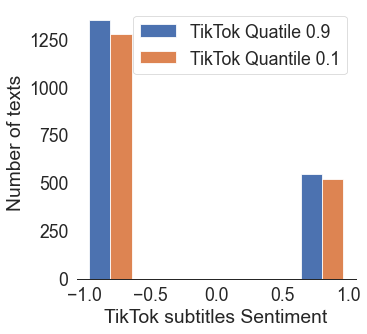

For field - shareCount


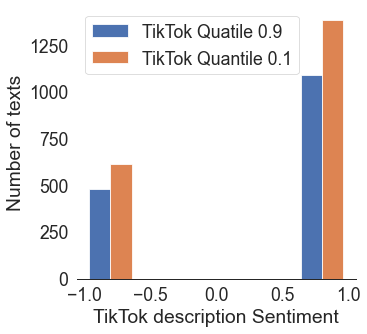

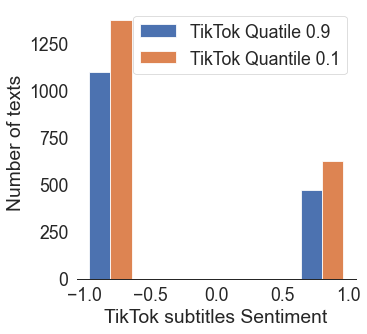

For field - commentCount


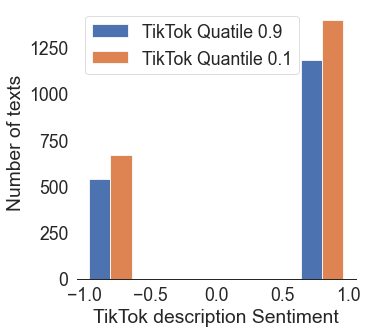

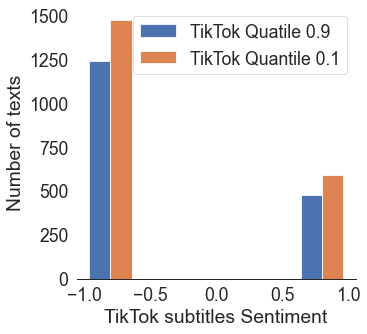

For field - playCount


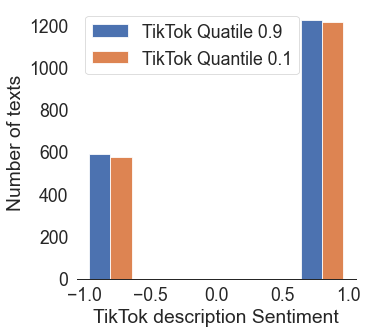

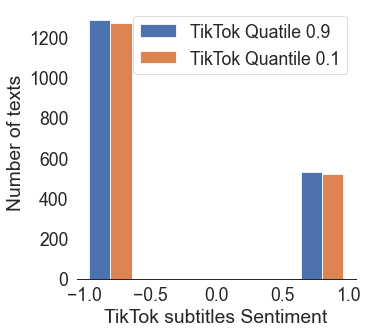

-------------------------------------------------------
Tag: women
For field - diggCount


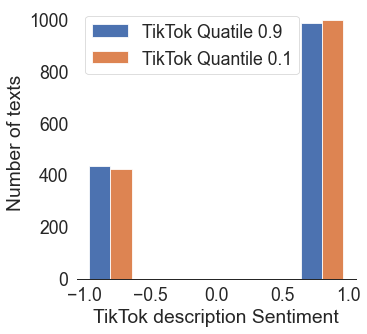

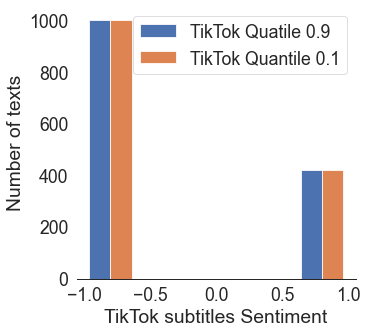

For field - shareCount


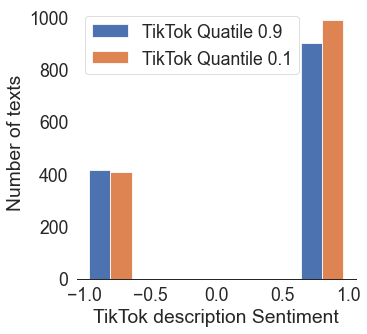

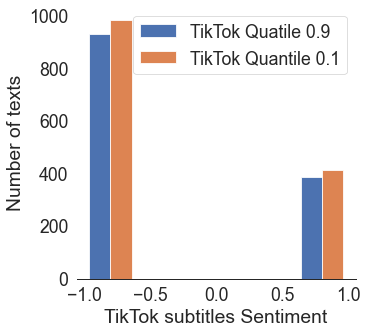

For field - commentCount


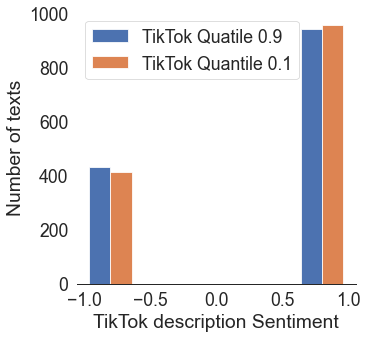

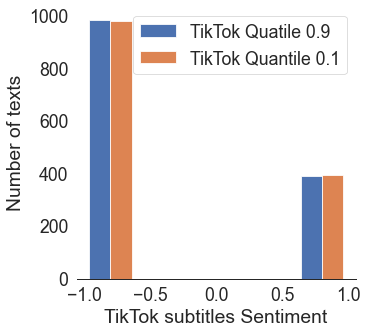

For field - playCount


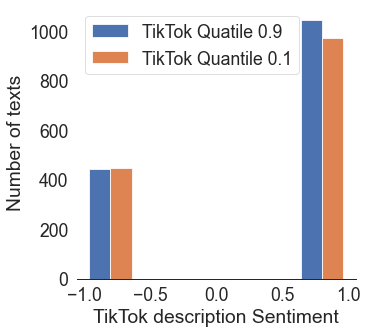

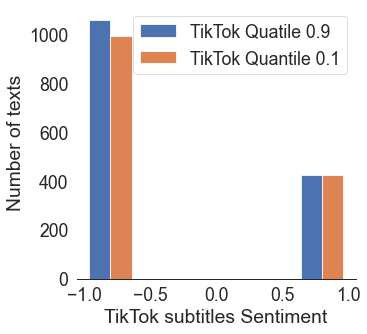

-------------------------------------------------------
Tag: democrat
For field - diggCount


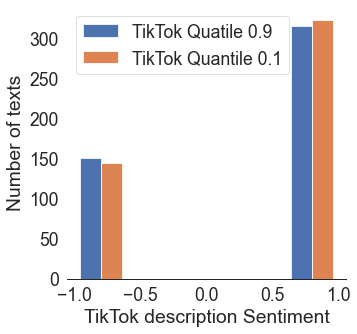

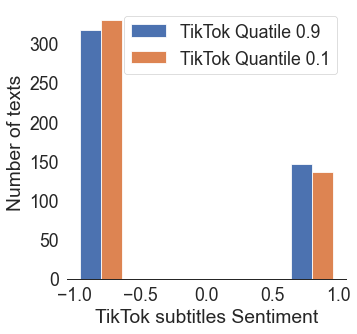

For field - shareCount


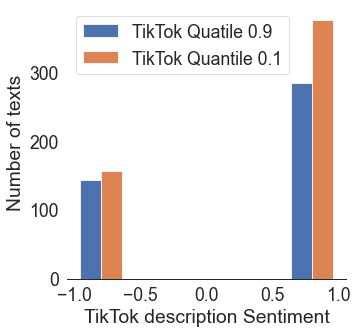

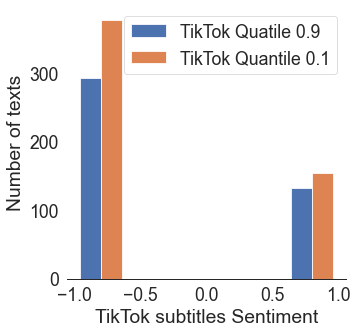

For field - commentCount


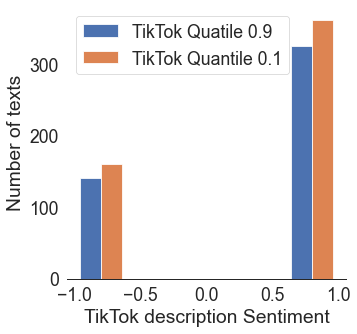

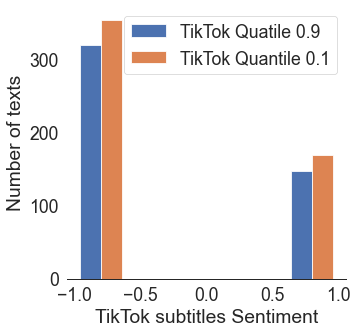

For field - playCount


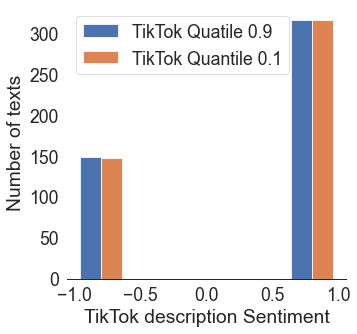

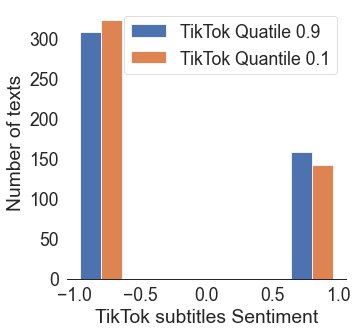

-------------------------------------------------------
Tag: trump
For field - diggCount


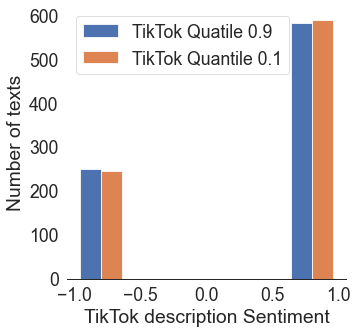

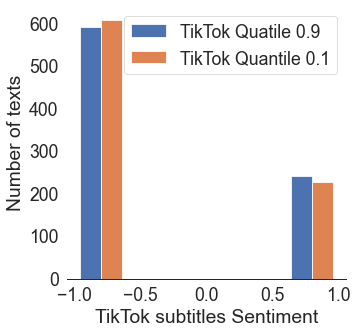

For field - shareCount


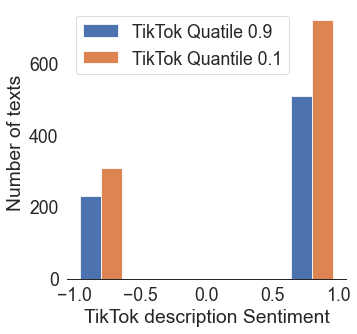

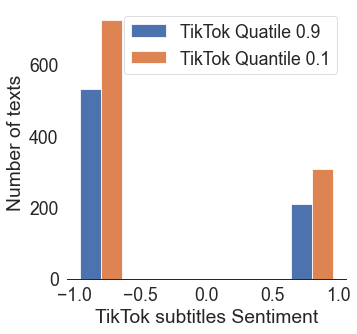

For field - commentCount


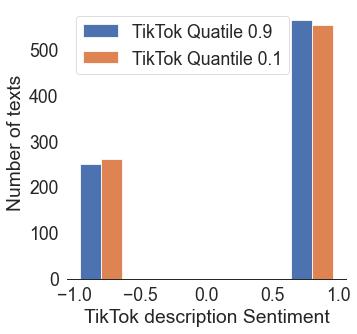

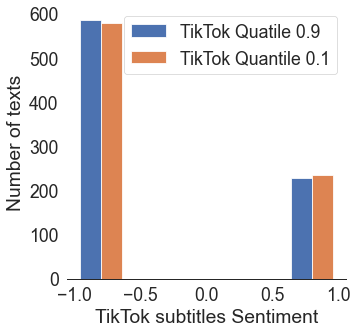

For field - playCount


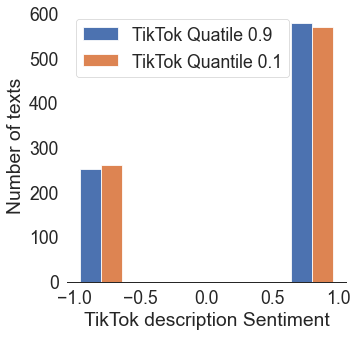

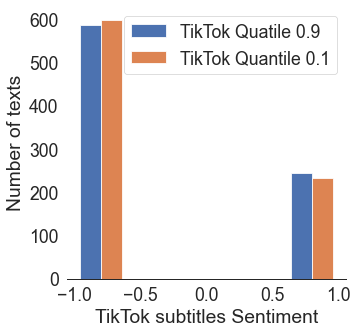

-------------------------------------------------------
Tag: feminismo
For field - diggCount


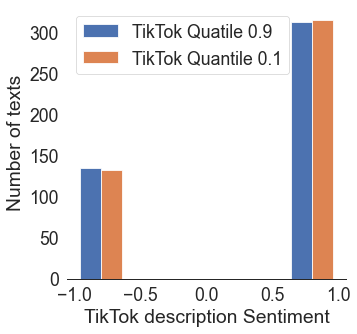

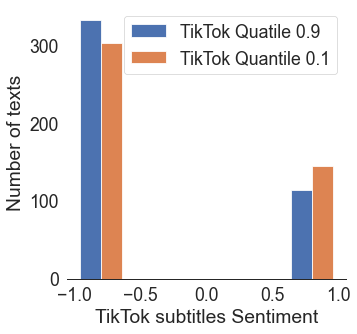

For field - shareCount


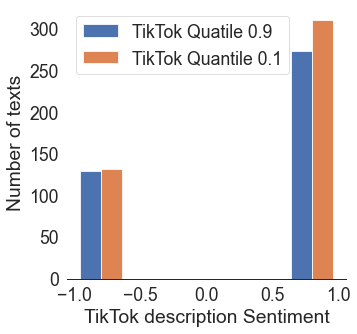

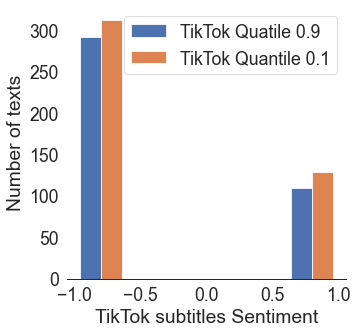

For field - commentCount


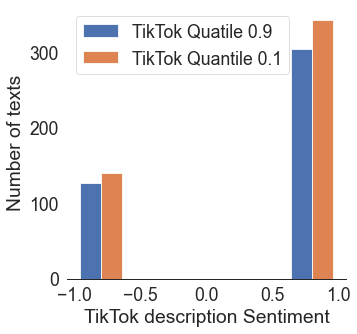

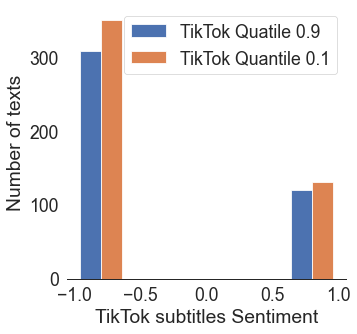

For field - playCount


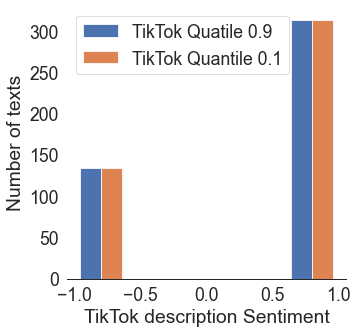

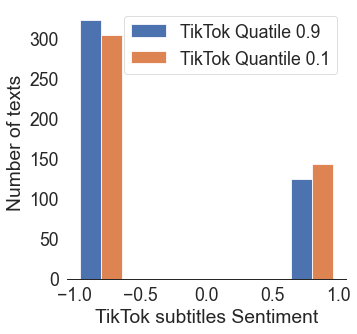

-------------------------------------------------------
Tag: alt
For field - diggCount


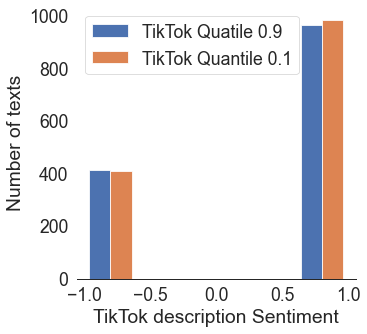

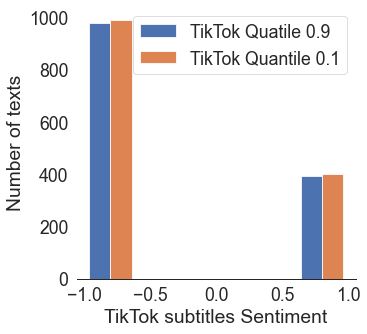

For field - shareCount


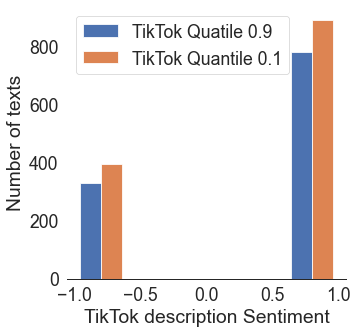

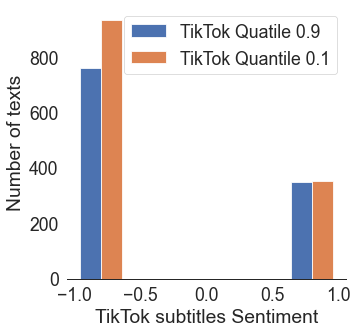

For field - commentCount


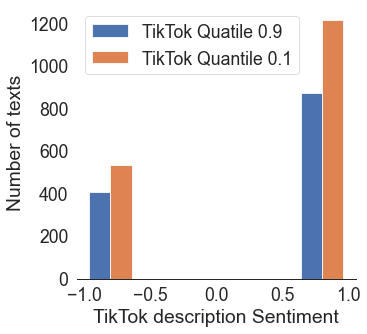

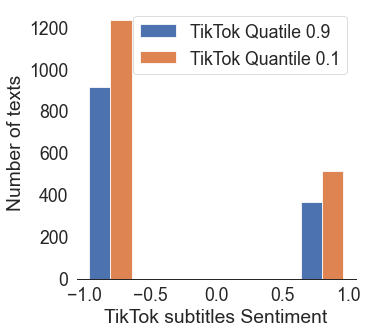

For field - playCount


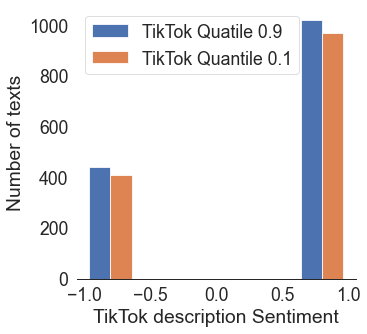

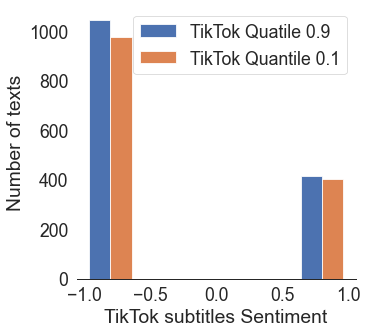

-------------------------------------------------------
('lgbt', 12252)
('feminism', 10158)
('funny', 10079)
('comedy', 9575)
('feminist', 8098)
('lgbtq', 7663)
('politics', 7300)
('love', 7086)
('gay', 6333)
('blm', 6007)
('leftist', 5436)
('liberal', 5269)
('trend', 5173)
('makeup', 4924)
('art', 4924)
('women', 4550)
('democrat', 4425)
('trump', 4319)
('feminismo', 4251)
('alt', 4150)
[('lgbt', 0.6969680679496828, -0.3030319320503172), ('feminism', 0.6937445407511926, -0.30625545924880737), ('funny', 0.7013235965312643, -0.2986764034687357), ('comedy', 0.6959498003422704, -0.3040501996577296), ('feminist', 0.6943452380952381, -0.30565476190476193), ('lgbtq', 0.6939552594002856, -0.3060447405997144), ('politics', 0.6908702616123865, -0.3091297383876135), ('love', 0.6969617048211837, -0.3030382951788163), ('gay', 0.696391939181851, -0.30360806081814895), ('blm', 0.7069050352632442, -0.2930949647367558), ('leftist', 0.691146540027137, -0.30885345997286295), ('liberal', 0.68709677419354

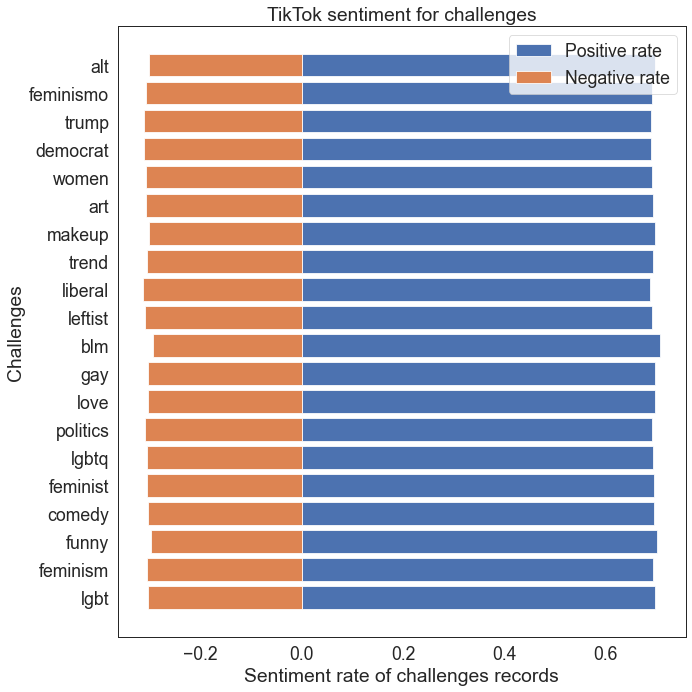

In [676]:
stop_challenges = ['fyp', 'foryou', 'foryoupage', 'viral', 'xyzbca', 'duet', 'fy', 'fypシ', 'trending', 'parati', 
                  'stitch', 'tiktok', 'greenscreen', 'foryourpage', '4u']
tiktok_tags = []
for t in df_tiktok['challenges']:
    tiktok_tags.extend(list(filter(lambda k: k not in stop_challenges, t)))
  
limit = 20
df_tiktok['challenges_str'] = df_tiktok['challenges'].apply(lambda t: ' '.join(t))
tiktok_tags_counter = collections.Counter(tiktok_tags)
print(tiktok_tags_counter.most_common(limit))

show_tiktok_challenges(df_tiktok, tiktok_tags_counter.most_common(limit))

In [414]:
tiktok_tags_counter.most_common(50)

[('lgbt', 12252),
 ('feminism', 10158),
 ('funny', 10079),
 ('comedy', 9575),
 ('feminist', 8098),
 ('lgbtq', 7663),
 ('politics', 7300),
 ('love', 7086),
 ('gay', 6333),
 ('blm', 6007),
 ('leftist', 5436),
 ('liberal', 5269),
 ('trend', 5173),
 ('makeup', 4924),
 ('art', 4924),
 ('women', 4550),
 ('democrat', 4425),
 ('trump', 4319),
 ('feminismo', 4251),
 ('alt', 4150),
 ('selflove', 4082),
 ('feminista', 4002),
 ('blacklivesmatter', 3690),
 ('lesbian', 3652),
 ('usa', 3589),
 ('republican', 3561),
 ('pov', 3500),
 ('girls', 3483),
 ('conservative', 3435),
 ('biden2020', 3258),
 ('comedia', 3227),
 ('pourtoi', 3219),
 ('humor', 3194),
 ('foru', 3190),
 ('trump2020', 3148),
 ('bisexual', 3023),
 ('biden', 3007),
 ('relatable', 2943),
 ('bi', 2916),
 ('america', 2805),
 ('queer', 2730),
 ('wlw', 2656),
 ('music', 2619),
 ('meme', 2618),
 ('equality', 2579),
 ('relationship', 2528),
 ('like', 2513),
 ('facts', 2461),
 ('men', 2451),
 ('mentalhealth', 2401)]

Tag: mentalhealth
For field - diggCount


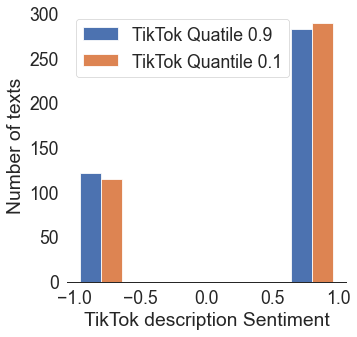

<Figure size 1440x1440 with 0 Axes>

For field - shareCount


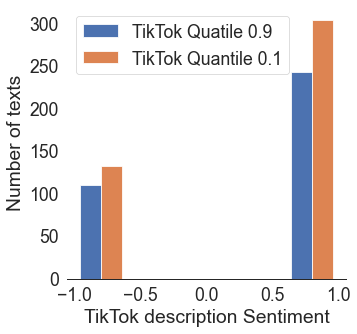

<Figure size 1440x1440 with 0 Axes>

For field - commentCount


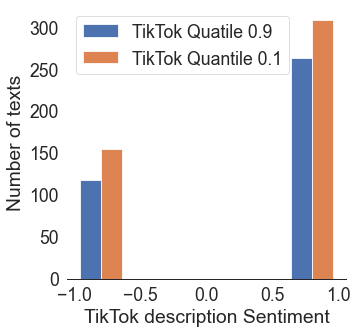

<Figure size 1440x1440 with 0 Axes>

For field - playCount


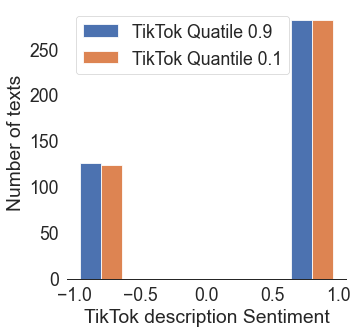

<Figure size 1440x1440 with 0 Axes>

-------------------------------------------------------
Tag: men
For field - diggCount


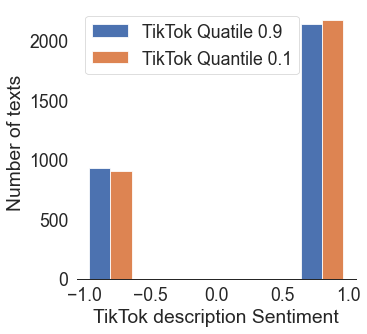

<Figure size 1440x1440 with 0 Axes>

For field - shareCount


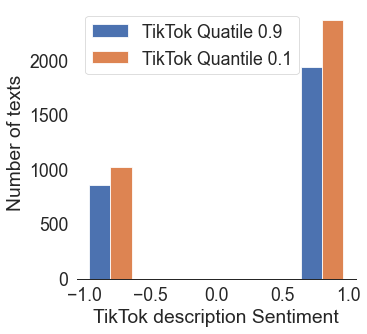

<Figure size 1440x1440 with 0 Axes>

For field - commentCount


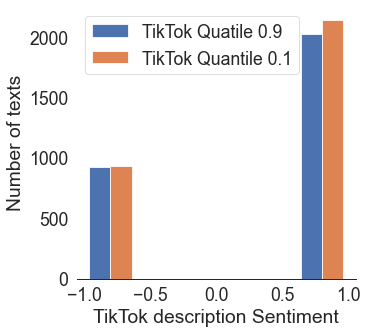

<Figure size 1440x1440 with 0 Axes>

For field - playCount


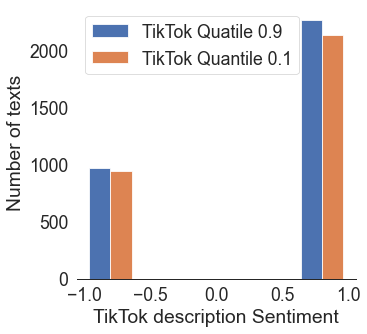

<Figure size 1440x1440 with 0 Axes>

-------------------------------------------------------
Tag: queer
For field - diggCount


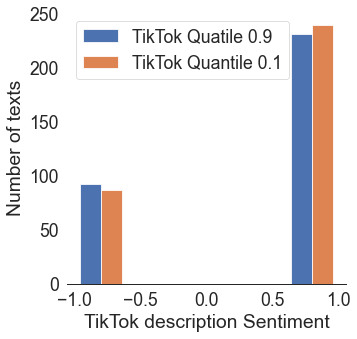

<Figure size 1440x1440 with 0 Axes>

For field - shareCount


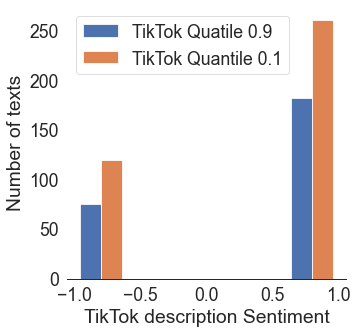

<Figure size 1440x1440 with 0 Axes>

For field - commentCount


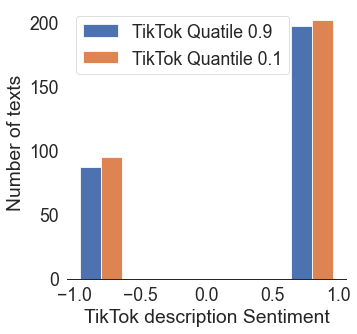

<Figure size 1440x1440 with 0 Axes>

For field - playCount


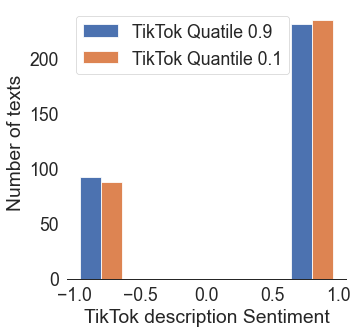

<Figure size 1440x1440 with 0 Axes>

-------------------------------------------------------
('mentalhealth', 10)
('men', 10)
('queer', 10)
[('mentalhealth', 0.690846286701209, -0.30915371329879104), ('men', 0.6942264028543627, -0.30577359714563734), ('queer', 0.6954656862745098, -0.3045343137254902)]


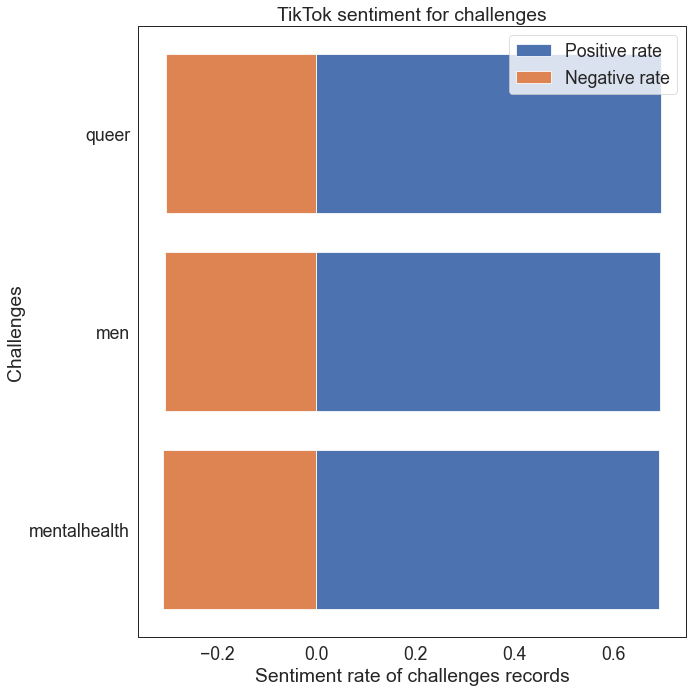

In [415]:
show_tiktok_challenges([('mentalhealth', 10), ('men', 10), ('queer', 10)])

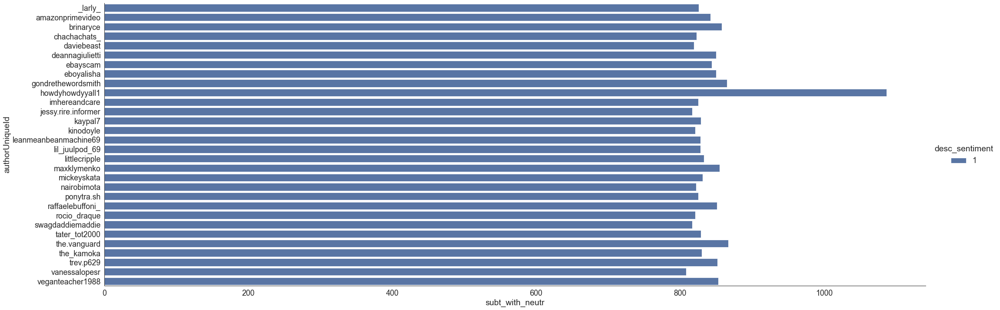

In [423]:
df_tiktok_author = df_tiktok.groupby(['authorUniqueId', 'desc_sentiment']).count().reset_index()

g = sns.catplot(y="authorUniqueId", x="subt_with_neutr", hue="desc_sentiment", 
                data=df_tiktok_author[(df_tiktok_author['year'] > 800)], 
                kind="bar", 
                height=10,
                aspect=3)
plt.show()

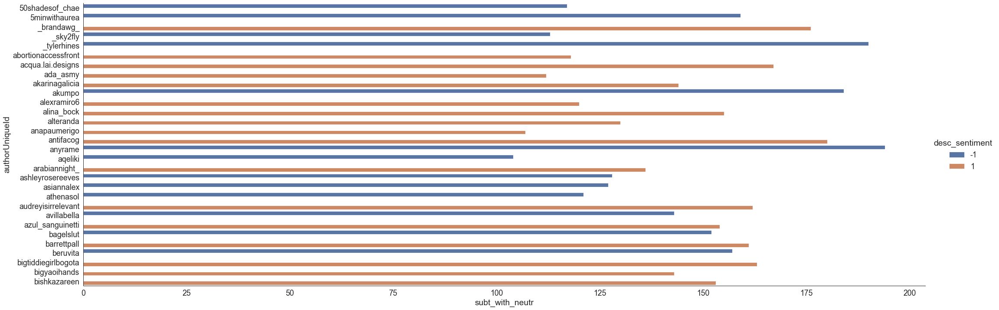

In [431]:
df_tiktok_author = df_tiktok.groupby(['authorUniqueId', 'desc_sentiment']).count().reset_index()

g = sns.catplot(y="authorUniqueId", x="subt_with_neutr", hue="desc_sentiment", 
                data=df_tiktok_author[(df_tiktok_author['year'] > 100) & (df_tiktok_author['year'] < 200)][:30], 
                kind="bar", 
                height=10,
                aspect=3)
plt.show()

In [424]:
df_tiktok_author.head()

,authorUniqueId,desc_sentiment,id,desc,createTime,video_duration,authorId,musicTitle,challenges,diggCount,...,desc_positive_prob,stickerText_negative_prob,stickerText_positive_prob,subtitles_sentiment,desc_sentiment_with_neutr,subt_with_neutr,date,date_info,year,challenges_str
0,........._aj,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
1,........bxddie.......x,-1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
2,......wavvy,-1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
3,.....eww,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
4,.....rainforest,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


## hashtag & profile intersection

In [435]:
instagram_tags = set(df_instagram.tag.values)

In [767]:
instagram_tags

{'activist',
 'ariannahuff',
 'audreygelman',
 'believesurvivors',
 'believewomen',
 'bringbackourgirls',
 'bumble',
 'effyourbeautystandards',
 'equality',
 'equalrights',
 'fem2',
 'feminism',
 'feminismo',
 'feminist',
 'feminista',
 'feministart',
 'feministfightclub',
 'femislay',
 'genderequality',
 'generationequality',
 'girlboss',
 'girlpower',
 'gloriasteinem',
 'gurlstalk',
 'heforshe',
 'humanrights',
 'iamanastywoman',
 'iamwithher',
 'intersectionalfeminism',
 'issarae',
 'iwillgoout',
 'lgbt',
 'makerswomen',
 'metoo',
 'niunamenos',
 'nomoore',
 'plannedparenthood',
 'prochoice',
 'sadgirlsclub',
 'sarahsophief',
 'selflove',
 'sherylsandberg',
 'strongwomen',
 'the.wing',
 'thefutureisfemale',
 'theriotgrrrlproject',
 'timesup',
 'timesupnow',
 'tothegirls',
 'whyididntreport',
 'whyistayed',
 'woman',
 'women',
 'womenempowerment',
 'womenincomics',
 'womenshould',
 'womensmarch',
 'womensreality',
 'womensrights',
 'womensupportingwomen',
 'yesallwomen'}

In [439]:
twitter_tags_lower = to_lower(twitter_tags)
tiktok_tags_lower = to_lower(tiktok_tags)
instagram_tags_lower = to_lower(instagram_tags)

In [438]:
def to_lower(ar):
    return set(map(lambda x:x.lower(), ar))

In [442]:
overall_intersection = list(twitter_tags_lower.intersection(tiktok_tags_lower, instagram_tags_lower))

In [671]:
tiktok_tags_lower.intersection(tiktok_tags_lower)

{'noboys',
 'oliv',
 'mojeciałomojadecyzja',
 'tilldeathdousapart',
 'भारत',
 'heterosenjaulas',
 'restaurantwork',
 'maytheforcebewithyou',
 'artandcraft',
 'stopdoingthat',
 'thedebate',
 'gobackinchallenge',
 'albeism',
 'fostercareadoption',
 'thedamntruth',
 'stitchslam',
 'weirduncle',
 'waterway',
 'sellouts',
 'ahemdabad',
 'dignityofteeth',
 'sentimento',
 'frenchiepuppy',
 'alfaiz',
 'bisexualornot',
 'chinesecresteddog',
 'thejoeroganexperience',
 'childhoodshows',
 'realtavsinstagram',
 'chimica',
 'enemiestolovers',
 'melaniatrumpstyle',
 'tiktokphim',
 'hmoob',
 'cheesetray',
 'badassmom',
 'libertadeconomica',
 'tiktokcreators',
 'intj',
 'vacances',
 'partyplanning',
 'thetarotpoems',
 'millennialproblems',
 'pittsburghpa',
 'gothfashion',
 'classroomdecor',
 'picante',
 'youngwoman',
 'reyna',
 'taimiapp',
 'phieucungxechat',
 'davidblaine',
 'lgbtrights',
 'dirtydancing',
 'monologo',
 'callthepolice',
 'coronaseason',
 'anyoneelse',
 'youtubevstiktok',
 'neskoo',
 'm

In [662]:
overall_intersection

['women',
 'generationequality',
 'thefutureisfemale',
 'womenempowerment',
 'girlpower',
 'equalrights',
 'womensrights',
 'prochoice',
 'timesup',
 'humanrights',
 'believewomen',
 'womensupportingwomen',
 'intersectionalfeminism',
 'woman',
 'equality',
 'heforshe',
 'genderequality',
 'feminism',
 'selflove',
 'lgbt',
 'strongwomen',
 'metoo',
 'girlboss',
 'feministart',
 'feminist']

In [664]:
len(overall_intersection)

25

In [690]:
tags_data = []

In [691]:
for t in overall_intersection:
    _df_twitter = df_twitter_joined[df_twitter_joined['tags_str'].str.contains(t)]
    twitter_pos = len(_df_twitter[_df_twitter['sentiment'] == 1])
    twitter_neg = len(_df_twitter) - twitter_pos
    
    _df_instagram = df_instagram[df_instagram['tag'] == t]
    inst_pos = len(_df_instagram[_df_instagram['sentiment'] == 1])
    inst_neg = len(_df_instagram) - inst_pos
    
    _df_tiktok = df_tiktok[df_tiktok['challenges_str'].str.contains(t)]
    tiktok_descr_pos = len(_df_tiktok[_df_tiktok['desc_sentiment'] == 1])
    tiktok_descr_neg = len(_df_tiktok) - tiktok_descr_pos
    tiktok_sub_pos = len(_df_tiktok[_df_tiktok['subtitles_sentiment'] == 1])
    tiktok_sub_neg = len(_df_tiktok) - tiktok_sub_pos
    
    print(t, len(_df_twitter), len(_df_instagram), len(_df_tiktok))
    twitter_rate = twitter_pos / (twitter_pos + twitter_neg+0.001)
    print(f'Twitter pos rate: {twitter_rate*100}, {twitter_pos}, {twitter_neg}')
    inst_rate = inst_pos / (inst_pos + inst_neg+0.001)
    print(f'Instagram pos rate: {inst_rate*100}, {inst_pos}, {inst_neg}')    
    tiktok_desc_rate = tiktok_descr_pos / (tiktok_descr_pos + tiktok_descr_neg+0.001)
    print(f'TikTok descriptions pos rate: {tiktok_desc_rate*100}, {tiktok_descr_pos}, {tiktok_descr_neg}')
    tiktok_subt_rate = tiktok_sub_pos / (tiktok_sub_pos + tiktok_sub_neg+0.001)
    print(f'TikTok subtitles rate: {tiktok_subt_rate*100}, {tiktok_sub_pos}, {tiktok_sub_neg}') 
    print(f'Average sentiment: {(twitter_rate+inst_rate+tiktok_desc_rate+tiktok_subt_rate)/4*100}')
    print('---------')
    
    tags_data.append([t, len(_df_twitter), len(_df_instagram), len(_df_tiktok), 
                     twitter_rate*100, twitter_pos, twitter_neg,
                     inst_rate*100, inst_pos, inst_neg,
                     tiktok_desc_rate*100, tiktok_descr_pos, tiktok_descr_neg,
                     tiktok_subt_rate*100, tiktok_sub_pos, tiktok_sub_neg,
                     (twitter_rate+inst_rate+tiktok_desc_rate+tiktok_subt_rate)/4*100])

women 9661 362 14229
Twitter pos rate: 54.52851107250688, 5268, 4393
Instagram pos rate: 62.15452443501538, 225, 137
TikTok descriptions pos rate: 69.14751077746077, 9839, 4390
TikTok subtitles rate: 29.074423425790748, 4137, 10092
Average sentiment: 53.726242427693435
---------
generationequality 0 2150 1
Twitter pos rate: 0.0, 0, 0
Instagram pos rate: 64.55810950785603, 1388, 762
TikTok descriptions pos rate: 99.90009990009992, 1, 0
TikTok subtitles rate: 0.0, 0, 1
Average sentiment: 41.11455235198898
---------
thefutureisfemale 24 656 16
Twitter pos rate: 54.16440981625765, 13, 11
Instagram pos rate: 61.2803943896427, 402, 254
TikTok descriptions pos rate: 93.74414099118805, 15, 1
TikTok subtitles rate: 31.248046997062684, 5, 11
Average sentiment: 60.109248048537765
---------
womenempowerment 2630 352 1609
Twitter pos rate: 56.23572006246385, 1479, 1151
Instagram pos rate: 62.783912545703004, 221, 131
TikTok descriptions pos rate: 69.42195809698067, 1117, 492
TikTok subtitles rate: 

In [692]:
df_hashtags = pd.DataFrame(data=tags_data, columns=['hashtag', 'twitter_length', 'instagram_length', 'tiktok_length', 
                                                    'twitter_rate', 'twitter_pos', 'twitter_neg',
                                                   'instagram_rate', 'instagram_pos', 'instagram_neg',
                                                   'tiktok_desc_rate', 'tiktok_desc_pos', 'tiktok_desc_neg',
                                                   'tiktok_subt_rate', 'tiktok_subt_pos', 'tiktok_subt_neg', 
                                                   'avg'])

In [693]:
df_hashtags.head()

,hashtag,twitter_length,instagram_length,tiktok_length,twitter_rate,twitter_pos,twitter_neg,instagram_rate,instagram_pos,instagram_neg,tiktok_desc_rate,tiktok_desc_pos,tiktok_desc_neg,tiktok_subt_rate,tiktok_subt_pos,tiktok_subt_neg,avg
0,women,9661,362,14229,54.528511,5268,4393,62.154524,225,137,69.147511,9839,4390,29.074423,4137,10092,53.726242
1,generationequality,0,2150,1,0.000000,0,0,64.558110,1388,762,99.900100,1,0,0.000000,0,1,41.114552
2,thefutureisfemale,24,656,16,54.164410,13,11,61.280394,402,254,93.744141,15,1,31.248047,5,11,60.109248
3,womenempowerment,2630,352,1609,56.235720,1479,1151,62.783913,221,131,69.421958,1117,492,28.962070,466,1143,54.350915
4,girlpower,1279,344,1569,56.372122,721,558,68.313755,235,109,69.789630,1095,474,29.572958,464,1105,56.012116


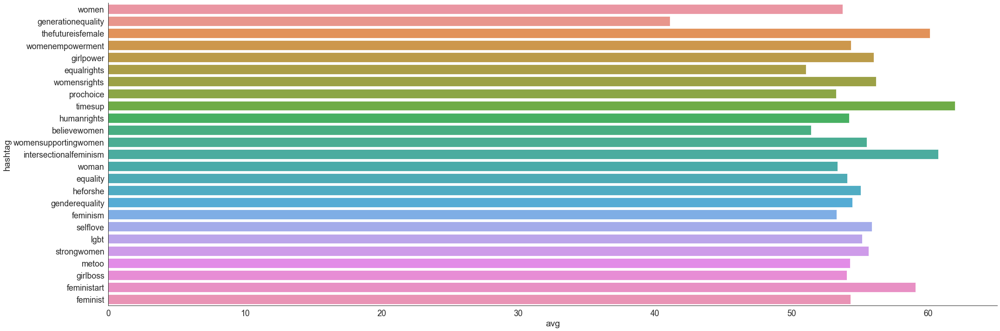

In [694]:
g = sns.catplot(y="hashtag", x="avg",  
                data=df_hashtags, 
                kind="bar", 
                height=10,
                aspect=3)
plt.show()

<AxesSubplot:ylabel='hashtag'>

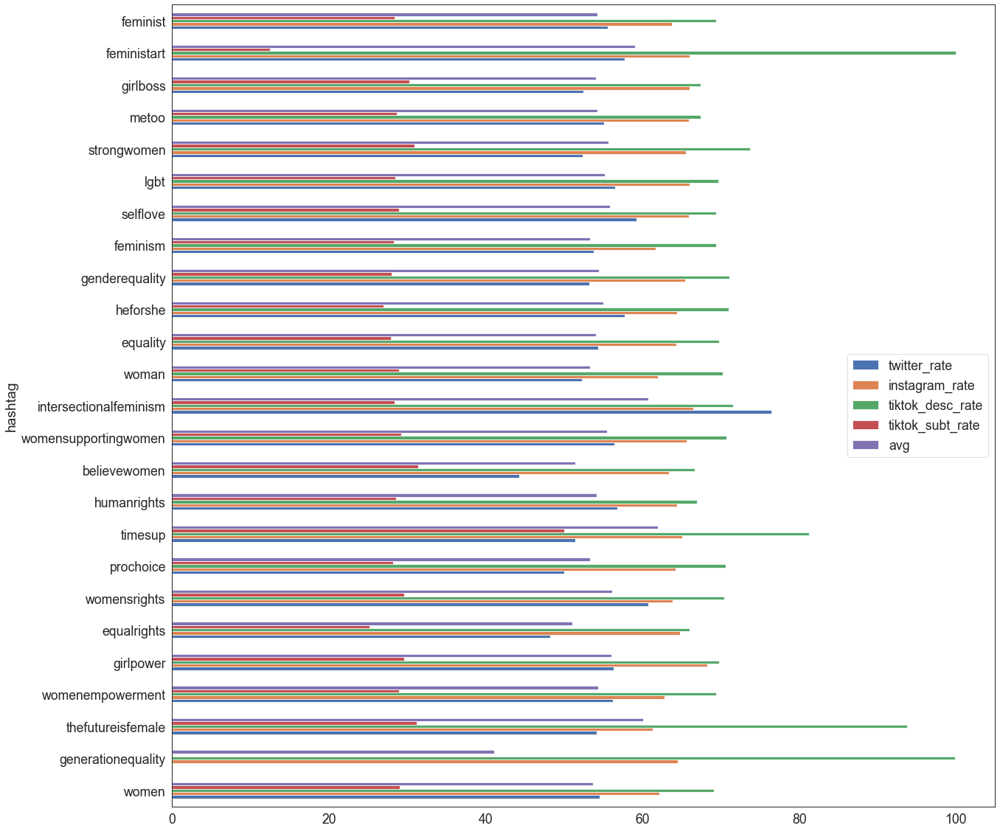

In [707]:
df_hashtags[['hashtag', 'twitter_rate', 'instagram_rate', 'tiktok_desc_rate', 'tiktok_subt_rate', 'avg']].set_index('hashtag').plot.barh(rot=0)

## Neutral Sentiment 

In [710]:
df_instagram_labelled = pd.read_json('sentiment/sentiment_simple_proc_instagram_labelled.json')
df_reddit_labelled = pd.read_json('sentiment/sentiment_simple_proc_reddit_labelled.json')
df_twitter_labelled = pd.read_json('sentiment/sentiment_simple_proc_twitter_labelled.json')
df_tiktok_labelled = pd.read_json('sentiment/sentiment_simple_proc_tiktok_labelled.json')

In [722]:
def show_distribution_v2(df, pos_field, neg_field, type): 
    plt.figure(figsize=(10, 10))
    ax = sns.distplot(df[pos_field],kde=False, rug=True, bins=40, label=type, color="skyblue")
    sns.distplot(df[neg_field],kde=False, rug=True, bins=40, label=type, color="red")
    ax.set(xlabel=f'{type} sentiment', ylabel='count of records')
    plt.show()
    
def show_netr_distr(df, type):
    _df = df[df['sentiment'] == 0]
    show_distribution_v2(_df, 'pos_prob', 'neg_prob', type)

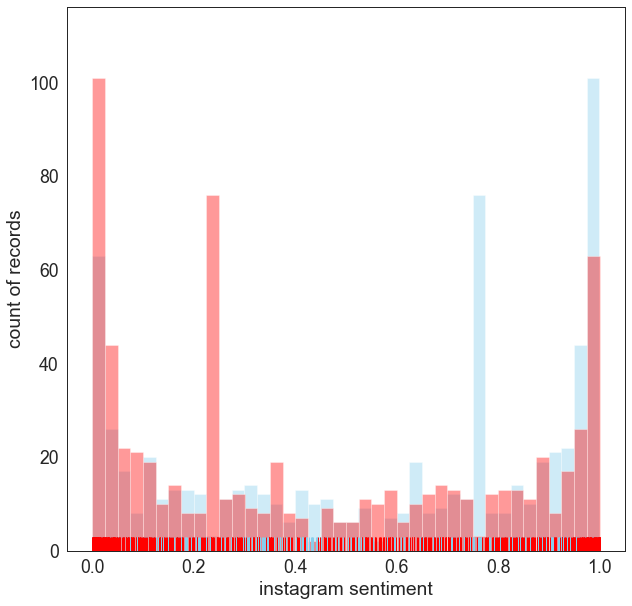

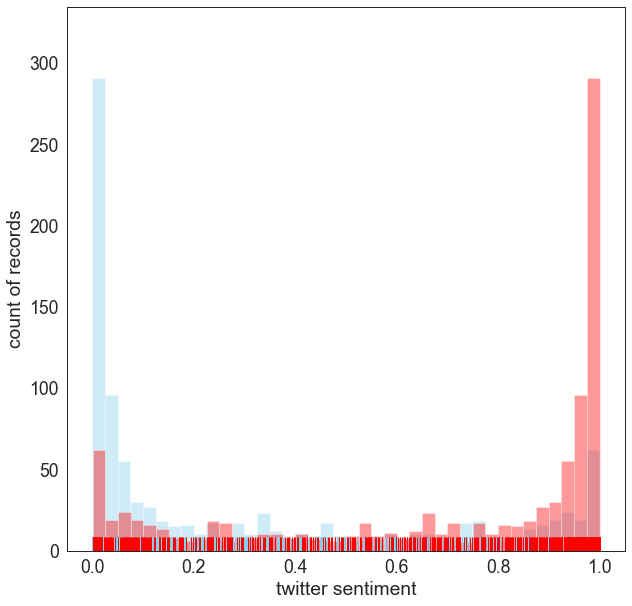

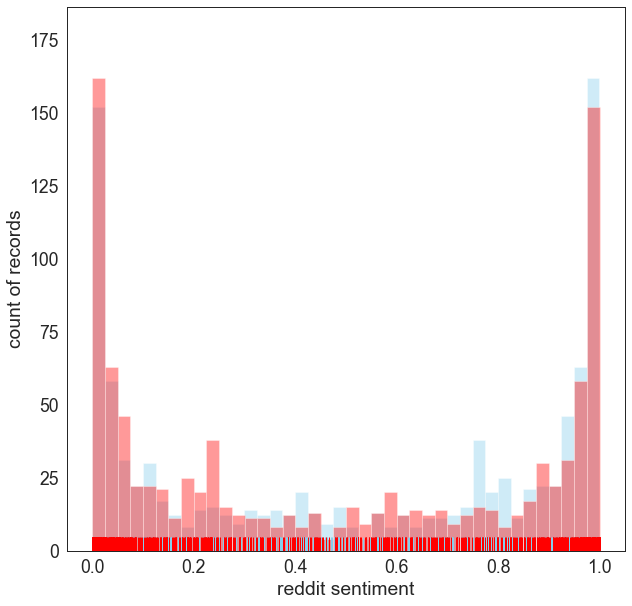

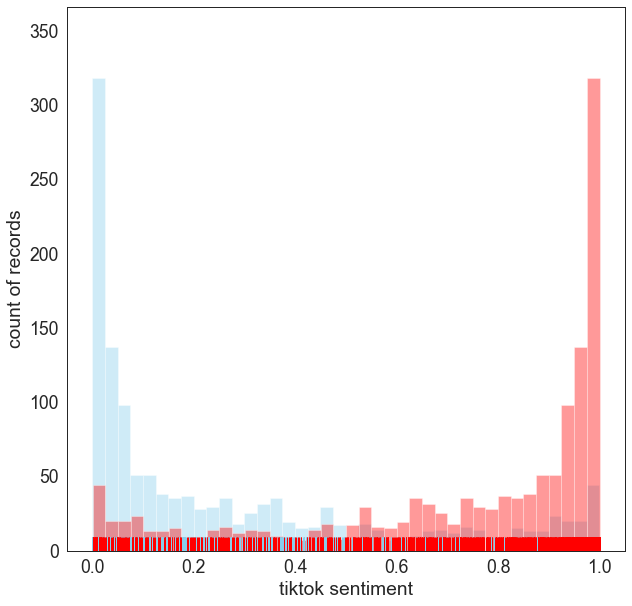

In [724]:
show_netr_distr(df_instagram_labelled, 'instagram')
show_netr_distr(df_twitter_labelled, 'twitter')
show_netr_distr(df_reddit_labelled, 'reddit')
show_netr_distr(df_tiktok_labelled, 'tiktok')

In [764]:
def apply_neutral_sentiment(df, neutr_field, field):
#     df[neutr_field] = df[field].apply(lambda t: 1 if t >= 0.9 else -1 if t <= 0.1 else 0)
    df[neutr_field] = df[field].apply(lambda t: 1 if t >= 0.675 else -1 if t <= 0.33 else 0)
    return df

In [765]:
df_instagram_labelled = apply_neutral_sentiment(df_instagram_labelled, 'pred_sentiment', 'pos_prob')
df_twitter_labelled = apply_neutral_sentiment(df_twitter_labelled, 'pred_sentiment', 'pos_prob')
df_reddit_labelled = apply_neutral_sentiment(df_reddit_labelled, 'pred_sentiment', 'pos_prob')
df_tiktok_labelled = apply_neutral_sentiment(df_tiktok_labelled, 'pred_sentiment', 'pos_prob')

In [762]:
def cacl_neutr_rate(df):
    _df = df[df['sentiment'] == 0]
    _df_pos = df[df['sentiment'] == 1]
    _df_neg = df[df['sentiment'] == -1]
    n_r = len(_df[_df['pred_sentiment'] == 0]) / len(_df) * 100
    pos_r = len(_df_pos[_df_pos['pred_sentiment'] == 1]) / len(_df_pos) * 100
    neg_r = len(_df_neg[_df_neg['pred_sentiment'] == 1]) / len(_df_neg) * 100
    return n_r, pos_r, neg_r

In [763]:
#     df[neutr_field] = df[field].apply(lambda t: 1 if t >= 0.9 else -1 if t <= 0.1 else 0)
print(cacl_neutr_rate(df_instagram_labelled))
print(cacl_neutr_rate(df_twitter_labelled))
print(cacl_neutr_rate(df_reddit_labelled))
print(cacl_neutr_rate(df_tiktok_labelled))

(57.22379603399433, 28.037383177570092, 28.79581151832461)
(38.9344262295082, 17.180616740088105, 13.432835820895523)
(45.5435847208619, 31.05134474327628, 24.45255474452555)
(47.682119205298015, 6.13107822410148, 7.6923076923076925)


In [766]:
#     df[neutr_field] = df[field].apply(lambda t: 1 if t >= 0.675 else -1 if t <= 0.33 else 0)
print(cacl_neutr_rate(df_instagram_labelled))
print(cacl_neutr_rate(df_twitter_labelled))
print(cacl_neutr_rate(df_reddit_labelled))
print(cacl_neutr_rate(df_tiktok_labelled))

(17.70538243626062, 52.336448598130836, 48.69109947643979)
(14.549180327868852, 26.651982378854626, 22.388059701492537)
(15.279138099902056, 43.52078239608802, 41.42335766423358)
(17.218543046357617, 15.644820295983086, 18.34319526627219)
